# Deep Learning in News Analysis Version 3.4.2

This notebook is to demonstrate a binary classification for GPR news articles(Conflicts topic) in Deep Learning.

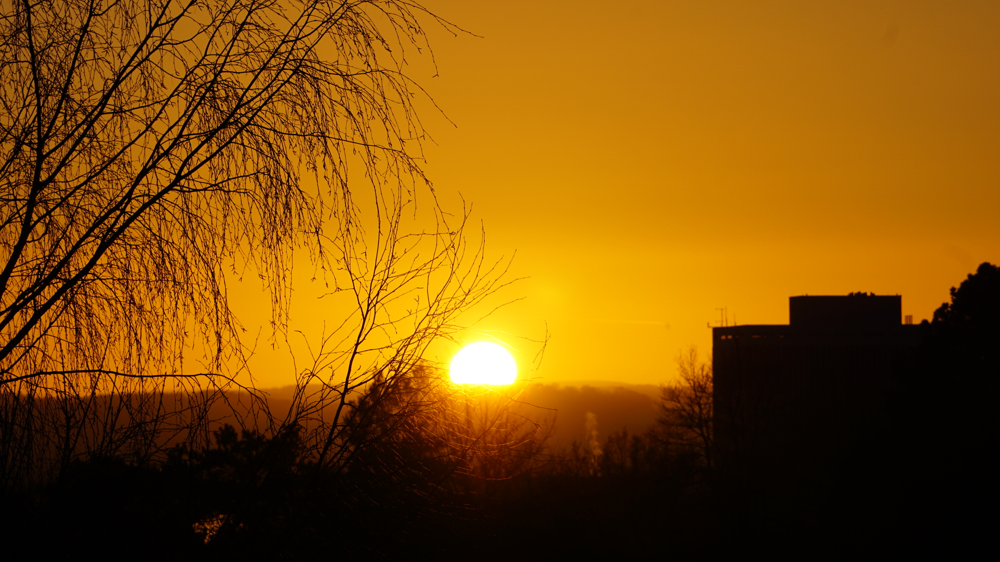

# 1 Load libraries

In [2]:
import openpyxl
from pathlib import Path
from openpyxl import load_workbook
# Load libraries
import numpy as np
import pandas as pd

# Visualization
from pandas import read_excel, set_option
from pandas.plotting import scatter_matrix

import plotly
import plotly.express as px
import plotly.graph_objects as go
import chart_studio.plotly as py
import plotly.figure_factory as ff
import plotly.offline as py
py.init_notebook_mode()
import cufflinks
import datetime
# from multiprocessing import Pool, cpu_count
import os
from time import time

from plotly.offline import iplot
import cufflinks as cf
cf.go_offline()
#colab plot display
# import plotly.io as pio
# pio.renderers.default = 'colab'

import pprint
from termcolor import colored


# Metrics
from sklearn.metrics import classification_report, confusion_matrix, \
      accuracy_score,plot_confusion_matrix,\
      plot_roc_curve, roc_curve, roc_auc_score,auc
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, f1_score, precision_score,\
                            recall_score, roc_auc_score



#Libraries for feature extraction and topic modeling
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
#from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import re
from nltk.tokenize import word_tokenize
import string
from nltk.corpus import stopwords
from __future__ import  print_function

from importlib import reload
import nltk
nltk.download('punkt')
nltk.download('stopwords')

# others
import IPython
import IPython.display
from tqdm.notebook import tqdm


#Diable the warnings
import warnings
warnings.filterwarnings("ignore") 

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Flatten, LSTM, Dropout, Activation
from keras.layers.embeddings import Embedding
from tensorflow.keras.regularizers import l1_l2, l2,l1

# Deep Learning
import tensorflow
from tensorflow import keras
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l1_l2, l2,l1
from tensorflow.keras import models, initializers, layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Dense, LSTM, Input,Flatten, GRU, SimpleRNN, RNN, ELU
from tensorflow.keras.layers import TimeDistributed,BatchNormalization, Bidirectional, RepeatVector
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Nadam,Ftrl
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.layers import Conv1D, MaxPooling1D, ConvLSTM2D
from tensorflow.keras.experimental import PeepholeLSTMCell

[nltk_data] Downloading package punkt to /home/jason/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jason/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
# %%capture
# !pip install watermark
%load_ext watermark
%watermark -a "Jason Lu" -u -d -p numpy,pandas,scipy,gensim,plotly,spacy,tensorflow,keras

Author: Jason Lu

Last updated: 2022-04-11

numpy     : 1.21.2
pandas    : 1.4.1
scipy     : 1.7.3
gensim    : 3.8.3
plotly    : 5.6.0
spacy     : 2.3.7
tensorflow: 2.8.0
keras     : 2.8.0



# 2 Load Data

In [5]:
data = pd.read_csv('data/PolRisk_data.csv')
data = data.iloc[:,1:]

In [6]:
data.shape

(2772, 9)

# 3 Check null values

In [7]:
data.isnull().sum()

title                   0
description            58
content                 0
publishedAt           100
political_risk          0
geo_location         1420
primary_country      2582
spacy_sim_content    1576
secondary_country    2770
dtype: int64

Ensure column `content` contains no null values

# 4 Data Preprocessing

In [8]:
def Pre_Processing(text):    
    tokens = word_tokenize(text)
    
    # convert to lower case
    tokens = [w.lower() for w in tokens]
    
    # prepare regex for char filtering
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    
    # remove punctuation from each word
    stripped = [re_punc.sub('', w) for w in tokens]
    
    # remove remaining tokens that are not alphabetic
    words = [word for word in stripped if word.isalpha()]
    
    # filter out stop words
    stop_words = set(stopwords.words('english'))
    
    words = [w for w in words if not w in stop_words]
    
    return words

In [9]:
data['cleaned_content'] = data['content'].apply(lambda x: " ".join(Pre_Processing(x)))

In [10]:
data['title_desc_cont'] = (data['title']+ data['description']+data['content']).apply(lambda x: "" if pd.isna(x) else str(x))

In [11]:
data['cleaned_articles'] = data['title_desc_cont'].apply(lambda x: " ".join(Pre_Processing(x)))

In [12]:
data.head(1)

,title,description,content,publishedAt,political_risk,geo_location,primary_country,spacy_sim_content,secondary_country,cleaned_content,title_desc_cont,cleaned_articles
0,"Kazakh protesters beaten, tortured after unres...",Kazakh security forces cracking down on unrest...,"ALMATY, Feb 2 (Reuters) - Kazakh security forc...",2022-02-02T12:08:00Z,1.0,"Kazakhstan, Central Asia (written in Almaty, t...","Kazakhstan, Central Asia (written in Almaty, t...",NaN,NaN,almaty feb reuters kazakh security forces crac...,"Kazakh protesters beaten, tortured after unres...",kazakh protesters beaten tortured unrest hrw r...


# 5 Prepare data for Deep Learning

Train and Split

In [13]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(data, test_size = 0.2,random_state = 42)

In [14]:
y_train = df_train['political_risk']
y_test = df_test['political_risk']

Word embeding

In [15]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer(num_words=5000)
tokenizer.fit_on_texts(df_train['content'])

X_train = tokenizer.texts_to_sequences(df_train['content'])
X_test = tokenizer.texts_to_sequences(df_test['content'])

vocab_size = len(tokenizer.word_index) + 1  # Adding 1 because of reserved 0 index
vocab_size

58694

With CountVectorizer, we had stacked vectors of word counts, and each vector was the same length (the size of the total corpus vocabulary). With Tokenizer, the resulting vectors equal the length of each text, and the numbers don’t denote counts, but rather correspond to the word values from the dictionary tokenizer.word_index.

In [16]:
for word in ['war', 'military', 'coup', 'attack']:
  print('{}: {}'.format(word, tokenizer.word_index[word]))

war: 92
military: 51
coup: 381
attack: 146


 One issue is that each text sequence has in most cases different length of words. pad the sequences into 150

In [17]:
from keras.preprocessing.sequence import pad_sequences

maxlen = 150

X_train = pad_sequences(X_train, padding='post', maxlen=maxlen)
X_test = pad_sequences(X_test, padding='post', maxlen=maxlen)

In [18]:
X_train[1, :]

array([  29,   57, 4622, 4621, 2475,    8,  258,    5,  963,  467,   10,
       3122,    6,  163, 2534,   18,    5, 2639,   19, 1900,    4, 2312,
        265,    9, 3319,    7, 2204, 2604,   11, 1818,    2,   26, 4620,
         29, 2389,  587,   42, 1051,    1, 3814, 1797,  141,  114,  194,
        490,    3, 1687,    8,  314,   76,    9,  145,  328,  183,    2,
        101,  516,  649,   18, 4623, 4047,   11,    1, 2718,  766,  646,
          3, 2640, 1798,  559,   14,    1,  101, 1797,    9,  559, 4127,
         43,    1,  416,  444,    4,  338, 1016,   14,   32, 1114,  153,
          1,  135,  322,  138,    5,  536,  276,    3,   49,  358,    6,
         57,  527,  865, 1463, 1723,    4,   68,  349,  964, 1819, 2112,
       1248,    6,  303,   81,    8,  641,   50,    9,    5,  145,  965,
          3,   78,  346,  485,   22, 1099, 2682, 4047,  285,  965,    4,
        715,   75,   10,  521, 4047,    4,   22, 2682, 4047,  285,   53,
       4624, 1445,   23,  108,    3,    1, 2641], d

In [19]:
X_train.shape

(2217, 150)

In [20]:
X_test.shape

(555, 150)

# 6 Deep learning Models

## 6.1 DNN

In [23]:
from keras.wrappers.scikit_learn import KerasClassifier
import tensorflow_addons as tfa

embedding_dim = 300

model = Sequential()
model.add(layers.Embedding(input_dim=20000, 
                           output_dim=embedding_dim, 
                           input_length=maxlen))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='selu',
                       kernel_regularizer= l2(1e-4),
                       kernel_initializer='lecun_normal'))
model.add(layers.Dense(1, activation='sigmoid'))

#optimizer = Adam(learning_rate=0.001,beta_1=0.9,beta_2=0.999,epsilon=1e-8)
optimizer = Nadam(learning_rate=0.005)

def DNN_accuracy():  
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])    
    return model

def DNN_precision():  
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['Precision'])    
    return model

def DNN_recall():  
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['Recall'])    
    return model

def DNN_auc():  
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['AUC'])    
    return model

def DNN_mse():  
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['mean_squared_error'])    
    return model

F1 = tfa.metrics.F1Score(num_classes=2)
def DNN_f1():  
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=[F1])    
    return model


model_list = [DNN_accuracy,DNN_precision, DNN_recall, DNN_auc, DNN_mse,]

DNN_performance = pd.DataFrame(columns=['train_results','test_results','metric','pred_time','fitting_time'])

df_history_DNN = pd.DataFrame()

DNN_histories = []

for i in model_list:

    model_DNN = KerasClassifier(build_fn=i, epochs=10, verbose=1, validation_split=0.2)

    start = time()
    
    history = model_DNN.fit(X_train, y_train, batch_size= 32)    
    
    DNN_histories.append(history.history)
    
    fitting_time = time() - start

    if i ==  DNN_accuracy:
        metric_score = accuracy_score
        metric_name = 'accuracy'
        
    elif i == DNN_precision:
        metric_score = precision_score
        metric_name = 'precision'
        
    elif i==DNN_recall:
        metric_score = recall_score
        metric_name = 'recall'
        
    elif i== DNN_auc:
        metric_score = roc_auc_score
        metric_name = 'auc'
        
    elif i==DNN_mse:
        metric_score = mean_squared_error
        metric_name = 'MSE'
        
    elif i==DNN_f1:
        metric_score = F1
        metric_name = 'f1_score'
        
    df=pd.DataFrame(history.history)    
    df['metric'] = metric_name
    df_history_DNN = df_history_DNN.append(df,ignore_index=True)
    
    start = time()
    
    if i==DNN_f1:
        start = time()
        # train results
        train_result_DNN =metric_score.update_state(y_train,model_DNN.predict(X_train))
        # Test results
        test_result_DNN = metric_score.update_state(y_test,model_DNN.predict(X_test))
        pred_time = time() - start
    else:
        start = time()
        # train results
        train_result_DNN = metric_score(model_DNN.predict(X_train), y_train)
        # Test results
        test_result_DNN = metric_score(model_DNN.predict(X_test), y_test)
    
        pred_time = time() - start
    
    DNN_performance = DNN_performance.append({'train_results':train_result_DNN,
                                                'test_results':test_result_DNN,
                                                'metric':metric_name,
                                                'fitting_time':fitting_time,
                                              'pred_time':pred_time},
                                               ignore_index=True)
    
IPython.display.clear_output()    
DNN_performance['names'] = 'DNN'
DNN_performance.set_index('names',inplace=True)

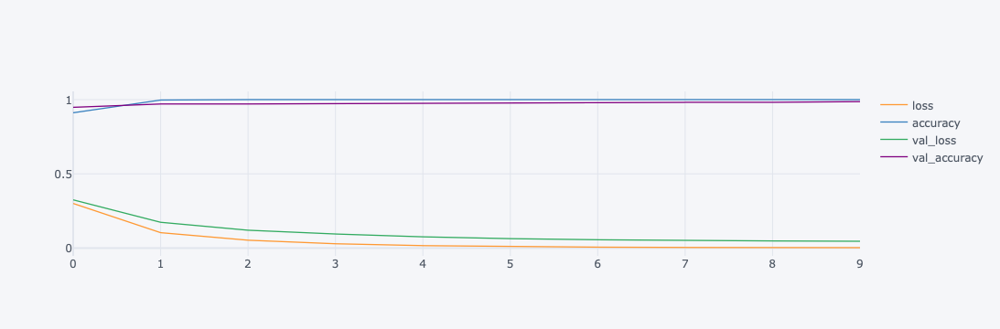

In [24]:
pd.DataFrame(DNN_histories[0]).iplot()

In [25]:
DNN_performance

,train_results,test_results,metric,pred_time,fitting_time
names,,,,,
DNN,0.997294,0.989189,accuracy,0.22222,14.190547
DNN,0.995446,0.989583,precision,0.195786,13.934201
DNN,0.999086,0.996479,recall,0.190763,13.702326
DNN,0.997761,0.992676,auc,0.189614,13.630071
DNN,0.001804,0.012613,MSE,0.190078,13.335085


In [26]:
df_performance_all = pd.read_excel('data/df_performance_all.xlsx')

In [27]:
df_performance_all.query('names=="MLP"').sort_values(by=['test_results'],ascending=False)

,names,train_results,test_results,metric,time_secs,kfold_results,kfold_mean,kfold_std
29,MLP,1.0,0.993056,precision,749.796995,[0.98165138 0.97560976 0.97345133 0.975 0...,0.971020,0.016282
71,MLP,1.0,0.984509,f1_score,766.511185,[0.99074074 0.98360656 0.98214286 0.9790795 0...,0.980336,0.009164
57,MLP,1.0,0.984238,auc,1523.238559,[0.9977245 0.99590868 0.99943186 0.99910255 0...,0.996670,0.003237
85,MLP,1.0,0.983784,accuracy,741.774925,[0.99099099 0.98198198 0.98198198 0.97747748 0...,0.980596,0.009721
43,MLP,1.0,0.976109,recall,779.221327,[1. 0.99173554 0.99099099 0.98319328 0...,0.991870,0.004663
15,MLP,0.0,0.016216,MSE,749.055469,[0.00900901 0.01801802 0.01801802 0.01801802 0...,0.018954,0.009670


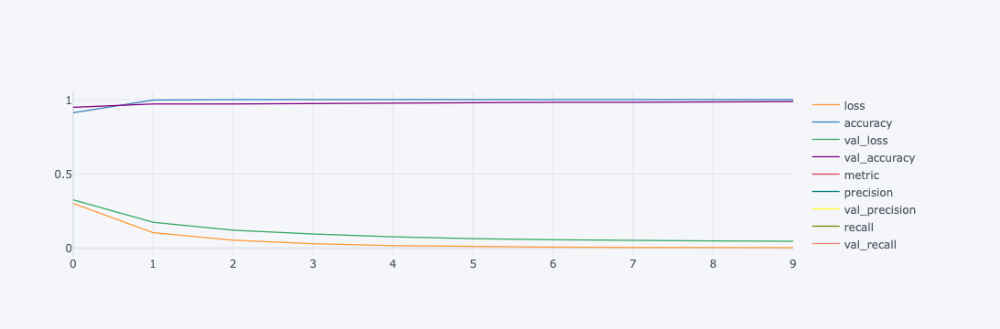

In [28]:
df_history_DNN.query('metric=="accuracy"').iplot()

In [29]:
model_DNN = KerasClassifier(build_fn=DNN_accuracy, epochs=10, verbose=1, validation_split=0.2)
DNN_history = model_DNN.fit(X_train, y_train, batch_size= 32)

Epoch 1/10
56/56 [==============================] - 2s 25ms/step - loss: 4.5301e-04 - accuracy: 1.0000 - val_loss: 0.0382 - val_accuracy: 0.9865
Epoch 2/10
56/56 [==============================] - 1s 22ms/step - loss: 4.7333e-04 - accuracy: 1.0000 - val_loss: 0.0406 - val_accuracy: 0.9887
Epoch 3/10
56/56 [==============================] - 1s 23ms/step - loss: 4.3775e-04 - accuracy: 1.0000 - val_loss: 0.0401 - val_accuracy: 0.9887
Epoch 4/10
56/56 [==============================] - 1s 23ms/step - loss: 4.2807e-04 - accuracy: 1.0000 - val_loss: 0.0369 - val_accuracy: 0.9910
Epoch 5/10
56/56 [==============================] - 1s 23ms/step - loss: 4.8027e-04 - accuracy: 1.0000 - val_loss: 0.0385 - val_accuracy: 0.9887
Epoch 6/10
56/56 [==============================] - 1s 23ms/step - loss: 4.5211e-04 - accuracy: 1.0000 - val_loss: 0.0409 - val_accuracy: 0.9887
Epoch 7/10
56/56 [==============================] - 1s 23ms/step - loss: 4.0914e-04 - accuracy: 1.0000 - val_loss: 0.0368 - val_ac

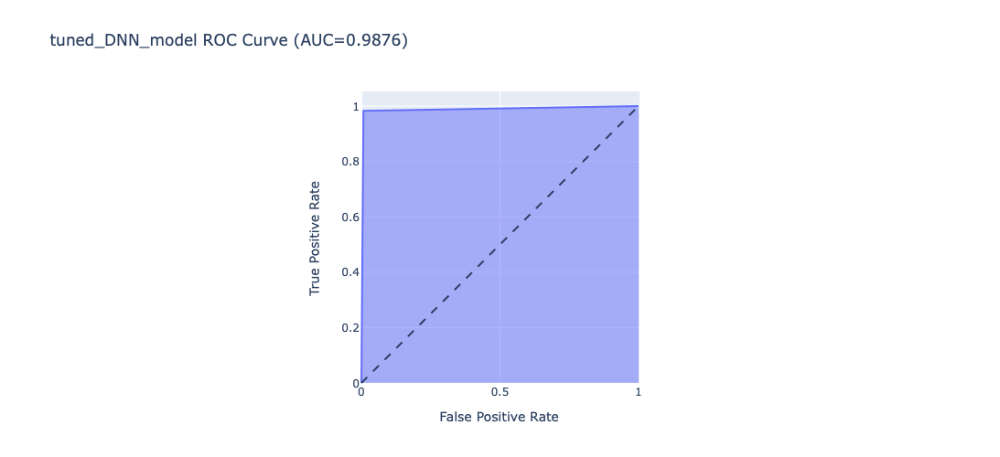

In [30]:
from Utilities.binary_roc_curve import ROC_curve
y_score = model_DNN.predict(X_test)[:, 0]
y_true = y_test
chart_name = 'tuned_DNN_model'
ROC_curve(y_true, y_score,chart_name)

In [31]:
# display accuracy score, confusion matrix and classification report of tuned model
model_DNN_pred = (model_DNN.predict(X_test) > 0.5).astype("int32")[:, 0]
print(accuracy_score(y_test, model_DNN_pred))
print(confusion_matrix(y_test, model_DNN_pred))
print(classification_report(y_test, model_DNN_pred))

0.9873873873873874
[[265   2]
 [  5 283]]
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99       267
         1.0       0.99      0.98      0.99       288

    accuracy                           0.99       555
   macro avg       0.99      0.99      0.99       555
weighted avg       0.99      0.99      0.99       555



## 6.2 LSTM

In [32]:
from keras.wrappers.scikit_learn import KerasClassifier
embedding_dim = 50

model = Sequential()
model.add(Embedding(input_dim=vocab_size, 
                           output_dim=embedding_dim, 
                           input_length=maxlen))
# model.add(LSTM(128, dropout=0.2, recurrent_dropout=0.2,return_sequences=True))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2,kernel_regularizer=l2(1e-4),
                    recurrent_regularizer=l2(1e-4)))
model.add(Dense(1, activation='sigmoid'))
    
def LSTM_accuracy():  
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])    
    return model

def LSTM_precision():  
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['Precision'])    
    return model

def LSTM_recall():  
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['Recall'])    
    return model

def LSTM_auc():  
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['AUC'])    
    return model

def LSTM_mse():  
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['mean_squared_error'])    
    return model

model_list = [LSTM_accuracy,LSTM_precision, LSTM_recall, LSTM_auc, LSTM_mse]

LSTM_performance = pd.DataFrame(columns=['train_results','test_results','metric','pred_time','fitting_time'])

df_history_LSTM = pd.DataFrame()

for i in model_list:

    model_LSTM = KerasClassifier(build_fn=i, epochs=10, verbose=1, validation_split=0.4)

    start = time()
    LSTM_history = model_LSTM.fit(X_train, y_train)
    fitting_time = time() - start

    if i ==  LSTM_accuracy:
        metric_score = accuracy_score
        metric_name = 'accuracy'
        
    elif i == LSTM_precision:
        metric_score = precision_score
        metric_name = 'precision'
        
    elif i==LSTM_recall:
        metric_score = recall_score
        metric_name = 'recall'
        
    elif i== LSTM_auc:
        metric_score = roc_auc_score
        metric_name = 'auc'
        
    elif i==LSTM_mse:
        metric_score = mean_squared_error
        metric_name = 'MSE'
        
    df=pd.DataFrame(LSTM_history.history)    
    df['metric'] = metric_name
    df_history_LSTM = df_history_LSTM.append(df,ignore_index=True)
    
    start = time()
    # train results
    train_result_LSTM = metric_score(model_LSTM.predict(X_train), y_train)
    # Test results
    test_result_LSTM = metric_score(model_LSTM.predict(X_test), y_test)
    
    pred_time = time() - start
    
    LSTM_performance = LSTM_performance.append({'train_results':train_result_LSTM,
                                                'test_results':test_result_LSTM,
                                                'metric':metric_name,
                                                'fitting_time':fitting_time,
                                                'pred_time':pred_time},
                                               ignore_index=True)
    
IPython.display.clear_output()    
LSTM_performance['names'] = 'LSTM'
LSTM_performance.set_index('names',inplace=True)

In [33]:
df_history_LSTM 

,loss,accuracy,val_loss,val_accuracy,metric,precision,val_precision,recall,val_recall,auc,val_auc,mean_squared_error,val_mean_squared_error
0,0.685605,0.624060,0.682475,0.570462,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.579859,0.696241,0.490289,0.885006,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.474108,0.866165,0.470885,0.817362,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.442448,0.836842,0.440559,0.826381,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.433684,0.835338,0.428030,0.836528,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.387367,0.851880,0.349313,0.857948,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0.312412,0.941353,0.220169,0.931229,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0.142470,0.975188,0.204596,0.949267,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,0.362343,0.887970,0.420381,0.803833,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0.265973,0.945113,0.337398,0.917700,accuracy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
LSTM_performance

,train_results,test_results,metric,pred_time,fitting_time
names,,,,,
LSTM,0.94046,0.926126,accuracy,1.752307,64.463344
LSTM,0.985428,0.96875,precision,1.721312,67.053584
LSTM,0.990842,0.978417,recall,1.739766,66.463446
LSTM,0.990978,0.976487,auc,1.742629,66.518951
LSTM,0.011276,0.041441,MSE,1.748461,66.783736


In [35]:
pd.concat([LSTM_performance,DNN_performance])

,train_results,test_results,metric,pred_time,fitting_time
names,,,,,
LSTM,0.94046,0.926126,accuracy,1.752307,64.463344
LSTM,0.985428,0.96875,precision,1.721312,67.053584
LSTM,0.990842,0.978417,recall,1.739766,66.463446
LSTM,0.990978,0.976487,auc,1.742629,66.518951
LSTM,0.011276,0.041441,MSE,1.748461,66.783736
DNN,0.997294,0.989189,accuracy,0.22222,14.190547
DNN,0.995446,0.989583,precision,0.195786,13.934201
DNN,0.999086,0.996479,recall,0.190763,13.702326
DNN,0.997761,0.992676,auc,0.189614,13.630071


In [36]:
df_performance_all.query('names=="MLP"').sort_values(by=['test_results'],ascending=False)

,names,train_results,test_results,metric,time_secs,kfold_results,kfold_mean,kfold_std
29,MLP,1.0,0.993056,precision,749.796995,[0.98165138 0.97560976 0.97345133 0.975 0...,0.971020,0.016282
71,MLP,1.0,0.984509,f1_score,766.511185,[0.99074074 0.98360656 0.98214286 0.9790795 0...,0.980336,0.009164
57,MLP,1.0,0.984238,auc,1523.238559,[0.9977245 0.99590868 0.99943186 0.99910255 0...,0.996670,0.003237
85,MLP,1.0,0.983784,accuracy,741.774925,[0.99099099 0.98198198 0.98198198 0.97747748 0...,0.980596,0.009721
43,MLP,1.0,0.976109,recall,779.221327,[1. 0.99173554 0.99099099 0.98319328 0...,0.991870,0.004663
15,MLP,0.0,0.016216,MSE,749.055469,[0.00900901 0.01801802 0.01801802 0.01801802 0...,0.018954,0.009670


# 7 Model Tuning

## 7.1 Tune DNN Grid1

In [89]:

# define a LSTM model for tuning
def tuning_DNN_model(N_Hidden=1,#  number of hidden layers
                      N_Neurons=100,  # umber of units
                      LR=0.01,       # earning rate
                      # DP=0.2,        # dropout rate
                      OPTIMIZER=Adam,# optimizer
                      ACTIVATION='selu',
                      LAMBDA=0.001, # LAMBDA                      
                      ):    
         
    # build model
    model= Sequential()
    
    for layer in range(N_Hidden):
      # selu needs to be with lecun_normal
      if (ACTIVATION=='selu'):
          INITIALIZER='lecun_normal'
      else:
           NITIALIZER='he_normal' 
            
      model.add(Embedding(20000, 300, input_length=150))
      model.add(layers.Flatten())
      model.add(Dense(N_Neurons, activation=ACTIVATION, 
                             kernel_initializer=INITIALIZER, 
                             kernel_regularizer=l2(LAMBDA),                           
                             )) 
                
      options = {}

    model.add(Dense(1, activation='sigmoid',**options))
    # optimizer
    optimizer = OPTIMIZER(learning_rate = LR)
    
    
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    
    return model

# save to KerasClassifier for tuning
clf_DNN = KerasClassifier(tuning_DNN_model, epochs = 10, verbose = 1)

In [90]:
# Test if 'tuning_DNN_model' funtion works
# fit model
DNN_history = clf_DNN.fit(X_train, y_train, epochs=2,validation_split=0.2, shuffle=False, verbose=1)

# clear epoches 
IPython.display.clear_output()
# evaluate model
acc_DNN = clf_DNN.score(X_test, y_test)
# predict model
y_pred = clf_DNN.predict(X_test) 

18/18 [==============================] - 0s 3ms/step - loss: 1.1101 - accuracy: 0.9532


In [32]:
# tuning hyperparameters using GridsearchCV
from sklearn.model_selection import GridSearchCV

# define parameters dictionary
param_dict = {'N_Neurons': [64,128,256],
              'N_Hidden':[1,2,3],
              'LR': [5e-5,5e-4,5e-3], 
              # 'DP':[0.1, 0.2, 0.3],
              'ACTIVATION':['relu','elu','selu'],
              'OPTIMIZER':[Nadam, Adam, RMSprop]
              }
# grid search
Grid_Search = GridSearchCV(estimator=clf_DNN, param_grid=param_dict, n_jobs=-1, cv=5)
# fit model
start = time()

Grid_Search_history = Grid_Search.fit(X_train, y_train, epochs=10, validation_split=0.2,verbose=1, shuffle=False)

IPython.display.clear_output()     
print(f'Model Tuning was completed in {time() - start:.2f} secs')
print('-'*65)

Model Tuning was completed in 9321.83 secs
-----------------------------------------------------------------


In [94]:
Grid_Search_history

GridSearchCV(cv=5,
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x7fdd7c61ae50>,
             n_jobs=-1,
             param_grid={'ACTIVATION': ['relu', 'elu', 'selu'],
                         'LR': [5e-05, 0.0005, 0.005], 'N_Hidden': [1, 2, 3],
                         'N_Neurons': [64, 128, 256],
                         'OPTIMIZER': [<class 'keras.optimizer_v2.nadam.Nadam'>,
                                       <class 'keras.optimizer_v2.adam.Adam'>,
                                       <class 'keras.optimizer_v2.rmsprop.RMSprop'>]})

In [34]:
9321/3600

2.589166666666667

In [39]:
# display best parameters
Grid_Search.best_params_

{'ACTIVATION': 'selu',
 'LR': 0.005,
 'N_Hidden': 1,
 'N_Neurons': 64,
 'OPTIMIZER': keras.optimizer_v2.nadam.Nadam}

In [33]:
# best score of tuned model
Grid_Search.best_score_

0.9878195405006409

In [35]:
valid_loss_acc = {}
test_loss_acc = {}

In [36]:
# assign model
tuned_DNN_model = Grid_Search.best_estimator_.model
# evaluate tuned model
valid_loss_acc['tuned_DNN_model'] = tuned_DNN_model.evaluate(X_train ,y_train, verbose=1)
test_loss_acc['tuned_DNN_model'] = tuned_DNN_model.evaluate(X_test,y_test, verbose=1)

18/18 [==============================] - 0s 2ms/step - loss: 0.0385 - accuracy: 0.9910


In [37]:
# update performance
test_performance = pd.DataFrame(test_loss_acc, index=['Test loss','Test acc'])
valid_performance = pd.DataFrame(valid_loss_acc, index=['Valid loss','Valid acc'])
performance = pd.concat([test_performance,valid_performance],axis=0)
performance

,tuned_DNN_model
Test loss,0.038500
Test acc,0.990991
Valid loss,0.012047
Valid acc,0.997745


In [55]:
# display accuracy score, confusion matrix and classification report of tuned model
model_DNN_pred = (model_DNN.predict(X_test) > 0.5).astype("int32")[:, 0]
print(accuracy_score(y_test, model_DNN_pred))
print(confusion_matrix(y_test, model_DNN_pred))
print(classification_report(y_test, model_DNN_pred))

0.9891891891891892
[[265   2]
 [  4 284]]
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       267
         1.0       0.99      0.99      0.99       288

    accuracy                           0.99       555
   macro avg       0.99      0.99      0.99       555
weighted avg       0.99      0.99      0.99       555



In [38]:
# display accuracy score, confusion matrix and classification report of tuned model
tuned_DNN_model_pred = (tuned_DNN_model.predict(X_test) > 0.5).astype("int32")[:, 0]
print(accuracy_score(y_test, tuned_DNN_model_pred))
print(confusion_matrix(y_test, tuned_DNN_model_pred))
print(classification_report(y_test, tuned_DNN_model_pred))

0.990990990990991
[[265   2]
 [  3 285]]
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       267
         1.0       0.99      0.99      0.99       288

    accuracy                           0.99       555
   macro avg       0.99      0.99      0.99       555
weighted avg       0.99      0.99      0.99       555



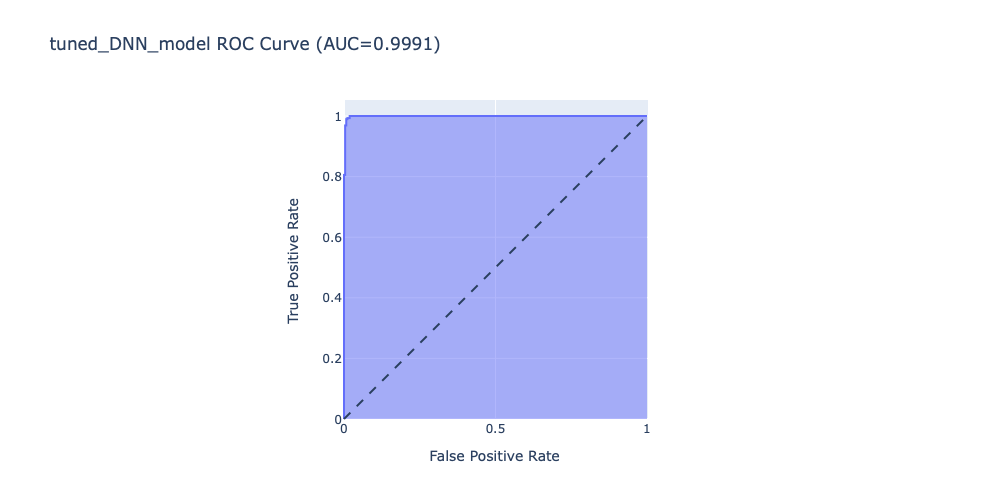

In [119]:
from Utilities.binary_roc_curve import ROC_curve
y_score = tuned_DNN_model.predict(X_test)[:, 0]
y_true = y_test
chart_name = 'tuned_DNN_model'
ROC_curve(y_true, y_score,chart_name)

## 7.2 Tune DNN Grid2

In [91]:

# define a LSTM model for tuning
def tuning_DNN_model(N_Hidden=1,#  number of hidden layers
                      N_Neurons=100,  # number of units
                      LR=0.01,       # learning rate
                      # DP=0.2,        # dropout rate
                      OPTIMIZER=Adam,# optimizer
                      ACTIVATION='selu',
                      LAMBDA=0.001, # LAMBDA                      
                      ):    
         
    # build model
    model= Sequential()
    
    for layer in range(N_Hidden):
      # selu needs to be with lecun_normal
      if (ACTIVATION=='selu'):
          INITIALIZER='lecun_normal'
      else:
           NITIALIZER='he_normal' 
            
      model.add(Embedding(20000, 300, input_length=150))
      model.add(layers.Flatten())
      model.add(Dense(N_Neurons, activation=ACTIVATION, 
                             kernel_initializer=INITIALIZER, 
                             kernel_regularizer=l2(LAMBDA),                           
                             )) 
                
      options = {}

    model.add(Dense(1, activation='sigmoid',**options))
    # optimizer
    optimizer = OPTIMIZER(learning_rate = LR)
    
    
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    
    return model

# save to KerasClassifier for tuning
clf_DNN = KerasClassifier(tuning_DNN_model, epochs = 10, verbose = 1)

In [ ]:
# define parameters dictionary
param_dict = {'N_Neurons': [32,64,128],
              'N_Hidden':[1,2,3],
              'LR': [5e-5,5e-4,5e-3], 
              'LAMBDA':[1e-4, 1e-3, 1e-2],
              'ACTIVATION':['relu','elu','selu'],
              'OPTIMIZER':[Nadam, Adam, RMSprop]
              }
# grid search
Grid_Search_2 = GridSearchCV(estimator=clf_DNN, param_grid=param_dict, n_jobs=24, cv=5)
# fit model
start = time()

Grid_Search_history_2 = Grid_Search.fit(X_train, y_train, epochs=5, validation_split=0.2,verbose=1, shuffle=False)

IPython.display.clear_output()     
print(f'Model Tuning was completed in {time() - start:.2f} secs')
print('-'*65)

2022-03-21 09:58:30.958170: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 09:58:30.958208: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 09:58:30.958198: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 09:58:30.958198: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 09:58:30.958209: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror:

Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5
Epoch 1/5


2022-03-21 09:59:09.205855: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 09:59:09.205892: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 09:59:09.219313: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 09:59:09.219351: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 09:59:09.219562: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or dire

 4/45 [=>............................] - ETA: 7s - loss: 0.7511 - accuracy: 0.5469 

2022-03-21 09:59:10.313032: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 09:59:10.313073: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 12s 256ms/step - loss: 0.7278 - accuracy: 0.6808 - val_loss: 0.6961 - val_accuracy: 0.8254
Epoch 2/5
45/45 [==============================] - 14s 299ms/step - loss: 0.7319 - accuracy: 0.6857 - val_loss: 0.7108 - val_accuracy: 0.7634
Epoch 2/5
45/45 [==============================] - 14s 285ms/step - loss: 0.7719 - accuracy: 0.7569 - val_loss: 0.7270 - val_accuracy: 0.8451
Epoch 2/5
45/45 [==============================] - 15s 309ms/step - loss: 0.7353 - accuracy: 0.6702 - val_loss: 0.7070 - val_accuracy: 0.7746
Epoch 2/5
45/45 [==============================] - 17s 364ms/step - loss: 0.7333 - accuracy: 0.6681 - val_loss: 0.7084 - val_accuracy: 0.7268
Epoch 2/5
45/45 [==============================] - 17s 375ms/step - loss: 0.7912 - accuracy: 0.6932 - val_loss: 0.7562 - val_accuracy: 0.7915
Epoch 2/5
20/45 [============>.................] - ETA: 4s - loss: 0.5862 - accuracy: 0.9844

2022-03-21 09:59:26.033048: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 09:59:26.033115: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 09:59:26.033660: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-03-21 09:59:26.101377: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 09:59:26.101467: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on thi

45/45 [==============================] - 17s 343ms/step - loss: 0.7364 - accuracy: 0.6474 - val_loss: 0.7110 - val_accuracy: 0.7296
Epoch 2/5
45/45 [==============================] - 17s 380ms/step - loss: 0.7389 - accuracy: 0.6834 - val_loss: 0.7106 - val_accuracy: 0.7549
Epoch 2/5
45/45 [==============================] - 17s 376ms/step - loss: 0.7357 - accuracy: 0.6653 - val_loss: 0.7152 - val_accuracy: 0.7380
Epoch 2/5
45/45 [==============================] - 18s 358ms/step - loss: 0.7367 - accuracy: 0.6702 - val_loss: 0.7099 - val_accuracy: 0.8000
Epoch 2/5
45/45 [==============================] - 18s 368ms/step - loss: 0.7354 - accuracy: 0.6589 - val_loss: 0.7093 - val_accuracy: 0.7183
Epoch 2/5


2022-03-21 09:59:26.427104: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 09:59:26.427156: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 09:59:26.427559: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-03-21 09:59:26.591440: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 09:59:26.591506: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on thi

45/45 [==============================] - 18s 387ms/step - loss: 0.7354 - accuracy: 0.6622 - val_loss: 0.7095 - val_accuracy: 0.7521
Epoch 2/5
45/45 [==============================] - 18s 356ms/step - loss: 0.7928 - accuracy: 0.6897 - val_loss: 0.7581 - val_accuracy: 0.7606
Epoch 2/5
 4/45 [=>............................] - ETA: 9s - loss: 0.5776 - accuracy: 0.9922 

2022-03-21 09:59:26.928389: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 09:59:26.928567: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 09:59:26.929486: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 19s 352ms/step - loss: 0.7938 - accuracy: 0.6970 - val_loss: 0.7549 - val_accuracy: 0.8028
Epoch 2/5
45/45 [==============================] - 20s 384ms/step - loss: 0.7898 - accuracy: 0.7012 - val_loss: 0.7501 - val_accuracy: 0.8197
Epoch 2/5
14/45 [========>.....................] - ETA: 9s - loss: 0.5905 - accuracy: 0.9866

2022-03-21 09:59:29.723255: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 09:59:29.723387: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 09:59:29.727871: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


23/45 [==============>...............] - ETA: 6s - loss: 0.6300 - accuracy: 0.9851

2022-03-21 09:59:32.762824: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 09:59:32.762927: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 09:59:32.763535: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 10s 230ms/step - loss: 0.5746 - accuracy: 0.9767 - val_loss: 0.6209 - val_accuracy: 0.8873
Epoch 3/5
45/45 [==============================] - 11s 238ms/step - loss: 0.5746 - accuracy: 0.9767 - val_loss: 0.6253 - val_accuracy: 0.8648
Epoch 3/5
45/45 [==============================] - 14s 304ms/step - loss: 0.5952 - accuracy: 0.9669 - val_loss: 0.6298 - val_accuracy: 0.8648
Epoch 3/5
45/45 [==============================] - 18s 400ms/step - loss: 0.5813 - accuracy: 0.9662 - val_loss: 0.6394 - val_accuracy: 0.8451
Epoch 3/5
45/45 [==============================] - 14s 317ms/step - loss: 0.5916 - accuracy: 0.9711 - val_loss: 0.6363 - val_accuracy: 0.8310
Epoch 3/5
45/45 [==============================] - 17s 390ms/step - loss: 0.5879 - accuracy: 0.9732 - val_loss: 0.6392 - val_accuracy: 0.8056
Epoch 3/5
45/45 [==============================] - 22s 483ms/step - loss: 0.5871 - accuracy: 0.9739 - val_loss: 0.6553 - val_accuracy: 0.8620
Epoch 3/5
45/45 

2022-03-21 10:03:01.157993: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:01.157993: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:01.158041: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 10:03:01.158045: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 10:03:01.158036: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or dire

45/45 [==============================] - 12s 263ms/step - loss: 0.3729 - accuracy: 0.9965 - val_loss: 0.5159 - val_accuracy: 0.9493
Epoch 5/5
 3/45 [=>............................] - ETA: 11s - loss: 0.3785 - accuracy: 0.9896

2022-03-21 10:03:01.713060: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:01.713597: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 9s 155ms/step - loss: 0.9003 - accuracy: 0.7130 - val_loss: 0.8454 - val_accuracy: 0.7775
Epoch 2/5
33/45 [=====================>........] - ETA: 2s - loss: 0.8935 - accuracy: 0.7367

2022-03-21 10:03:05.829539: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:05.830645: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 10s 205ms/step - loss: 0.8786 - accuracy: 0.7548 - val_loss: 0.8150 - val_accuracy: 0.7831
Epoch 2/5
45/45 [==============================] - 13s 296ms/step - loss: 0.4721 - accuracy: 0.9937 - val_loss: 0.5787 - val_accuracy: 0.9437
Epoch 4/5
45/45 [==============================] - 11s 203ms/step - loss: 0.8797 - accuracy: 0.7660 - val_loss: 0.8126 - val_accuracy: 0.8789
Epoch 2/5
45/45 [==============================] - 12s 256ms/step - loss: 0.6564 - accuracy: 0.9782 - val_loss: 0.7005 - val_accuracy: 0.8817
Epoch 3/5
45/45 [==============================] - 7s 161ms/step - loss: 0.6389 - accuracy: 0.9732 - val_loss: 0.7140 - val_accuracy: 0.8704
Epoch 3/5
17/45 [==========>...................] - ETA: 7s - loss: 0.7049 - accuracy: 0.9853

2022-03-21 10:03:10.453691: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:10.457388: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 13s 288ms/step - loss: 0.3585 - accuracy: 0.9965 - val_loss: 0.4980 - val_accuracy: 0.9380
Epoch 5/5
37/45 [=======================>......] - ETA: 1s - loss: 0.6301 - accuracy: 0.9797

2022-03-21 10:03:14.137133: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:14.137195: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 9s 196ms/step - loss: 0.6176 - accuracy: 0.9810 - val_loss: 0.6744 - val_accuracy: 0.8901
Epoch 3/5
45/45 [==============================] - 7s 165ms/step - loss: 0.4593 - accuracy: 0.9908 - val_loss: 0.5887 - val_accuracy: 0.9155
Epoch 4/5
45/45 [==============================] - 9s 193ms/step - loss: 0.6125 - accuracy: 0.9810 - val_loss: 0.6763 - val_accuracy: 0.9127
Epoch 3/5
18/45 [===========>..................] - ETA: 4s - loss: 0.4531 - accuracy: 0.9948

2022-03-21 10:03:18.556573: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:18.557319: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 11s 246ms/step - loss: 0.4696 - accuracy: 0.9930 - val_loss: 0.5782 - val_accuracy: 0.9239
Epoch 4/5
45/45 [==============================] - 14s 319ms/step - loss: 0.6681 - accuracy: 0.9803 - val_loss: 0.7071 - val_accuracy: 0.9268
Epoch 3/5
25/45 [===============>..............] - ETA: 2s - loss: 0.3598 - accuracy: 0.9987

2022-03-21 10:03:20.190202: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:03:20.190255: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:03:20.190712: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-03-21 10:03:20.196028: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:03:20.196107: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on thi

45/45 [==============================] - 13s 287ms/step - loss: 0.3601 - accuracy: 0.9958 - val_loss: 0.4929 - val_accuracy: 0.9521
Epoch 5/5
29/45 [==================>...........] - ETA: 2s - loss: 0.3609 - accuracy: 0.9968Epoch 1/5
Epoch 1/5
 6/45 [===>..........................] - ETA: 8s - loss: 0.3864 - accuracy: 0.9948Epoch 1/5
Epoch 1/5
23/45 [==============>...............] - ETA: 3s - loss: 0.4487 - accuracy: 0.9891

2022-03-21 10:03:21.170593: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:03:21.170807: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:03:21.172131: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


32/45 [====================>.........] - ETA: 2s - loss: 0.3610 - accuracy: 0.9961

28/45 [=================>............] - ETA: 2s - loss: 0.4452 - accuracy: 0.9900

41/45 [==========================>...] - ETA: 0s - loss: 0.4406 - accuracy: 0.9909

34/45 [=====================>........] - ETA: 1s - loss: 0.4386 - accuracy: 0.9908

2022-03-21 10:03:22.893830: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:22.893908: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


16/45 [=========>....................] - ETA: 6s - loss: 0.3768 - accuracy: 0.9961

45/45 [==============================] - 8s 176ms/step - loss: 0.4368 - accuracy: 0.9908 - val_loss: 0.5452 - val_accuracy: 0.9268
Epoch 4/5
39/45 [=========================>....] - ETA: 1s - loss: 0.3022 - accuracy: 0.996812

45/45 [==============================] - 8s 176ms/step - loss: 0.3524 - accuracy: 0.9965 - val_loss: 0.4995 - val_accuracy: 0.9465
Epoch 5/5
45/45 [==============================] - 9s 196ms/step - loss: 0.4297 - accuracy: 0.9908 - val_loss: 0.5555 - val_accuracy: 0.9296
Epoch 4/5
 6/45 [===>..........................] - ETA: 16s - loss: 0.9398 - accuracy: 0.5625

2022-03-21 10:03:26.158227: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:03:26.159121: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:03:26.159801: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


14/45 [========>.....................] - ETA: 7s - loss: 0.8220 - accuracy: 0.4554

19/45 [===========>..................] - ETA: 9s - loss: 0.9305 - accuracy: 0.6234

32/45 [====================>.........] - ETA: 3s - loss: 0.3000 - accuracy: 0.9961

2022-03-21 10:03:32.286974: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:32.287446: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


33/45 [=====================>........] - ETA: 3s - loss: 0.3263 - accuracy: 0.9943

2022-03-21 10:03:36.934901: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:03:36.935246: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:03:36.936227: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 17s 391ms/step - loss: 0.3598 - accuracy: 0.9965 - val_loss: 0.4956 - val_accuracy: 0.9352
Epoch 5/5
45/45 [==============================] - 19s 427ms/step - loss: 0.4778 - accuracy: 0.9937 - val_loss: 0.5826 - val_accuracy: 0.9465
Epoch 4/5
45/45 [==============================] - ETA: 0s - loss: 0.3182 - accuracy: 0.9951Epoch 2/5


45/45 [==============================] - 19s 366ms/step - loss: 0.8991 - accuracy: 0.7019 - val_loss: 0.8456 - val_accuracy: 0.8282
Epoch 2/5
45/45 [==============================] - 19s 372ms/step - loss: 0.9033 - accuracy: 0.7075 - val_loss: 0.8575 - val_accuracy: 0.7775
Epoch 2/5
45/45 [==============================] - 14s 315ms/step - loss: 0.3182 - accuracy: 0.9951 - val_loss: 0.4619 - val_accuracy: 0.9437
Epoch 5/5
20/45 [============>.................] - ETA: 5s - loss: 0.8183 - accuracy: 0.4703

2022-03-21 10:03:40.365464: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:40.366252: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 20s 377ms/step - loss: 0.8928 - accuracy: 0.7398 - val_loss: 0.8295 - val_accuracy: 0.8225
Epoch 2/5
45/45 [==============================] - 20s 367ms/step - loss: 0.9029 - accuracy: 0.6850 - val_loss: 0.8486 - val_accuracy: 0.8000
Epoch 2/5
12/45 [=======>......................] - ETA: 10s - loss: 0.3139 - accuracy: 0.9974

45/45 [==============================] - 23s 459ms/step - loss: 0.8825 - accuracy: 0.7611 - val_loss: 0.8219 - val_accuracy: 0.8507
Epoch 2/5
45/45 [==============================] - 24s 474ms/step - loss: 0.8885 - accuracy: 0.7348 - val_loss: 0.8324 - val_accuracy: 0.7831
Epoch 2/5
17/45 [==========>...................] - ETA: 7s - loss: 0.6544 - accuracy: 0.9798

45/45 [==============================] - 25s 501ms/step - loss: 0.8889 - accuracy: 0.7207 - val_loss: 0.8336 - val_accuracy: 0.7831
Epoch 2/5
24/45 [===============>..............] - ETA: 5s - loss: 0.6684 - accuracy: 0.9844

45/45 [==============================] - 10s 219ms/step - loss: 0.7770 - accuracy: 0.5004 - val_loss: 0.7696 - val_accuracy: 0.4676
Epoch 3/5
29/45 [==================>...........] - ETA: 4s - loss: 0.6664 - accuracy: 0.9838

2022-03-21 10:03:48.478775: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:48.479739: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


29/45 [==================>...........] - ETA: 4s - loss: 0.6440 - accuracy: 0.9860

2022-03-21 10:03:48.672627: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:03:48.728157: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:03:48.729321: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 10s 221ms/step - loss: 0.7762 - accuracy: 0.4838 - val_loss: 0.7659 - val_accuracy: 0.4676
Epoch 3/5
41/45 [==========================>...] - ETA: 1s - loss: 0.7782 - accuracy: 0.4764

45/45 [==============================] - 13s 298ms/step - loss: 0.6561 - accuracy: 0.9774 - val_loss: 0.7406 - val_accuracy: 0.8423
Epoch 3/5
45/45 [==============================] - ETA: 0s - loss: 0.6405 - accuracy: 0.9803

45/45 [==============================] - 13s 298ms/step - loss: 0.6283 - accuracy: 0.9852 - val_loss: 0.6874 - val_accuracy: 0.8901
Epoch 3/5
45/45 [==============================] - 14s 323ms/step - loss: 0.6477 - accuracy: 0.9859 - val_loss: 0.7227 - val_accuracy: 0.8704
Epoch 3/5
10/45 [=====>........................] - ETA: 9s - loss: 0.4853 - accuracy: 0.9937

45/45 [==============================] - 9s 207ms/step - loss: 0.7613 - accuracy: 0.5004 - val_loss: 0.7585 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 11s 249ms/step - loss: 0.7788 - accuracy: 0.4736 - val_loss: 0.7625 - val_accuracy: 0.5296
Epoch 3/5
36/45 [=======================>......] - ETA: 3s - loss: 0.6327 - accuracy: 0.9774

2022-03-21 10:03:58.449051: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:03:58.449252: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:03:58.458978: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


 7/45 [===>..........................] - ETA: 6s - loss: 0.7574 - accuracy: 0.4509

45/45 [==============================] - 21s 341ms/step - loss: 0.8031 - accuracy: 0.4958 - val_loss: 0.7902 - val_accuracy: 0.4676
Epoch 2/5
 5/45 [==>...........................] - ETA: 8s - loss: 0.7687 - accuracy: 0.4750

2022-03-21 10:03:59.111461: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:03:59.117947: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 10s 225ms/step - loss: 0.7605 - accuracy: 0.4986 - val_loss: 0.7554 - val_accuracy: 0.4676
Epoch 4/5
17/45 [==========>...................] - ETA: 5s - loss: 0.7661 - accuracy: 0.4816

45/45 [==============================] - 17s 283ms/step - loss: 0.8036 - accuracy: 0.4968 - val_loss: 0.7851 - val_accuracy: 0.4676
Epoch 2/5
36/45 [=======================>......] - ETA: 1s - loss: 0.7540 - accuracy: 0.4913

2022-03-21 10:04:03.707909: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:04:03.708477: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:04:03.709506: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


37/45 [=======================>......] - ETA: 1s - loss: 0.7539 - accuracy: 0.4916

45/45 [==============================] - 11s 243ms/step - loss: 0.7624 - accuracy: 0.4686 - val_loss: 0.7534 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 13s 282ms/step - loss: 0.4739 - accuracy: 0.9915 - val_loss: 0.6154 - val_accuracy: 0.9042
Epoch 4/5
45/45 [==============================] - 9s 201ms/step - loss: 0.7527 - accuracy: 0.5004 - val_loss: 0.7522 - val_accuracy: 0.4676
Epoch 5/5
36/45 [=======================>......] - ETA: 1s - loss: 0.7532 - accuracy: 0.4896

45/45 [==============================] - 13s 296ms/step - loss: 0.4480 - accuracy: 0.9944 - val_loss: 0.5618 - val_accuracy: 0.9408
Epoch 4/5
45/45 [==============================] - 13s 291ms/step - loss: 0.4575 - accuracy: 0.9915 - val_loss: 0.5822 - val_accuracy: 0.9239
Epoch 4/5
45/45 [==============================] - 10s 234ms/step - loss: 0.7637 - accuracy: 0.4736 - val_loss: 0.7520 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 13s 297ms/step - loss: 0.4666 - accuracy: 0.9930 - val_loss: 0.5993 - val_accuracy: 0.9211
Epoch 4/5
23/45 [==============>...............] - ETA: 2s - loss: 0.8184 - accuracy: 0.48371

2022-03-21 10:04:09.052263: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:04:09.052903: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 10s 222ms/step - loss: 0.7519 - accuracy: 0.4986 - val_loss: 0.7491 - val_accuracy: 0.4676
Epoch 5/5
Epoch 5/5
10/45 [=====>........................] - ETA: 10s - loss: 0.3678 - accuracy: 0.9969

45/45 [==============================] - 19s 315ms/step - loss: 0.8035 - accuracy: 0.4993 - val_loss: 0.7885 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 14s 210ms/step - loss: 0.8056 - accuracy: 0.4795 - val_loss: 0.7763 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 14s 182ms/step - loss: 0.8071 - accuracy: 0.4820 - val_loss: 0.7807 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 13s 296ms/step - loss: 0.7733 - accuracy: 0.4982 - val_loss: 0.7638 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 10s 228ms/step - loss: 0.7538 - accuracy: 0.4686 - val_loss: 0.7471 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 8s 163ms/step - loss: 0.7742 - accuracy: 0.4838 - val_loss: 0.7584 - val_accuracy: 0.4676
Epoch 3/5
35/45 [======================>.......] - ETA: 3s - loss: 0.8067 - accuracy: 0.4929

2022-03-21 10:04:17.659999: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:04:17.661852: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


31/45 [===================>..........] - ETA: 4s - loss: 0.7593 - accuracy: 0.5091

2022-03-21 10:04:19.206830: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:04:19.207543: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:04:19.208223: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 17s 379ms/step - loss: 0.4572 - accuracy: 0.9922 - val_loss: 0.5732 - val_accuracy: 0.9352
Epoch 4/5
45/45 [==============================] - 15s 325ms/step - loss: 0.3592 - accuracy: 0.9965 - val_loss: 0.5223 - val_accuracy: 0.9408
Epoch 5/5
45/45 [==============================] - 19s 422ms/step - loss: 0.4432 - accuracy: 0.9908 - val_loss: 0.5567 - val_accuracy: 0.9155
Epoch 4/5
 5/45 [==>...........................] - ETA: 12s - loss: 0.3586 - accuracy: 0.9937

45/45 [==============================] - 15s 331ms/step - loss: 0.3437 - accuracy: 0.9958 - val_loss: 0.4773 - val_accuracy: 0.9437
Epoch 5/5
45/45 [==============================] - 15s 332ms/step - loss: 0.3485 - accuracy: 0.9972 - val_loss: 0.4923 - val_accuracy: 0.9521
Epoch 5/5
45/45 [==============================] - 14s 318ms/step - loss: 0.3567 - accuracy: 0.9958 - val_loss: 0.5108 - val_accuracy: 0.9352
Epoch 5/5
45/45 [==============================] - 6s 133ms/step - loss: 0.7602 - accuracy: 0.4838 - val_loss: 0.7496 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 19s 427ms/step - loss: 0.4520 - accuracy: 0.9951 - val_loss: 0.5735 - val_accuracy: 0.9239
Epoch 4/5
 8/45 [====>.........................] - ETA: 8s - loss: 0.3055 - accuracy: 0.9961

12/45 [=======>......................] - ETA: 7s - loss: 0.2928 - accuracy: 0.9974

2022-03-21 10:04:25.184883: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:04:25.185261: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:04:25.185697: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 11s 231ms/step - loss: 0.7579 - accuracy: 0.5039 - val_loss: 0.7529 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 5s 104ms/step - loss: 0.7609 - accuracy: 0.4792 - val_loss: 0.7537 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 21s 369ms/step - loss: 0.8039 - accuracy: 0.5004 - val_loss: 0.7806 - val_accuracy: 0.5296
Epoch 2/5
10/45 [=====>........................] - ETA: 3s - loss: 0.7589 - accuracy: 0.4437

33/45 [=====================>........] - ETA: 2s - loss: 0.2988 - accuracy: 0.9981

2022-03-21 10:04:28.628400: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:04:28.629651: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 5s 118ms/step - loss: 0.7531 - accuracy: 0.4824 - val_loss: 0.7450 - val_accuracy: 0.4676
Epoch 5/5
22/45 [=============>................] - ETA: 5s - loss: 0.7506 - accuracy: 0.4986

45/45 [==============================] - 6s 127ms/step - loss: 0.7542 - accuracy: 0.4848 - val_loss: 0.7496 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 10s 220ms/step - loss: 0.7734 - accuracy: 0.5004 - val_loss: 0.7711 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 11s 241ms/step - loss: 0.7587 - accuracy: 0.5148 - val_loss: 0.7589 - val_accuracy: 0.4676
Epoch 4/5
 5/45 [==>...........................] - ETA: 5s - loss: 0.8535 - accuracy: 0.4750

45/45 [==============================] - 10s 212ms/step - loss: 0.7483 - accuracy: 0.5197 - val_loss: 0.7499 - val_accuracy: 0.4676
Epoch 5/5
14/14 [==============================] - 0s 19ms/step - loss: 0.7412 - accuracy: 0.4865


2022-03-21 10:04:34.552201: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:04:34.552715: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:04:34.553923: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 9s 209ms/step - loss: 0.7497 - accuracy: 0.5039 - val_loss: 0.7468 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 15s 322ms/step - loss: 0.3363 - accuracy: 0.9972 - val_loss: 0.4679 - val_accuracy: 0.9493
Epoch 5/5
45/45 [==============================] - 9s 191ms/step - loss: 0.7742 - accuracy: 0.4961 - val_loss: 0.7603 - val_accuracy: 0.5296
Epoch 3/5
20/45 [============>.................] - ETA: 3s - loss: 0.7522 - accuracy: 0.5063

2022-03-21 10:04:35.647943: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:04:35.648321: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 14s 318ms/step - loss: 0.3277 - accuracy: 0.9951 - val_loss: 0.4548 - val_accuracy: 0.9352
Epoch 5/5
32/45 [====================>.........] - ETA: 1s - loss: 0.8141 - accuracy: 0.4941

45/45 [==============================] - 15s 207ms/step - loss: 0.8044 - accuracy: 0.4831 - val_loss: 0.7770 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 12s 275ms/step - loss: 0.3323 - accuracy: 0.9972 - val_loss: 0.4681 - val_accuracy: 0.9465
Epoch 5/5
43/45 [===========================>..] - ETA: 0s - loss: 0.8103 - accuracy: 0.4971

45/45 [==============================] - 12s 137ms/step - loss: 0.8101 - accuracy: 0.4926 - val_loss: 0.7799 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 7s 147ms/step - loss: 0.7584 - accuracy: 0.4961 - val_loss: 0.7605 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 7s 152ms/step - loss: 0.7507 - accuracy: 0.5078 - val_loss: 0.7531 - val_accuracy: 0.4676
Epoch 5/5
34/45 [=====================>........] - ETA: 1s - loss: 0.7763 - accuracy: 0.4770

2022-03-21 10:04:40.505054: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:04:40.507290: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:04:40.516875: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


15/45 [=========>....................] - ETA: 4s - loss: 0.7455 - accuracy: 0.5125

45/45 [==============================] - 7s 154ms/step - loss: 0.7594 - accuracy: 0.4961 - val_loss: 0.7497 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 6s 142ms/step - loss: 0.7735 - accuracy: 0.4873 - val_loss: 0.7586 - val_accuracy: 0.4676
Epoch 3/5
 5/45 [==>...........................] - ETA: 6s - loss: 0.7576 - accuracy: 0.5125

45/45 [==============================] - 5s 116ms/step - loss: 0.7786 - accuracy: 0.4870 - val_loss: 0.7620 - val_accuracy: 0.4676
Epoch 3/5
12/45 [=======>......................] - ETA: 4s - loss: 0.7617 - accuracy: 0.5182

29/45 [==================>...........] - ETA: 2s - loss: 0.7475 - accuracy: 0.4914

2022-03-21 10:04:44.596648: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:04:44.597027: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 16s 205ms/step - loss: 0.9285 - accuracy: 0.4725 - val_loss: 0.8723 - val_accuracy: 0.5324
Epoch 2/5
32/45 [====================>.........] - ETA: 2s - loss: 0.7471 - accuracy: 0.4961

45/45 [==============================] - 11s 160ms/step - loss: 0.8074 - accuracy: 0.4848 - val_loss: 0.7762 - val_accuracy: 0.5296
Epoch 2/5
31/45 [===================>..........] - ETA: 1s - loss: 0.7645 - accuracy: 0.4859

2022-03-21 10:04:46.790460: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:04:46.792373: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:04:46.793118: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 8s 180ms/step - loss: 0.7502 - accuracy: 0.4961 - val_loss: 0.7545 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 5s 115ms/step - loss: 0.7594 - accuracy: 0.4873 - val_loss: 0.7505 - val_accuracy: 0.4676
Epoch 4/5
14/45 [========>.....................] - ETA: 4s - loss: 0.7522 - accuracy: 0.5045

 5/45 [==>...........................] - ETA: 6s - loss: 0.7523 - accuracy: 0.4750

17/45 [==========>...................] - ETA: 6s - loss: 0.9511 - accuracy: 0.4963

2022-03-21 10:04:51.825215: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:04:51.831178: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 6s 124ms/step - loss: 0.7750 - accuracy: 0.4806 - val_loss: 0.7571 - val_accuracy: 0.5296
Epoch 3/5
31/45 [===================>..........] - ETA: 1s - loss: 0.7574 - accuracy: 0.4859

43/45 [===========================>..] - ETA: 0s - loss: 0.7526 - accuracy: 0.4833

 2/45 [>.............................] - ETA: 5s - loss: 0.9547 - accuracy: 0.4844  

16/45 [=========>....................] - ETA: 3s - loss: 0.7623 - accuracy: 0.4668

45/45 [==============================] - 9s 210ms/step - loss: 0.8665 - accuracy: 0.4683 - val_loss: 0.8306 - val_accuracy: 0.5324
Epoch 3/5
 7/45 [===>..........................] - ETA: 8s - loss: 0.9698 - accuracy: 0.4955

10/45 [=====>........................] - ETA: 7s - loss: 0.9774 - accuracy: 0.5125

45/45 [==============================] - 8s 186ms/step - loss: 0.8659 - accuracy: 0.4870 - val_loss: 0.8351 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 15s 225ms/step - loss: 0.9282 - accuracy: 0.4989 - val_loss: 0.8760 - val_accuracy: 0.5296
Epoch 2/5
24/45 [===============>..............] - ETA: 4s - loss: 0.9464 - accuracy: 0.5117

2022-03-21 10:04:58.912121: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:04:58.913786: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:04:58.915566: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 8s 171ms/step - loss: 0.7607 - accuracy: 0.4806 - val_loss: 0.7471 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 19s 295ms/step - loss: 0.9262 - accuracy: 0.4788 - val_loss: 0.8707 - val_accuracy: 0.5324
Epoch 2/5
24/45 [===============>..............] - ETA: 5s - loss: 0.8327 - accuracy: 0.4857

2022-03-21 10:05:03.162330: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:05:03.162994: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


39/45 [=========================>....] - ETA: 1s - loss: 0.9260 - accuracy: 0.4928

45/45 [==============================] - 15s 254ms/step - loss: 0.9291 - accuracy: 0.4746 - val_loss: 0.8663 - val_accuracy: 0.5324
Epoch 2/5
26/45 [================>.............] - ETA: 7s - loss: 0.9371 - accuracy: 0.5000

45/45 [==============================] - 18s 319ms/step - loss: 0.9180 - accuracy: 0.4722 - val_loss: 0.8683 - val_accuracy: 0.5324
Epoch 2/5
44/45 [============================>.] - ETA: 0s - loss: 0.9380 - accuracy: 0.4957

45/45 [==============================] - 14s 303ms/step - loss: 0.8344 - accuracy: 0.4767 - val_loss: 0.8087 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 18s 324ms/step - loss: 0.9258 - accuracy: 0.5067 - val_loss: 0.8754 - val_accuracy: 0.4704
Epoch 2/5
45/45 [==============================] - 9s 189ms/step - loss: 0.7534 - accuracy: 0.4806 - val_loss: 0.7421 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 19s 338ms/step - loss: 0.9217 - accuracy: 0.4880 - val_loss: 0.8693 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 12s 265ms/step - loss: 0.8344 - accuracy: 0.4870 - val_loss: 0.8132 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 17s 270ms/step - loss: 0.9494 - accuracy: 0.4753 - val_loss: 0.8920 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 12s 258ms/step - loss: 0.8643 - accuracy: 0.4933 - val_loss: 0.8335 - val_accuracy: 0.5296
Epoch 3/5
31/45 [

 7/45 [===>..........................] - ETA: 9s - loss: 0.8203 - accuracy: 0.4420

45/45 [==============================] - 19s 262ms/step - loss: 0.9439 - accuracy: 0.4848 - val_loss: 0.8652 - val_accuracy: 0.5324
Epoch 2/5
13/45 [=======>......................] - ETA: 9s - loss: 0.8208 - accuracy: 0.4495

45/45 [==============================] - 20s 310ms/step - loss: 0.9381 - accuracy: 0.4954 - val_loss: 0.8581 - val_accuracy: 0.5324
Epoch 2/5
37/45 [=======================>......] - ETA: 1s - loss: 0.8663 - accuracy: 0.4747

38/45 [========================>.....] - ETA: 1s - loss: 0.8652 - accuracy: 0.4720

2022-03-21 10:05:12.608097: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:05:12.609184: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:05:12.619773: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 26s 398ms/step - loss: 0.9228 - accuracy: 0.4891 - val_loss: 0.8737 - val_accuracy: 0.4676
Epoch 2/5
28/45 [=================>............] - ETA: 4s - loss: 0.8609 - accuracy: 0.4900

2022-03-21 10:05:14.937540: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:05:14.938537: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 10s 214ms/step - loss: 0.8597 - accuracy: 0.4817 - val_loss: 0.8243 - val_accuracy: 0.5324
Epoch 3/5
11/45 [======>.......................] - ETA: 10s - loss: 0.8822 - accuracy: 0.4432

45/45 [==============================] - 11s 249ms/step - loss: 0.8730 - accuracy: 0.4711 - val_loss: 0.8427 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 13s 292ms/step - loss: 0.8590 - accuracy: 0.4940 - val_loss: 0.8337 - val_accuracy: 0.4704
Epoch 3/5
23/45 [==============>...............] - ETA: 5s - loss: 0.8387 - accuracy: 0.4878

45/45 [==============================] - 14s 319ms/step - loss: 0.8552 - accuracy: 0.4961 - val_loss: 0.8268 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 14s 308ms/step - loss: 0.8168 - accuracy: 0.4870 - val_loss: 0.8007 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 15s 336ms/step - loss: 0.8534 - accuracy: 0.4937 - val_loss: 0.8262 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 12s 275ms/step - loss: 0.8647 - accuracy: 0.4841 - val_loss: 0.8196 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 17s 374ms/step - loss: 0.8165 - accuracy: 0.4767 - val_loss: 0.7964 - val_accuracy: 0.5324
Epoch 5/5
39/45 [=========================>....] - ETA: 2s - loss: 0.9265 - accuracy: 0.4856

15/45 [=========>....................] - ETA: 9s - loss: 0.8242 - accuracy: 0.5292 

2022-03-21 10:05:28.298534: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:05:28.299125: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:05:28.299670: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 16s 349ms/step - loss: 0.8305 - accuracy: 0.4901 - val_loss: 0.8054 - val_accuracy: 0.5324
Epoch 4/5
12/45 [=======>......................] - ETA: 17s - loss: 0.9527 - accuracy: 0.5104

2022-03-21 10:05:29.177967: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:05:29.180993: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


29/45 [==================>...........] - ETA: 5s - loss: 0.8120 - accuracy: 0.48715

45/45 [==============================] - 17s 388ms/step - loss: 0.8607 - accuracy: 0.4806 - val_loss: 0.8312 - val_accuracy: 0.4676
Epoch 3/5
20/45 [============>.................] - ETA: 11s - loss: 0.9396 - accuracy: 0.5047

45/45 [==============================] - 12s 261ms/step - loss: 0.8376 - accuracy: 0.4792 - val_loss: 0.8021 - val_accuracy: 0.5324
Epoch 4/5
37/45 [=======================>......] - ETA: 2s - loss: 0.8066 - accuracy: 0.4890

45/45 [==============================] - 15s 327ms/step - loss: 0.8285 - accuracy: 0.5011 - val_loss: 0.8118 - val_accuracy: 0.4704
Epoch 4/5
43/45 [===========================>..] - ETA: 0s - loss: 0.8226 - accuracy: 0.49718

45/45 [==============================] - 15s 342ms/step - loss: 0.8141 - accuracy: 0.4933 - val_loss: 0.7975 - val_accuracy: 0.5296
Epoch 5/5
 8/45 [====>.........................] - ETA: 14s - loss: 0.8159 - accuracy: 0.5156

45/45 [==============================] - 15s 324ms/step - loss: 0.8352 - accuracy: 0.4841 - val_loss: 0.7999 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 13s 286ms/step - loss: 0.8129 - accuracy: 0.4817 - val_loss: 0.7890 - val_accuracy: 0.5324
Epoch 5/5
 6/45 [===>..........................] - ETA: 14s - loss: 0.8058 - accuracy: 0.5260

45/45 [==============================] - 20s 453ms/step - loss: 0.8254 - accuracy: 0.4947 - val_loss: 0.8054 - val_accuracy: 0.5324
Epoch 4/5
34/45 [=====================>........] - ETA: 3s - loss: 0.8259 - accuracy: 0.4697

2022-03-21 10:05:42.520539: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:05:42.521106: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:05:42.521677: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


17/45 [==========>...................] - ETA: 8s - loss: 0.8062 - accuracy: 0.5202

11/45 [======>.......................] - ETA: 4s - loss: 1.3301 - accuracy: 0.4830Epoch 1/5
Epoch 1/5
13/45 [=======>......................] - ETA: 3s - loss: 1.3085 - accuracy: 0.4832

26/45 [================>.............] - ETA: 20s - loss: 1.2361 - accuracy: 0.4663

 2/45 [>.............................] - ETA: 11s - loss: 2.4185 - accuracy: 0.5469

2022-03-21 10:05:47.908008: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:05:47.908043: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 10:05:48.023041: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:05:48.023364: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


38/45 [========================>.....] - ETA: 0s - loss: 1.1937 - accuracy: 0.4885

2022-03-21 10:05:50.088862: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:05:50.088918: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


10/45 [=====>........................] - ETA: 12s - loss: 1.7493 - accuracy: 0.4812

2022-03-21 10:05:50.652965: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:05:50.653171: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


36/45 [=======================>......] - ETA: 8s - loss: 1.2126 - accuracy: 0.4592  

2022-03-21 10:05:51.370095: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:05:51.370143: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:05:51.370730: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-03-21 10:05:51.376743: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:05:51.376796: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on thi

27/45 [=================>............] - ETA: 10s - loss: 0.8167 - accuracy: 0.4826

45/45 [==============================] - 39s 706ms/step - loss: 0.9137 - accuracy: 0.5053 - val_loss: 0.8709 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 22s 484ms/step - loss: 0.8218 - accuracy: 0.4792 - val_loss: 0.7911 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 21s 475ms/step - loss: 0.8281 - accuracy: 0.4697 - val_loss: 0.8067 - val_accuracy: 0.5324
Epoch 5/5
15/45 [=========>....................] - ETA: 40s - loss: 1.2717 - accuracy: 0.5000

41/45 [==========================>...] - ETA: 2s - loss: 0.8118 - accuracy: 0.50386

39/45 [=========================>....] - ETA: 5s - loss: 1.2031 - accuracy: 0.4671

39/45 [=========================>....] - ETA: 2s - loss: 0.8058 - accuracy: 0.4744

2022-03-21 10:05:58.205946: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:05:58.206000: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 27s 610ms/step - loss: 0.8282 - accuracy: 0.4806 - val_loss: 0.8090 - val_accuracy: 0.4676
Epoch 4/5
12/45 [=======>......................] - ETA: 12s - loss: 0.8687 - accuracy: 0.4896

45/45 [==============================] - 24s 536ms/step - loss: 0.8121 - accuracy: 0.5011 - val_loss: 0.8000 - val_accuracy: 0.4704
Epoch 5/5
21/45 [=============>................] - ETA: 9s - loss: 0.8015 - accuracy: 0.50157

22/45 [=============>................] - ETA: 8s - loss: 0.8059 - accuracy: 0.4943

2022-03-21 10:06:00.226243: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:06:00.226552: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:06:00.227250: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 22s 480ms/step - loss: 0.8194 - accuracy: 0.4856 - val_loss: 0.7899 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 28s 626ms/step - loss: 0.8533 - accuracy: 0.4887 - val_loss: 0.8251 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 24s 542ms/step - loss: 0.8057 - accuracy: 0.4937 - val_loss: 0.7917 - val_accuracy: 0.5324
Epoch 5/5
26/45 [================>.............] - ETA: 37s - loss: 1.2438 - accuracy: 0.4675

2022-03-21 10:06:03.811149: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:06:03.813238: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:06:03.822619: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


21/45 [=============>................] - ETA: 47s - loss: 1.2317 - accuracy: 0.4658

40/45 [=========================>....] - ETA: 1s - loss: 0.8028 - accuracy: 0.4859

2022-03-21 10:06:07.646585: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:06:07.647640: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 26s 593ms/step - loss: 0.8088 - accuracy: 0.4947 - val_loss: 0.7936 - val_accuracy: 0.5324
Epoch 5/5
25/45 [===============>..............] - ETA: 7s - loss: 0.8028 - accuracy: 0.4975

37/45 [=======================>......] - ETA: 2s - loss: 0.8120 - accuracy: 0.4856

45/45 [==============================] - 40s 635ms/step - loss: 0.9356 - accuracy: 0.4933 - val_loss: 0.8575 - val_accuracy: 0.5296
Epoch 2/5
33/45 [=====================>........] - ETA: 4s - loss: 0.8020 - accuracy: 0.5038

21/45 [=============>................] - ETA: 9s - loss: 0.7947 - accuracy: 0.5089 

2022-03-21 10:06:12.046485: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:06:12.048318: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:06:12.049208: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 19s 417ms/step - loss: 0.8533 - accuracy: 0.5025 - val_loss: 0.8290 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 66s 1s/step - loss: 1.1872 - accuracy: 0.4753 - val_loss: 1.1024 - val_accuracy: 0.5324
Epoch 2/5
15/45 [=========>....................] - ETA: 7s - loss: 0.8776 - accuracy: 0.45000

45/45 [==============================] - 17s 379ms/step - loss: 0.8100 - accuracy: 0.4848 - val_loss: 0.7966 - val_accuracy: 0.4676
Epoch 5/5
25/45 [===============>..............] - ETA: 4s - loss: 0.8710 - accuracy: 0.47500

 8/14 [================>.............] - ETA: 0s - loss: 0.7838 - accuracy: 0.5234

2022-03-21 10:06:17.859008: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:06:17.860465: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:06:17.861757: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 17s 384ms/step - loss: 0.8225 - accuracy: 0.4845 - val_loss: 0.8027 - val_accuracy: 0.5324
Epoch 4/5
 1/14 [=>............................] - ETA: 1s - loss: 0.7903 - accuracy: 0.4688

2022-03-21 10:06:20.393512: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:06:20.393574: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


43/45 [===========================>..] - ETA: 0s - loss: 0.8657 - accuracy: 0.4717

40/45 [=========================>....] - ETA: 3s - loss: 1.0330 - accuracy: 0.48050

45/45 [==============================] - 12s 260ms/step - loss: 0.8638 - accuracy: 0.4764 - val_loss: 0.8192 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 57s 1s/step - loss: 1.1939 - accuracy: 0.4979 - val_loss: 1.0484 - val_accuracy: 0.5324
Epoch 2/5
 8/45 [====>.........................] - ETA: 7s - loss: 0.8555 - accuracy: 0.4297

21/45 [=============>................] - ETA: 7s - loss: 0.8054 - accuracy: 0.4896

32/45 [====================>.........] - ETA: 3s - loss: 0.7995 - accuracy: 0.4863

2022-03-21 10:06:25.652564: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:06:25.653235: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:06:25.654467: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 35s 778ms/step - loss: 1.0308 - accuracy: 0.4820 - val_loss: 0.9680 - val_accuracy: 0.4676
Epoch 3/5
10/45 [=====>........................] - ETA: 9s - loss: 0.8893 - accuracy: 0.4375

45/45 [==============================] - 16s 339ms/step - loss: 0.8228 - accuracy: 0.5025 - val_loss: 0.8049 - val_accuracy: 0.4676
Epoch 4/5
 7/45 [===>..........................] - ETA: 40s - loss: 1.3764 - accuracy: 0.4955

2022-03-21 10:06:29.439264: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:06:29.439307: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 54s 879ms/step - loss: 1.1585 - accuracy: 0.4975 - val_loss: 1.0726 - val_accuracy: 0.4676
Epoch 2/5
37/45 [=======================>......] - ETA: 2s - loss: 0.8393 - accuracy: 0.4721

45/45 [==============================] - 14s 317ms/step - loss: 0.8053 - accuracy: 0.4803 - val_loss: 0.7902 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 12s 261ms/step - loss: 0.8346 - accuracy: 0.4820 - val_loss: 0.7997 - val_accuracy: 0.5296
Epoch 4/5
35/45 [======================>.......] - ETA: 3s - loss: 0.8663 - accuracy: 0.4893

2022-03-21 10:06:36.286551: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:06:36.287322: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:06:36.287934: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


18/45 [===========>..................] - ETA: 19s - loss: 1.0514 - accuracy: 0.4670

45/45 [==============================] - 51s 1s/step - loss: 1.3084 - accuracy: 0.4880 - val_loss: 1.2318 - val_accuracy: 0.5324
Epoch 2/5
14/45 [========>.....................] - ETA: 7s - loss: 0.8252 - accuracy: 0.4509

45/45 [==============================] - 94s 2s/step - loss: 1.1929 - accuracy: 0.4760 - val_loss: 1.1120 - val_accuracy: 0.5324
Epoch 2/5
21/45 [=============>................] - ETA: 17s - loss: 1.0399 - accuracy: 0.4851

13/45 [=======>......................] - ETA: 1:03 - loss: 1.2723 - accuracy: 0.4784

2022-03-21 10:06:41.227979: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:06:41.228959: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 25s 350ms/step - loss: 0.8613 - accuracy: 0.4947 - val_loss: 0.8316 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 22s 307ms/step - loss: 0.8613 - accuracy: 0.4834 - val_loss: 0.8229 - val_accuracy: 0.5296
Epoch 2/5
27/45 [=================>............] - ETA: 13s - loss: 1.0363 - accuracy: 0.4630

45/45 [==============================] - 15s 342ms/step - loss: 0.8055 - accuracy: 0.5011 - val_loss: 0.7912 - val_accuracy: 0.5324
Epoch 5/5
18/45 [===========>..................] - ETA: 54s - loss: 1.2154 - accuracy: 0.5069

2022-03-21 10:06:45.189516: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:06:45.190314: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:06:45.190857: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


32/45 [====================>.........] - ETA: 4s - loss: 0.8632 - accuracy: 0.4941

45/45 [==============================] - 100s 2s/step - loss: 1.1820 - accuracy: 0.4863 - val_loss: 1.0794 - val_accuracy: 0.5324
Epoch 2/5
38/45 [========================>.....] - ETA: 5s - loss: 1.0231 - accuracy: 0.4852

31/45 [===================>..........] - ETA: 13s - loss: 1.2090 - accuracy: 0.4919

2022-03-21 10:06:52.477217: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:06:52.498740: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 12s 264ms/step - loss: 0.8107 - accuracy: 0.4806 - val_loss: 0.7866 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 13s 293ms/step - loss: 0.8109 - accuracy: 0.4961 - val_loss: 0.7957 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 21s 393ms/step - loss: 0.8541 - accuracy: 0.5063 - val_loss: 0.8259 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 30s 480ms/step - loss: 0.8617 - accuracy: 0.4866 - val_loss: 0.8278 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 14s 312ms/step - loss: 0.8093 - accuracy: 0.4873 - val_loss: 0.7905 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 36s 807ms/step - loss: 1.0176 - accuracy: 0.4817 - val_loss: 0.9791 - val_accuracy: 0.4676
Epoch 3/5
44/45 [============================>.] - ETA: 0s - loss: 0.7949 - accuracy: 0.4936

2022-03-21 10:07:00.461977: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:07:00.462768: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:07:00.464049: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 35s 779ms/step - loss: 0.9689 - accuracy: 0.4919 - val_loss: 0.9253 - val_accuracy: 0.4676
Epoch 4/5
44/45 [============================>.] - ETA: 0s - loss: 1.0085 - accuracy: 0.5121

45/45 [==============================] - 40s 891ms/step - loss: 1.0170 - accuracy: 0.4965 - val_loss: 0.9885 - val_accuracy: 0.4676
Epoch 3/5
22/45 [=============>................] - ETA: 11s - loss: 0.8752 - accuracy: 0.5114

2022-03-21 10:07:04.708148: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:07:04.708771: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 11s 238ms/step - loss: 0.7827 - accuracy: 0.4708 - val_loss: 0.7661 - val_accuracy: 0.5296
Epoch 4/5
26/45 [================>.............] - ETA: 6s - loss: 0.8115 - accuracy: 0.4976

45/45 [==============================] - 38s 837ms/step - loss: 1.0082 - accuracy: 0.5116 - val_loss: 0.9809 - val_accuracy: 0.4676
Epoch 3/5
31/45 [===================>..........] - ETA: 4s - loss: 0.8095 - accuracy: 0.4980

45/45 [==============================] - 54s 1s/step - loss: 1.1749 - accuracy: 0.4940 - val_loss: 1.0513 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 31s 462ms/step - loss: 0.8631 - accuracy: 0.4827 - val_loss: 0.8265 - val_accuracy: 0.4676
Epoch 2/5
 7/45 [===>..........................] - ETA: 31s - loss: 0.9855 - accuracy: 0.4688

2022-03-21 10:07:09.981814: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:07:09.982532: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:07:09.983425: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 14s 310ms/step - loss: 0.8119 - accuracy: 0.4824 - val_loss: 0.7919 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 13s 281ms/step - loss: 0.7814 - accuracy: 0.4944 - val_loss: 0.7701 - val_accuracy: 0.4676
Epoch 4/5
15/45 [=========>....................] - ETA: 10s - loss: 0.7722 - accuracy: 0.4583

45/45 [==============================] - 17s 367ms/step - loss: 0.8038 - accuracy: 0.5120 - val_loss: 0.7924 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 81s 2s/step - loss: 1.2772 - accuracy: 0.4863 - val_loss: 1.1828 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 81s 2s/step - loss: 1.2852 - accuracy: 0.5011 - val_loss: 1.0849 - val_accuracy: 0.5324
Epoch 2/5
29/45 [==================>...........] - ETA: 21s - loss: 1.1443 - accuracy: 0.4601

2022-03-21 10:07:14.481029: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:07:14.482117: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


 3/45 [=>............................] - ETA: 13s - loss: 0.7873 - accuracy: 0.4896

45/45 [==============================] - 26s 466ms/step - loss: 0.8559 - accuracy: 0.5071 - val_loss: 0.8297 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 11s 242ms/step - loss: 0.7667 - accuracy: 0.4736 - val_loss: 0.7541 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 16s 241ms/step - loss: 0.8498 - accuracy: 0.4845 - val_loss: 0.8105 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 15s 338ms/step - loss: 0.7677 - accuracy: 0.4975 - val_loss: 0.7640 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 15s 338ms/step - loss: 0.8118 - accuracy: 0.4757 - val_loss: 0.7904 - val_accuracy: 0.4676
Epoch 3/5
31/45 [===================>..........] - ETA: 4s - loss: 0.8094 - accuracy: 0.5050

2022-03-21 10:07:25.119777: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:07:25.232768: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:07:25.234522: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 15s 327ms/step - loss: 0.7846 - accuracy: 0.4824 - val_loss: 0.7721 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 16s 349ms/step - loss: 0.7654 - accuracy: 0.4944 - val_loss: 0.7583 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 81s 2s/step - loss: 1.3436 - accuracy: 0.4919 - val_loss: 1.0270 - val_accuracy: 0.5296
Epoch 2/5
28/45 [=================>............] - ETA: 4s - loss: 0.7596 - accuracy: 0.47778

2022-03-21 10:07:29.895666: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:07:29.896147: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 15s 339ms/step - loss: 0.8028 - accuracy: 0.5169 - val_loss: 0.7895 - val_accuracy: 0.4676
Epoch 3/5
42/45 [===========================>..] - ETA: 5s - loss: 1.1840 - accuracy: 0.4874

 8/45 [====>.........................] - ETA: 5s - loss: 0.7736 - accuracy: 0.5234

2022-03-21 10:07:33.056807: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:07:33.057454: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:07:33.058034: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


20/45 [============>.................] - ETA: 8s - loss: 0.7646 - accuracy: 0.5063

45/45 [==============================] - 37s 832ms/step - loss: 0.9576 - accuracy: 0.4817 - val_loss: 0.9374 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 84s 2s/step - loss: 1.0585 - accuracy: 0.4810 - val_loss: 1.0060 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 35s 788ms/step - loss: 0.9349 - accuracy: 0.4919 - val_loss: 0.8986 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 15s 319ms/step - loss: 0.7840 - accuracy: 0.4757 - val_loss: 0.7701 - val_accuracy: 0.4676
Epoch 4/5
31/45 [===================>..........] - ETA: 4s - loss: 0.7785 - accuracy: 0.5091

11/45 [======>.......................] - ETA: 18s - loss: 0.8786 - accuracy: 0.5114

2022-03-21 10:07:40.169348: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:07:40.170157: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 9s 192ms/step - loss: 0.7712 - accuracy: 0.4873 - val_loss: 0.7579 - val_accuracy: 0.4676
Epoch 4/5
39/45 [=========================>....] - ETA: 1s - loss: 0.7619 - accuracy: 0.50568

45/45 [==============================] - 65s 1s/step - loss: 1.0972 - accuracy: 0.4760 - val_loss: 1.1876 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 107s 2s/step - loss: 1.1811 - accuracy: 0.4912 - val_loss: 1.0616 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 16s 355ms/step - loss: 0.7691 - accuracy: 0.4824 - val_loss: 0.7608 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 13s 298ms/step - loss: 0.7614 - accuracy: 0.5078 - val_loss: 0.7613 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 14s 308ms/step - loss: 0.7744 - accuracy: 0.5197 - val_loss: 0.7692 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 39s 847ms/step - loss: 0.9435 - accuracy: 0.5032 - val_loss: 0.9419 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 42s 947ms/step - loss: 0.9613 - accuracy: 0.4894 - val_loss: 0.9562 - val_accuracy: 0.4676
Epoch 4/5
31/45 [====

2022-03-21 10:07:46.675094: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:07:46.676955: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:07:46.678005: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 104s 2s/step - loss: 1.1918 - accuracy: 0.4848 - val_loss: 1.0546 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 17s 381ms/step - loss: 0.8035 - accuracy: 0.4975 - val_loss: 0.7934 - val_accuracy: 0.4676
Epoch 3/5
22/45 [=============>................] - ETA: 7s - loss: 0.7636 - accuracy: 0.4702

45/45 [==============================] - 42s 935ms/step - loss: 1.0315 - accuracy: 0.4813 - val_loss: 0.9637 - val_accuracy: 0.5296
Epoch 3/5
35/45 [======================>.......] - ETA: 4s - loss: 0.8611 - accuracy: 0.5063

2022-03-21 10:07:51.062184: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:07:51.062808: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


14/14 [==============================] - 1s 31ms/step - loss: 0.7556 - accuracy: 0.4831


 4/45 [=>............................] - ETA: 8s - loss: 0.7574 - accuracy: 0.4766

31/45 [===================>..........] - ETA: 4s - loss: 0.7621 - accuracy: 0.4677

10/45 [=====>........................] - ETA: 8s - loss: 0.7614 - accuracy: 0.4437

13/45 [=======>......................] - ETA: 13s - loss: 0.7836 - accuracy: 0.4976

37/45 [=======================>......] - ETA: 3s - loss: 0.8096 - accuracy: 0.5042

19/45 [===========>..................] - ETA: 10s - loss: 0.7828 - accuracy: 0.4967Epoch 2/5


45/45 [==============================] - 29s 517ms/step - loss: 0.8537 - accuracy: 0.5130 - val_loss: 0.8184 - val_accuracy: 0.5296
Epoch 2/5
 9/45 [=====>........................] - ETA: 2s - loss: 1.0872 - accuracy: 0.4618

2022-03-21 10:07:58.422951: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:07:58.423061: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:07:58.423543: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


18/45 [===========>..................] - ETA: 2s - loss: 1.0627 - accuracy: 0.4792

26/45 [================>.............] - ETA: 1s - loss: 1.0476 - accuracy: 0.4952

21/45 [=============>................] - ETA: 1s - loss: 0.8708 - accuracy: 0.4717

2022-03-21 10:08:01.905178: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:08:01.905204: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 10s 94ms/step - loss: 1.0222 - accuracy: 0.4926 - val_loss: 0.9407 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 12s 96ms/step - loss: 1.0226 - accuracy: 0.4863 - val_loss: 0.9385 - val_accuracy: 0.4676
Epoch 2/5
13/45 [=======>......................] - ETA: 3s - loss: 0.9363 - accuracy: 0.4543

 4/45 [=>............................] - ETA: 8s - loss: 0.7867 - accuracy: 0.5078

2022-03-21 10:08:04.825927: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:08:04.825991: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 7s 110ms/step - loss: 0.8519 - accuracy: 0.4856 - val_loss: 0.8108 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 33s 589ms/step - loss: 0.8532 - accuracy: 0.4795 - val_loss: 0.8116 - val_accuracy: 0.4676
Epoch 2/5
32/45 [====================>.........] - ETA: 14s - loss: 0.9284 - accuracy: 0.4697

45/45 [==============================] - 93s 2s/step - loss: 1.0612 - accuracy: 0.4831 - val_loss: 1.0213 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 17s 381ms/step - loss: 0.8027 - accuracy: 0.4933 - val_loss: 0.7770 - val_accuracy: 0.5296
Epoch 3/5
40/45 [=========================>....] - ETA: 10s - loss: 1.0602 - accuracy: 0.4914

45/45 [==============================] - 27s 588ms/step - loss: 0.7760 - accuracy: 0.4961 - val_loss: 0.7737 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 14s 320ms/step - loss: 0.9100 - accuracy: 0.4870 - val_loss: 0.8640 - val_accuracy: 0.4676
Epoch 3/5
27/45 [=================>............] - ETA: 3s - loss: 0.7783 - accuracy: 0.48736

45/45 [==============================] - 12s 267ms/step - loss: 0.8015 - accuracy: 0.4753 - val_loss: 0.7784 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 15s 348ms/step - loss: 0.7990 - accuracy: 0.4841 - val_loss: 0.7763 - val_accuracy: 0.4676
Epoch 3/5
44/45 [============================>.] - ETA: 0s - loss: 0.7768 - accuracy: 0.4929

45/45 [==============================] - 10s 221ms/step - loss: 0.7766 - accuracy: 0.4933 - val_loss: 0.7583 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 19s 438ms/step - loss: 0.7801 - accuracy: 0.4940 - val_loss: 0.7700 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 29s 490ms/step - loss: 0.8032 - accuracy: 0.5032 - val_loss: 0.7817 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 50s 1s/step - loss: 0.9239 - accuracy: 0.4788 - val_loss: 0.9080 - val_accuracy: 0.4676
Epoch 5/5
34/45 [=====================>........] - ETA: 13s - loss: 0.9319 - accuracy: 0.4853

2022-03-21 10:08:27.302022: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:08:27.442364: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:08:27.443785: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


20/45 [============>.................] - ETA: 12s - loss: 1.0587 - accuracy: 0.4922

2022-03-21 10:08:28.246203: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:08:28.247191: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:08:28.248113: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 100s 2s/step - loss: 1.0525 - accuracy: 0.4975 - val_loss: 0.9924 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 15s 346ms/step - loss: 0.8021 - accuracy: 0.4792 - val_loss: 0.7816 - val_accuracy: 0.4676
Epoch 3/5
16/45 [=========>....................] - ETA: 1:22 - loss: 1.0824 - accuracy: 0.4863

2022-03-21 10:08:31.863192: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:08:31.936227: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:08:31.937088: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 79s 2s/step - loss: 1.0655 - accuracy: 0.4863 - val_loss: 1.0834 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 13s 282ms/step - loss: 0.7749 - accuracy: 0.4838 - val_loss: 0.7598 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 47s 1s/step - loss: 0.9076 - accuracy: 0.5102 - val_loss: 0.9153 - val_accuracy: 0.4676
Epoch 5/5
27/45 [=================>............] - ETA: 6s - loss: 0.7663 - accuracy: 0.4757

45/45 [==============================] - 45s 645ms/step - loss: 1.0215 - accuracy: 0.4774 - val_loss: 0.9378 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 6s 144ms/step - loss: 0.7605 - accuracy: 0.4824 - val_loss: 0.7499 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 17s 383ms/step - loss: 0.7650 - accuracy: 0.4940 - val_loss: 0.7590 - val_accuracy: 0.4676
Epoch 5/5
23/45 [==============>...............] - ETA: 0s - loss: 0.7566 - accuracy: 0.4864

34/45 [=====================>........] - ETA: 0s - loss: 0.7565 - accuracy: 0.4890

34/45 [=====================>........] - ETA: 9s - loss: 0.7620 - accuracy: 0.4844

45/45 [==============================] - 21s 464ms/step - loss: 0.7626 - accuracy: 0.4933 - val_loss: 0.7486 - val_accuracy: 0.5296
Epoch 5/5
 4/45 [=>............................] - ETA: 2s - loss: 0.7536 - accuracy: 0.4766

36/45 [=======================>......] - ETA: 19s - loss: 1.1430 - accuracy: 0.4826

45/45 [==============================] - 58s 1s/step - loss: 0.9300 - accuracy: 0.4894 - val_loss: 0.9286 - val_accuracy: 0.4676
Epoch 5/5
20/45 [============>.................] - ETA: 1s - loss: 1.0764 - accuracy: 0.4844

28/45 [=================>............] - ETA: 0s - loss: 1.0523 - accuracy: 0.4688

45/45 [==============================] - 32s 515ms/step - loss: 1.0138 - accuracy: 0.4947 - val_loss: 0.9334 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 31s 706ms/step - loss: 0.7724 - accuracy: 0.4757 - val_loss: 0.7572 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 39s 878ms/step - loss: 0.7603 - accuracy: 0.4961 - val_loss: 0.7620 - val_accuracy: 0.4676
Epoch 5/5
 1/45 [..............................] - ETA: 1s - loss: 0.7565 - accuracy: 0.5000

45/45 [==============================] - 52s 1s/step - loss: 0.8540 - accuracy: 0.4792 - val_loss: 0.8246 - val_accuracy: 0.4676
Epoch 4/5
32/45 [====================>.........] - ETA: 19s - loss: 0.7782 - accuracy: 0.5059

26/45 [================>.............] - ETA: 15s - loss: 0.7533 - accuracy: 0.4808

14/14 [==============================] - 1s 21ms/step - loss: 0.7480 - accuracy: 0.4842


45/45 [==============================] - 47s 1s/step - loss: 0.7758 - accuracy: 0.4792 - val_loss: 0.7640 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 71s 1s/step - loss: 1.0141 - accuracy: 0.4996 - val_loss: 0.9314 - val_accuracy: 0.5324
Epoch 2/5
14/45 [========>.....................] - ETA: 8s - loss: 1.0620 - accuracy: 0.4866Epoch 5/5
Epoch 4/5
45/45 [==============================] - 10s 227ms/step - loss: 0.8241 - accuracy: 0.4806 - val_loss: 0.8044 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 67s 2s/step - loss: 0.8531 - accuracy: 0.4870 - val_loss: 0.8249 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 40s 862ms/step - loss: 1.0151 - accuracy: 0.4739 - val_loss: 0.9238 - val_accuracy: 0.5324
Epoch 2/5
 4/45 [=>............................] - ETA: 3:13 - loss: 1.0892 - accuracy: 0.5234Epoch 1/5


45/45 [==============================] - 69s 1s/step - loss: 0.9100 - accuracy: 0.4901 - val_loss: 0.8617 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 113s 3s/step - loss: 0.9672 - accuracy: 0.4841 - val_loss: 0.9193 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 75s 2s/step - loss: 0.8983 - accuracy: 0.4887 - val_loss: 0.8547 - val_accuracy: 0.5324
Epoch 3/5


45/45 [==============================] - 36s 730ms/step - loss: 1.0077 - accuracy: 0.4996 - val_loss: 0.9303 - val_accuracy: 0.4704
Epoch 2/5
45/45 [==============================] - 14s 324ms/step - loss: 0.9326 - accuracy: 0.4813 - val_loss: 0.8931 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 31s 43ms/step - loss: 1.0207 - accuracy: 0.4856 - val_loss: 0.9085 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 80s 2s/step - loss: 1.0119 - accuracy: 0.4845 - val_loss: 0.9231 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 3s 56ms/step - loss: 0.8945 - accuracy: 0.4746 - val_loss: 0.8480 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 3s 60ms/step - loss: 0.8980 - accuracy: 0.4841 - val_loss: 0.8386 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 3s 58ms/step - loss: 0.8413 - accuracy: 0.4746 - val_loss: 0.8071 - val_accuracy: 0.5324
Epoch 4/5
45/45 [=========

Epoch 1/5


15/45 [=========>....................] - ETA: 0s - loss: 1.0973 - accuracy: 0.4542

45/45 [==============================] - 54s 1s/step - loss: 0.8975 - accuracy: 0.4626 - val_loss: 0.8471 - val_accuracy: 0.5324
Epoch 3/5
34/45 [=====================>........] - ETA: 19s - loss: 0.9035 - accuracy: 0.4936

45/45 [==============================] - 33s 742ms/step - loss: 0.8932 - accuracy: 0.4785 - val_loss: 0.8527 - val_accuracy: 0.4704
Epoch 3/5
45/45 [==============================] - 1s 32ms/step - loss: 0.8350 - accuracy: 0.4785 - val_loss: 0.8128 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 189s 4s/step - loss: 1.1233 - accuracy: 0.4877 - val_loss: 0.9537 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 111s 2s/step - loss: 0.9020 - accuracy: 0.4975 - val_loss: 0.8586 - val_accuracy: 0.5324
Epoch 3/5
 1/45 [..............................] - ETA: 1s - loss: 0.8645 - accuracy: 0.5000

45/45 [==============================] - 3s 77ms/step - loss: 0.8479 - accuracy: 0.4947 - val_loss: 0.8213 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 1s 33ms/step - loss: 0.8201 - accuracy: 0.4947 - val_loss: 0.8019 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 102s 2s/step - loss: 0.8967 - accuracy: 0.4940 - val_loss: 0.8551 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 2s 34ms/step - loss: 0.8410 - accuracy: 0.4926 - val_loss: 0.8162 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 53s 1s/step - loss: 1.0139 - accuracy: 0.4933 - val_loss: 0.9086 - val_accuracy: 0.5296
Epoch 2/5
35/45 [======================>.......] - ETA: 24s - loss: 0.8574 - accuracy: 0.4902Epoch 1/5


 1/45 [..............................] - ETA: 3:11 - loss: 1.4615 - accuracy: 0.5000

2022-03-21 10:11:25.169085: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:11:25.248183: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 46s 1s/step - loss: 0.8121 - accuracy: 0.4926 - val_loss: 0.7954 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 260s 6s/step - loss: 0.9903 - accuracy: 0.4711 - val_loss: 0.9608 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 164s 4s/step - loss: 0.7594 - accuracy: 0.5046 - val_loss: 0.7496 - val_accuracy: 0.5296
Epoch 5/5
41/45 [==========================>...] - ETA: 14s - loss: 1.0281 - accuracy: 0.4726

45/45 [==============================] - 146s 3s/step - loss: 0.8537 - accuracy: 0.4901 - val_loss: 0.8231 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 224s 3s/step - loss: 1.0221 - accuracy: 0.4767 - val_loss: 0.9370 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 116s 3s/step - loss: 0.8451 - accuracy: 0.4640 - val_loss: 0.8095 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 173s 3s/step - loss: 0.8231 - accuracy: 0.4870 - val_loss: 0.8041 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 71s 2s/step - loss: 0.8943 - accuracy: 0.4834 - val_loss: 0.8382 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 113s 3s/step - loss: 0.8054 - accuracy: 0.4799 - val_loss: 0.7916 - val_accuracy: 0.4704
Epoch 5/5
45/45 [==============================] - 149s 2s/step - loss: 1.0142 - accuracy: 0.4834 - val_loss: 0.9124 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============

40/45 [=========================>....] - ETA: 2s - loss: 0.7507 - accuracy: 0.5023

28/45 [=================>............] - ETA: 8s - loss: 0.8165 - accuracy: 0.4810

45/45 [==============================] - 286s 6s/step - loss: 1.0499 - accuracy: 0.4870 - val_loss: 0.9744 - val_accuracy: 0.5324
Epoch 3/5
23/45 [==============>...............] - ETA: 14s - loss: 0.9308 - accuracy: 0.4701

45/45 [==============================] - 237s 4s/step - loss: 1.0263 - accuracy: 0.4947 - val_loss: 0.9420 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 17s 370ms/step - loss: 0.8198 - accuracy: 0.4640 - val_loss: 0.7915 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 23s 513ms/step - loss: 0.8146 - accuracy: 0.4803 - val_loss: 0.7962 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 20s 458ms/step - loss: 0.8421 - accuracy: 0.4933 - val_loss: 0.8041 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 19s 434ms/step - loss: 0.8943 - accuracy: 0.4792 - val_loss: 0.8370 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 30s 669ms/step - loss: 0.8241 - accuracy: 0.4901 - val_loss: 0.8028 - val_accuracy: 0.5324
Epoch 5/5
 9/45 [=====>........................] - ETA: 24s - loss: 0.7997 - accuracy: 0.4653

22/45 [=============>................] - ETA: 49s - loss: 0.9703 - accuracy: 0.4503

15/45 [=========>....................] - ETA: 53s - loss: 0.9892 - accuracy: 0.4958

45/45 [==============================] - 29s 656ms/step - loss: 0.9095 - accuracy: 0.4767 - val_loss: 0.8600 - val_accuracy: 0.5324
Epoch 3/5
38/45 [========================>.....] - ETA: 2s - loss: 0.8109 - accuracy: 0.4515

2022-03-21 10:12:45.156842: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:12:45.157391: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 10:12:45.215310: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:12:45.215551: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


 9/45 [=====>........................] - ETA: 1:58 - loss: 1.5717 - accuracy: 0.4688

45/45 [==============================] - 31s 701ms/step - loss: 0.9001 - accuracy: 0.4965 - val_loss: 0.8576 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 305s 7s/step - loss: 1.0628 - accuracy: 0.4863 - val_loss: 0.9721 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 17s 377ms/step - loss: 0.8169 - accuracy: 0.4947 - val_loss: 0.7889 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 19s 418ms/step - loss: 0.8418 - accuracy: 0.4792 - val_loss: 0.8017 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 30s 671ms/step - loss: 0.9125 - accuracy: 0.4933 - val_loss: 0.8663 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 268s 6s/step - loss: 0.9972 - accuracy: 0.5004 - val_loss: 1.0220 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 270s 6s/step - loss: 1.0220 - accuracy: 0.4926 - val_loss: 0.9575 - val_accuracy: 0.5324
Epoch 4/5
45/45 [=====

40/45 [=========================>....] - ETA: 3s - loss: 0.8549 - accuracy: 0.4711

45/45 [==============================] - 17s 388ms/step - loss: 0.8050 - accuracy: 0.4848 - val_loss: 0.7814 - val_accuracy: 0.5296


2022-03-21 10:13:10.966790: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:13:10.967564: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 15s 332ms/step - loss: 0.8162 - accuracy: 0.4806 - val_loss: 0.7857 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 22s 482ms/step - loss: 0.8449 - accuracy: 0.4965 - val_loss: 0.8196 - val_accuracy: 0.5324
Epoch 4/5
32/45 [====================>.........] - ETA: 22s - loss: 1.0121 - accuracy: 0.4805

17/45 [==========>...................] - ETA: 1:32 - loss: 1.4799 - accuracy: 0.4743

2022-03-21 10:13:13.132308: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:13:13.132491: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:13:13.133329: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-03-21 10:13:13.135219: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:13:13.135243: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on thi

45/45 [==============================] - 30s 667ms/step - loss: 0.8520 - accuracy: 0.4767 - val_loss: 0.8206 - val_accuracy: 0.5324
Epoch 4/5
 3/45 [=>............................] - ETA: 16s - loss: 0.8221 - accuracy: 0.4688

16/45 [=========>....................] - ETA: 7s - loss: 0.8053 - accuracy: 0.4629

45/45 [==============================] - 288s 6s/step - loss: 0.9864 - accuracy: 0.4975 - val_loss: 0.9402 - val_accuracy: 0.5324
Epoch 4/5
Epoch 1/5
33/45 [=====================>........] - ETA: 6s - loss: 0.8588 - accuracy: 0.4867

22/45 [=============>................] - ETA: 7s - loss: 0.8197 - accuracy: 0.5014

19/45 [===========>..................] - ETA: 1:26 - loss: 1.4635 - accuracy: 0.4803

36/45 [=======================>......] - ETA: 2s - loss: 0.8074 - accuracy: 0.4722

2022-03-21 10:13:20.408511: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:13:20.412749: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


40/45 [=========================>....] - ETA: 2s - loss: 0.8591 - accuracy: 0.4867

45/45 [==============================] - 25s 563ms/step - loss: 0.8566 - accuracy: 0.4933 - val_loss: 0.8277 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 169s 2s/step - loss: 1.0565 - accuracy: 0.4877 - val_loss: 0.9172 - val_accuracy: 0.4704
Epoch 4/5
 6/45 [===>..........................] - ETA: 28s - loss: 0.8329 - accuracy: 0.46352

2022-03-21 10:13:28.948143: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:13:29.003298: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:13:29.102763: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


12/45 [=======>......................] - ETA: 21s - loss: 0.8373 - accuracy: 0.4479

2022-03-21 10:13:32.423687: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:13:32.424121: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 139s 3s/step - loss: 1.3646 - accuracy: 0.4820 - val_loss: 1.1517 - val_accuracy: 0.5296
Epoch 2/5
29/45 [==================>...........] - ETA: 37s - loss: 0.9770 - accuracy: 0.49780

43/45 [===========================>..] - ETA: 4s - loss: 0.9521 - accuracy: 0.4666

2022-03-21 10:13:35.162355: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:13:35.163001: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:13:35.174616: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


25/45 [===============>..............] - ETA: 6s - loss: 0.8017 - accuracy: 0.5013

45/45 [==============================] - 82s 2s/step - loss: 0.9888 - accuracy: 0.4880 - val_loss: 1.1240 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 84s 1s/step - loss: 1.3566 - accuracy: 0.5085 - val_loss: 1.1544 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 80s 2s/step - loss: 1.3143 - accuracy: 0.5162 - val_loss: 1.1774 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 106s 2s/step - loss: 0.9508 - accuracy: 0.4711 - val_loss: 0.9156 - val_accuracy: 0.5324
Epoch 5/5


2022-03-21 10:13:43.685967: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:13:43.686012: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 71s 1s/step - loss: 1.3468 - accuracy: 0.4961 - val_loss: 1.1534 - val_accuracy: 0.5296
Epoch 2/5
44/45 [============================>.] - ETA: 1s - loss: 1.3538 - accuracy: 0.4730

2022-03-21 10:13:50.660058: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:13:50.661047: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:13:50.661818: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 86s 2s/step - loss: 0.9884 - accuracy: 0.4760 - val_loss: 1.1121 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 27s 608ms/step - loss: 0.8276 - accuracy: 0.4933 - val_loss: 0.8072 - val_accuracy: 0.5296
Epoch 5/5
25/45 [===============>..............] - ETA: 10s - loss: 0.6347 - accuracy: 0.7613

2022-03-21 10:13:57.058085: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:13:57.058307: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 81s 2s/step - loss: 1.3522 - accuracy: 0.4736 - val_loss: 1.1447 - val_accuracy: 0.5324
Epoch 2/5
 1/45 [..............................] - ETA: 45s - loss: 1.1457 - accuracy: 0.5000

2022-03-21 10:14:00.005648: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:14:00.006169: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:14:00.006725: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 32s 554ms/step - loss: 0.5007 - accuracy: 0.8427 - val_loss: 0.2222 - val_accuracy: 0.9803
Epoch 2/5
12/45 [=======>......................] - ETA: 47s - loss: 1.1283 - accuracy: 0.4948Epoch 1/5


2022-03-21 10:14:16.106877: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:14:16.106908: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:14:16.107189: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 42s 791ms/step - loss: 0.4928 - accuracy: 0.8484 - val_loss: 0.2201 - val_accuracy: 0.9775
Epoch 2/5
45/45 [==============================] - 30s 534ms/step - loss: 0.4871 - accuracy: 0.8513 - val_loss: 0.2506 - val_accuracy: 0.9521
Epoch 2/5
45/45 [==============================] - 2s 30ms/step - loss: 0.5099 - accuracy: 0.8216 - val_loss: 0.2454 - val_accuracy: 0.9437
Epoch 2/5
45/45 [==============================] - 1s 26ms/step - loss: 0.1149 - accuracy: 0.9929 - val_loss: 0.1802 - val_accuracy: 0.9690
Epoch 3/5
45/45 [==============================] - 1s 25ms/step - loss: 0.0844 - accuracy: 0.9972 - val_loss: 0.1673 - val_accuracy: 0.9634
Epoch 4/5
45/45 [==============================] - 2s 41ms/step - loss: 0.0641 - accuracy: 1.0000 - val_loss: 0.1550 - val_accuracy: 0.9634
Epoch 5/5
45/45 [==============================] - 18s 404ms/step - loss: 0.1013 - accuracy: 0.9965 - val_loss: 0.1622 - val_accuracy: 0.9718
Epoch 3/5
45/45 [=======

2022-03-21 10:18:10.938365: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:18:10.938411: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 13s 296ms/step - loss: 0.1145 - accuracy: 0.9908 - val_loss: 0.1747 - val_accuracy: 0.9803
Epoch 3/5
45/45 [==============================] - 7s 149ms/step - loss: 0.0324 - accuracy: 1.0000 - val_loss: 0.0589 - val_accuracy: 0.9944
Epoch 5/5
45/45 [==============================] - 10s 235ms/step - loss: 0.0622 - accuracy: 0.9979 - val_loss: 0.1065 - val_accuracy: 0.9831
Epoch 4/5
45/45 [==============================] - 19s 354ms/step - loss: 0.4409 - accuracy: 0.8548 - val_loss: 0.2330 - val_accuracy: 0.9577
Epoch 2/5
45/45 [==============================] - 18s 394ms/step - loss: 0.0876 - accuracy: 0.9944 - val_loss: 0.1602 - val_accuracy: 0.9690
Epoch 4/5
45/45 [==============================] - 22s 407ms/step - loss: 0.5336 - accuracy: 0.8456 - val_loss: 0.2583 - val_accuracy: 0.9775
Epoch 2/5
45/45 [==============================] - 9s 196ms/step - loss: 0.0405 - accuracy: 0.9972 - val_loss: 0.0816 - val_accuracy: 0.9887
Epoch 5/5
45/45 [=

2022-03-21 10:18:48.768418: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:18:48.769153: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 58s 1s/step - loss: 0.9360 - accuracy: 0.5049 - val_loss: 0.9533 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 12s 269ms/step - loss: 0.0685 - accuracy: 0.9944 - val_loss: 0.1363 - val_accuracy: 0.9577
Epoch 4/5
45/45 [==============================] - 17s 373ms/step - loss: 0.1365 - accuracy: 0.9986 - val_loss: 0.1989 - val_accuracy: 0.9746
Epoch 3/5
12/45 [=======>......................] - ETA: 10s - loss: 0.1094 - accuracy: 0.9974

2022-03-21 10:18:57.917942: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:18:57.918304: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 21s 466ms/step - loss: 0.1409 - accuracy: 0.9972 - val_loss: 0.2064 - val_accuracy: 0.9690
Epoch 3/5
45/45 [==============================] - 11s 243ms/step - loss: 0.0414 - accuracy: 0.9979 - val_loss: 0.0976 - val_accuracy: 0.9718
Epoch 5/5
14/45 [========>.....................] - ETA: 5s - loss: 0.0452 - accuracy: 0.9955

2022-03-21 10:19:04.139067: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:19:04.139296: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 23s 413ms/step - loss: 0.5132 - accuracy: 0.8626 - val_loss: 0.2726 - val_accuracy: 0.9549
Epoch 2/5
45/45 [==============================] - 59s 1s/step - loss: 0.9380 - accuracy: 0.4859 - val_loss: 0.9272 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 95s 2s/step - loss: 1.1212 - accuracy: 0.4908 - val_loss: 1.2001 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 16s 369ms/step - loss: 0.0954 - accuracy: 0.9986 - val_loss: 0.1617 - val_accuracy: 0.9775
Epoch 4/5
45/45 [==============================] - 183s 4s/step - loss: 1.1104 - accuracy: 0.4817 - val_loss: 1.0343 - val_accuracy: 0.5324
Epoch 3/5
19/45 [===========>..................] - ETA: 8s - loss: 0.1563 - accuracy: 0.9934

2022-03-21 10:19:11.214514: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:19:11.214569: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:19:11.215049: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-03-21 10:19:11.222369: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:19:11.294175: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on thi

29/45 [==================>...........] - ETA: 18s - loss: 0.9436 - accuracy: 0.4957

2022-03-21 10:19:13.927264: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:19:13.951818: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:19:13.952667: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 17s 386ms/step - loss: 0.1002 - accuracy: 0.9986 - val_loss: 0.1682 - val_accuracy: 0.9690
Epoch 4/5
45/45 [==============================] - 14s 322ms/step - loss: 0.0684 - accuracy: 1.0000 - val_loss: 0.1262 - val_accuracy: 0.9915
Epoch 5/5
10/45 [=====>........................] - ETA: 15s - loss: 0.0825 - accuracy: 0.9969

2022-03-21 10:19:20.595597: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:19:20.596318: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:19:20.596912: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


41/45 [==========================>...] - ETA: 1s - loss: 0.1433 - accuracy: 0.9970

2022-03-21 10:19:21.686225: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:19:21.686303: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 108s 2s/step - loss: 1.1122 - accuracy: 0.4877 - val_loss: 0.9527 - val_accuracy: 0.4704
Epoch 3/5
45/45 [==============================] - 20s 448ms/step - loss: 0.1415 - accuracy: 0.9972 - val_loss: 0.2048 - val_accuracy: 0.9690
Epoch 3/5
45/45 [==============================] - 17s 379ms/step - loss: 0.0679 - accuracy: 1.0000 - val_loss: 0.1341 - val_accuracy: 0.9803
Epoch 5/5
45/45 [==============================] - 197s 4s/step - loss: 1.1146 - accuracy: 0.4975 - val_loss: 1.0294 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 22s 395ms/step - loss: 0.4554 - accuracy: 0.8584 - val_loss: 0.2246 - val_accuracy: 0.9690
Epoch 2/5
45/45 [==============================] - 20s 438ms/step - loss: 0.0717 - accuracy: 0.9993 - val_loss: 0.1404 - val_accuracy: 0.9746
Epoch 5/5
14/14 [==============================] - 1s 56ms/step - loss: 0.1291 - accuracy: 0.9662


2022-03-21 10:19:36.234828: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:19:36.234913: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


34/45 [=====================>........] - ETA: 4s - loss: 0.1019 - accuracy: 1.00006

2022-03-21 10:19:37.551008: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:19:37.558181: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:19:37.558646: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 60s 1s/step - loss: 0.9199 - accuracy: 0.5032 - val_loss: 0.9318 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 115s 3s/step - loss: 1.1371 - accuracy: 0.4926 - val_loss: 1.0245 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 62s 1s/step - loss: 0.9405 - accuracy: 0.4820 - val_loss: 0.9012 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 193s 3s/step - loss: 1.1228 - accuracy: 0.4870 - val_loss: 1.0208 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 18s 389ms/step - loss: 0.0985 - accuracy: 1.0000 - val_loss: 0.1687 - val_accuracy: 0.9690
Epoch 4/5
45/45 [==============================] - 28s 532ms/step - loss: 0.5448 - accuracy: 0.8209 - val_loss: 0.2860 - val_accuracy: 0.9549
Epoch 2/5
45/45 [==============================] - 10s 236ms/step - loss: 0.1176 - accuracy: 0.9873 - val_loss: 0.1486 - val_accuracy: 0.9831
Epoch 3/5
45/45 [=========

2022-03-21 10:19:57.068220: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:19:57.068875: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:19:57.069391: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 12s 261ms/step - loss: 0.0683 - accuracy: 0.9951 - val_loss: 0.0925 - val_accuracy: 0.9831
Epoch 4/5
45/45 [==============================] - 17s 381ms/step - loss: 0.0694 - accuracy: 1.0000 - val_loss: 0.1338 - val_accuracy: 0.9831
Epoch 5/5
45/45 [==============================] - 19s 415ms/step - loss: 0.1749 - accuracy: 0.9901 - val_loss: 0.1997 - val_accuracy: 0.9775
Epoch 3/5
45/45 [==============================] - 27s 521ms/step - loss: 0.5183 - accuracy: 0.8386 - val_loss: 0.3011 - val_accuracy: 0.9465
Epoch 2/5
45/45 [==============================] - 20s 441ms/step - loss: 0.1378 - accuracy: 0.9979 - val_loss: 0.2191 - val_accuracy: 0.9634
Epoch 3/5
45/45 [==============================] - 11s 259ms/step - loss: 0.0474 - accuracy: 0.9965 - val_loss: 0.0737 - val_accuracy: 0.9831
Epoch 5/5
45/45 [==============================] - 21s 472ms/step - loss: 0.1121 - accuracy: 0.9908 - val_loss: 0.1486 - val_accuracy: 0.9718
Epoch 3/5
45/45 

2022-03-21 10:20:45.254495: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:20:45.254546: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 16s 347ms/step - loss: 0.0685 - accuracy: 0.9979 - val_loss: 0.1523 - val_accuracy: 0.9690
Epoch 5/5
45/45 [==============================] - 98s 2s/step - loss: 1.0253 - accuracy: 0.4880 - val_loss: 1.1480 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 16s 344ms/step - loss: 0.1010 - accuracy: 1.0000 - val_loss: 0.1565 - val_accuracy: 0.9775
Epoch 4/5
45/45 [==============================] - 14s 304ms/step - loss: 0.0878 - accuracy: 0.9979 - val_loss: 0.1511 - val_accuracy: 0.9718
Epoch 5/5
45/45 [==============================] - 93s 2s/step - loss: 1.0148 - accuracy: 0.4877 - val_loss: 0.8989 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 11s 240ms/step - loss: 0.0569 - accuracy: 0.9958 - val_loss: 0.0934 - val_accuracy: 0.9803
Epoch 5/5
45/45 [==============================] - 12s 274ms/step - loss: 0.0522 - accuracy: 0.9972 - val_loss: 0.1069 - val_accuracy: 0.9803
Epoch 5/5
 3/45 [=>...

2022-03-21 10:20:57.392654: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:20:57.392737: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 39s 564ms/step - loss: 0.4819 - accuracy: 0.8732 - val_loss: 0.2760 - val_accuracy: 0.9493
Epoch 2/5
45/45 [==============================] - 16s 354ms/step - loss: 0.1157 - accuracy: 0.9958 - val_loss: 0.1790 - val_accuracy: 0.9662
Epoch 4/5
37/45 [=======================>......] - ETA: 5s - loss: 0.6487 - accuracy: 0.84295

2022-03-21 10:21:03.354050: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:21:03.354736: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:21:03.368021: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 142s 3s/step - loss: 1.0084 - accuracy: 0.4863 - val_loss: 0.9347 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 141s 3s/step - loss: 1.1187 - accuracy: 0.4810 - val_loss: 1.0377 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 12s 263ms/step - loss: 0.1465 - accuracy: 0.9894 - val_loss: 0.1789 - val_accuracy: 0.9521
Epoch 3/5
45/45 [==============================] - 41s 767ms/step - loss: 0.6041 - accuracy: 0.8597 - val_loss: 0.3394 - val_accuracy: 0.9606
Epoch 2/5
 8/45 [====>.........................] - ETA: 7s - loss: 0.1355 - accuracy: 0.9883

2022-03-21 10:21:11.812899: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:21:11.813635: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:21:11.814195: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 15s 337ms/step - loss: 0.0816 - accuracy: 0.9972 - val_loss: 0.1529 - val_accuracy: 0.9606
Epoch 5/5
45/45 [==============================] - 46s 855ms/step - loss: 0.6275 - accuracy: 0.8357 - val_loss: 0.3418 - val_accuracy: 0.9718
Epoch 2/5
29/45 [==================>...........] - ETA: 7s - loss: 0.7183 - accuracy: 0.7996

2022-03-21 10:21:21.965556: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:21:21.966648: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 24s 455ms/step - loss: 0.6304 - accuracy: 0.8386 - val_loss: 0.3851 - val_accuracy: 0.9662
Epoch 2/5
45/45 [==============================] - 15s 327ms/step - loss: 0.0949 - accuracy: 0.9930 - val_loss: 0.1178 - val_accuracy: 0.9746
Epoch 4/5
45/45 [==============================] - 27s 470ms/step - loss: 0.6256 - accuracy: 0.8526 - val_loss: 0.4223 - val_accuracy: 0.9465
Epoch 2/5
45/45 [==============================] - 48s 898ms/step - loss: 0.6156 - accuracy: 0.8478 - val_loss: 0.3380 - val_accuracy: 0.9690
Epoch 2/5
45/45 [==============================] - 136s 3s/step - loss: 1.0010 - accuracy: 0.4817 - val_loss: 0.9564 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 93s 2s/step - loss: 1.0412 - accuracy: 0.4760 - val_loss: 1.1535 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 49s 935ms/step - loss: 0.6138 - accuracy: 0.8612 - val_loss: 0.3674 - val_accuracy: 0.9437
Epoch 2/5
45/45 [====

2022-03-21 10:21:36.264935: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:21:36.287842: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 125s 3s/step - loss: 1.0078 - accuracy: 0.4975 - val_loss: 0.9539 - val_accuracy: 0.5324
Epoch 4/5
29/45 [==================>...........] - ETA: 12s - loss: 0.5939 - accuracy: 0.8125

15/45 [=========>....................] - ETA: 1:00 - loss: 0.9790 - accuracy: 0.5000

32/45 [====================>.........] - ETA: 6s - loss: 0.2789 - accuracy: 0.9912

2022-03-21 10:21:40.932203: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:21:40.946529: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:21:40.950800: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 35s 646ms/step - loss: 0.6137 - accuracy: 0.8540 - val_loss: 0.3360 - val_accuracy: 0.9775
Epoch 2/5
42/45 [===========================>..] - ETA: 1s - loss: 0.2575 - accuracy: 0.9955

45/45 [==============================] - 59s 676ms/step - loss: 0.5020 - accuracy: 0.8633 - val_loss: 0.3128 - val_accuracy: 0.9493
Epoch 2/5
45/45 [==============================] - 22s 490ms/step - loss: 0.2540 - accuracy: 0.9958 - val_loss: 0.2623 - val_accuracy: 0.9803
Epoch 3/5
45/45 [==============================] - 36s 728ms/step - loss: 0.5843 - accuracy: 0.8702 - val_loss: 0.3611 - val_accuracy: 0.9549
Epoch 2/5
44/45 [============================>.] - ETA: 0s - loss: 0.6567 - accuracy: 0.81684

45/45 [==============================] - 22s 504ms/step - loss: 0.2636 - accuracy: 0.9894 - val_loss: 0.2889 - val_accuracy: 0.9662
Epoch 3/5
45/45 [==============================] - 37s 829ms/step - loss: 0.2060 - accuracy: 0.9972 - val_loss: 0.2399 - val_accuracy: 0.9690
Epoch 3/5
43/45 [===========================>..] - ETA: 0s - loss: 0.2597 - accuracy: 0.9898

2022-03-21 10:21:51.738847: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:21:51.745624: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:21:51.746450: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 22s 490ms/step - loss: 0.2433 - accuracy: 0.9930 - val_loss: 0.2849 - val_accuracy: 0.9493
Epoch 3/5
45/45 [==============================] - 23s 513ms/step - loss: 0.2581 - accuracy: 0.9894 - val_loss: 0.3075 - val_accuracy: 0.9606
Epoch 3/5
15/45 [=========>....................] - ETA: 13s - loss: 0.1773 - accuracy: 0.9958

2022-03-21 10:21:54.389680: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:21:54.389738: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 41s 914ms/step - loss: 0.2054 - accuracy: 0.9993 - val_loss: 0.2416 - val_accuracy: 0.9690
Epoch 3/5
45/45 [==============================] - 21s 334ms/step - loss: 0.8379 - accuracy: 0.4817 - val_loss: 0.7632 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 14s 310ms/step - loss: 0.1492 - accuracy: 0.9887 - val_loss: 0.2230 - val_accuracy: 0.9549
Epoch 3/5
45/45 [==============================] - 57s 1s/step - loss: 0.6187 - accuracy: 0.8527 - val_loss: 0.3992 - val_accuracy: 0.9465
Epoch 2/5
45/45 [==============================] - 25s 552ms/step - loss: 0.2010 - accuracy: 0.9915 - val_loss: 0.1866 - val_accuracy: 0.9746
Epoch 3/5
45/45 [==============================] - 27s 327ms/step - loss: 0.8102 - accuracy: 0.4669 - val_loss: 0.7440 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 22s 485ms/step - loss: 0.1497 - accuracy: 0.9986 - val_loss: 0.2280 - val_accuracy: 0.9577
Epoch 4/5
45/45 [==

2022-03-21 10:22:13.869120: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:22:13.878909: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:22:13.890636: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 15s 339ms/step - loss: 0.0937 - accuracy: 0.9930 - val_loss: 0.1604 - val_accuracy: 0.9577
Epoch 4/5
45/45 [==============================] - 89s 2s/step - loss: 0.9818 - accuracy: 0.4880 - val_loss: 1.1092 - val_accuracy: 0.5324
Epoch 5/5
40/45 [=========================>....] - ETA: 2s - loss: 0.1875 - accuracy: 0.9906

43/45 [===========================>..] - ETA: 1s - loss: 0.1834 - accuracy: 0.99136

45/45 [==============================] - 32s 712ms/step - loss: 0.2051 - accuracy: 0.9901 - val_loss: 0.2076 - val_accuracy: 0.9718
Epoch 3/5
45/45 [==============================] - 29s 636ms/step - loss: 0.2517 - accuracy: 0.9915 - val_loss: 0.2569 - val_accuracy: 0.9775
Epoch 3/5
29/45 [==================>...........] - ETA: 16s - loss: 0.7291 - accuracy: 0.7953

45/45 [==============================] - 26s 583ms/step - loss: 0.1450 - accuracy: 0.9958 - val_loss: 0.2016 - val_accuracy: 0.9577
Epoch 4/5
45/45 [==============================] - 26s 576ms/step - loss: 0.1820 - accuracy: 0.9915 - val_loss: 0.2083 - val_accuracy: 0.9775
Epoch 4/5
40/45 [=========================>....] - ETA: 1s - loss: 0.7572 - accuracy: 0.4617

45/45 [==============================] - 17s 390ms/step - loss: 0.7547 - accuracy: 0.4683 - val_loss: 0.7265 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 13s 297ms/step - loss: 0.7453 - accuracy: 0.4746 - val_loss: 0.7262 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 13s 296ms/step - loss: 0.0450 - accuracy: 0.9986 - val_loss: 0.1814 - val_accuracy: 0.9549
Epoch 5/5
45/45 [==============================] - 95s 2s/step - loss: 0.9718 - accuracy: 0.4877 - val_loss: 0.8771 - val_accuracy: 0.4704
Epoch 5/5
45/45 [==============================] - 21s 463ms/step - loss: 0.0883 - accuracy: 1.0000 - val_loss: 0.1784 - val_accuracy: 0.9577
Epoch 5/5
45/45 [==============================] - 25s 550ms/step - loss: 0.0885 - accuracy: 0.9958 - val_loss: 0.1180 - val_accuracy: 0.9803
Epoch 4/5
29/45 [==================>...........] - ETA: 4s - loss: 0.7360 - accuracy: 0.48601

2022-03-21 10:22:33.374473: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:22:33.374932: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 57s 1s/step - loss: 0.6226 - accuracy: 0.8457 - val_loss: 0.3660 - val_accuracy: 0.9662
Epoch 2/5
45/45 [==============================] - 26s 373ms/step - loss: 0.8296 - accuracy: 0.4813 - val_loss: 0.7418 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 15s 328ms/step - loss: 0.7329 - accuracy: 0.4958 - val_loss: 0.7234 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 18s 407ms/step - loss: 0.7359 - accuracy: 0.4824 - val_loss: 0.7229 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 25s 556ms/step - loss: 0.0978 - accuracy: 0.9937 - val_loss: 0.1906 - val_accuracy: 0.9465
Epoch 5/5
45/45 [==============================] - 27s 591ms/step - loss: 0.1481 - accuracy: 0.9972 - val_loss: 0.1977 - val_accuracy: 0.9718
Epoch 4/5
45/45 [==============================] - 53s 1s/step - loss: 0.6155 - accuracy: 0.8527 - val_loss: 0.4027 - val_accuracy: 0.9606
Epoch 2/5
45/45 [=====

2022-03-21 10:22:56.713201: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:22:56.713968: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:22:56.714547: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 49s 1s/step - loss: 0.1213 - accuracy: 1.0000 - val_loss: 0.1723 - val_accuracy: 0.9831
Epoch 4/5
45/45 [==============================] - 30s 669ms/step - loss: 0.0693 - accuracy: 0.9951 - val_loss: 0.0802 - val_accuracy: 0.9831
Epoch 5/5
33/45 [=====================>........] - ETA: 9s - loss: 0.0859 - accuracy: 0.9962 

2022-03-21 10:23:01.252443: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:23:01.262437: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


37/45 [=======================>......] - ETA: 25s - loss: 1.0214 - accuracy: 0.4552

 8/45 [====>.........................] - ETA: 37s - loss: 0.0921 - accuracy: 1.0000

38/45 [========================>.....] - ETA: 1s - loss: 0.7179 - accuracy: 0.4811

45/45 [==============================] - 12s 262ms/step - loss: 0.7442 - accuracy: 0.4870 - val_loss: 0.7288 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 15s 337ms/step - loss: 0.7552 - accuracy: 0.4820 - val_loss: 0.7295 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 12s 268ms/step - loss: 0.7321 - accuracy: 0.4757 - val_loss: 0.7223 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 40s 880ms/step - loss: 0.2152 - accuracy: 0.9845 - val_loss: 0.2092 - val_accuracy: 0.9690
Epoch 3/5
45/45 [==============================] - 14s 310ms/step - loss: 0.7368 - accuracy: 0.4834 - val_loss: 0.7273 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 110s 2s/step - loss: 0.9687 - accuracy: 0.5004 - val_loss: 1.0014 - val_accuracy: 0.5324
Epoch 5/5
18/45 [===========>..................] - ETA: 5s - loss: 0.7234 - accuracy: 0.4653

2022-03-21 10:23:20.880358: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:23:20.881118: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:23:20.881873: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 19s 316ms/step - loss: 0.8341 - accuracy: 0.4951 - val_loss: 0.7405 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 112s 2s/step - loss: 0.9938 - accuracy: 0.4760 - val_loss: 1.1225 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 31s 690ms/step - loss: 0.0668 - accuracy: 0.9958 - val_loss: 0.0995 - val_accuracy: 0.9803
Epoch 5/5
39/45 [=========================>....] - ETA: 2s - loss: 0.0548 - accuracy: 1.0000

45/45 [==============================] - 40s 890ms/step - loss: 0.2086 - accuracy: 0.9894 - val_loss: 0.2395 - val_accuracy: 0.9634
Epoch 3/5
44/45 [============================>.] - ETA: 0s - loss: 0.7234 - accuracy: 0.4659

45/45 [==============================] - 41s 912ms/step - loss: 0.0766 - accuracy: 1.0000 - val_loss: 0.1377 - val_accuracy: 0.9775
Epoch 5/5
45/45 [==============================] - 145s 3s/step - loss: 0.9559 - accuracy: 0.4863 - val_loss: 0.9011 - val_accuracy: 0.5296
Epoch 5/5
39/45 [=========================>....] - ETA: 5s - loss: 0.0772 - accuracy: 1.0000

2022-03-21 10:23:29.155485: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:23:29.156089: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 146s 3s/step - loss: 1.0085 - accuracy: 0.4711 - val_loss: 0.9583 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 12s 274ms/step - loss: 0.7255 - accuracy: 0.4961 - val_loss: 0.7226 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 12s 257ms/step - loss: 0.7420 - accuracy: 0.4781 - val_loss: 0.7284 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 38s 850ms/step - loss: 0.0754 - accuracy: 1.0000 - val_loss: 0.1422 - val_accuracy: 0.9775
Epoch 5/5
18/45 [===========>..................] - ETA: 22s - loss: 0.1191 - accuracy: 0.9931

 8/45 [====>.........................] - ETA: 9s - loss: 0.7305 - accuracy: 0.5234Epoch 1/5


13/45 [=======>......................] - ETA: 7s - loss: 0.7305 - accuracy: 0.5168

 5/14 [=========>....................] - ETA: 0s - loss: 0.0913 - accuracy: 0.9750

 8/45 [====>.........................] - ETA: 8s - loss: 1.0092 - accuracy: 0.4766

45/45 [==============================] - 42s 921ms/step - loss: 0.0784 - accuracy: 0.9986 - val_loss: 0.1340 - val_accuracy: 0.9887
Epoch 5/5
26/45 [================>.............] - ETA: 8s - loss: 0.8771 - accuracy: 0.5036

25/45 [===============>..............] - ETA: 40s - loss: 0.9604 - accuracy: 0.5000

2022-03-21 10:23:44.150647: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:23:44.151353: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 12s 164ms/step - loss: 0.9890 - accuracy: 0.4859 - val_loss: 0.9706 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 14s 285ms/step - loss: 0.8167 - accuracy: 0.4679 - val_loss: 0.7395 - val_accuracy: 0.5324
Epoch 2/5
28/45 [=================>............] - ETA: 13s - loss: 0.0532 - accuracy: 1.0000

2022-03-21 10:23:49.246715: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:23:49.246772: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:23:49.247210: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 27s 480ms/step - loss: 0.8343 - accuracy: 0.4915 - val_loss: 0.7416 - val_accuracy: 0.5324
Epoch 2/5
12/45 [=======>......................] - ETA: 28s - loss: 0.0568 - accuracy: 1.0000

32/45 [====================>.........] - ETA: 9s - loss: 0.0531 - accuracy: 0.9990 

45/45 [==============================] - 7s 150ms/step - loss: 0.7865 - accuracy: 0.4817 - val_loss: 0.7474 - val_accuracy: 0.5324
Epoch 3/5
16/45 [=========>....................] - ETA: 23s - loss: 0.0622 - accuracy: 0.9980

45/45 [==============================] - 19s 315ms/step - loss: 0.8397 - accuracy: 0.5025 - val_loss: 0.7387 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 137s 3s/step - loss: 0.9553 - accuracy: 0.4961 - val_loss: 0.9141 - val_accuracy: 0.5324
Epoch 5/5
16/45 [=========>....................] - ETA: 26s - loss: 0.0882 - accuracy: 1.0000

30/45 [===================>..........] - ETA: 4s - loss: 1.0586 - accuracy: 0.4812

2022-03-21 10:23:55.924305: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:23:55.925020: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 37s 823ms/step - loss: 0.0996 - accuracy: 0.9930 - val_loss: 0.1406 - val_accuracy: 0.9718
Epoch 4/5
45/45 [==============================] - 13s 303ms/step - loss: 0.7390 - accuracy: 0.4933 - val_loss: 0.7231 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 31s 668ms/step - loss: 0.1145 - accuracy: 0.9930 - val_loss: 0.1625 - val_accuracy: 0.9606
Epoch 4/5
45/45 [==============================] - 13s 282ms/step - loss: 0.7252 - accuracy: 0.4965 - val_loss: 0.7171 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 31s 693ms/step - loss: 0.0650 - accuracy: 0.9965 - val_loss: 0.1481 - val_accuracy: 0.9606
Epoch 5/5
38/45 [========================>.....] - ETA: 1s - loss: 0.7422 - accuracy: 0.4967

2022-03-21 10:23:58.191533: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:23:58.191769: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:23:58.192255: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 8s 168ms/step - loss: 0.7339 - accuracy: 0.4788 - val_loss: 0.7086 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 13s 287ms/step - loss: 0.7422 - accuracy: 0.4975 - val_loss: 0.7268 - val_accuracy: 0.5324
Epoch 3/5
 9/45 [=====>........................] - ETA: 13s - loss: 0.7173 - accuracy: 0.5243

45/45 [==============================] - 24s 347ms/step - loss: 0.9664 - accuracy: 0.4880 - val_loss: 0.9400 - val_accuracy: 0.5324
Epoch 2/5
27/45 [=================>............] - ETA: 14s - loss: 0.0784 - accuracy: 0.9954

12/45 [=======>......................] - ETA: 7s - loss: 0.8138 - accuracy: 0.4948

2022-03-21 10:24:05.369350: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:24:05.370636: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 13s 291ms/step - loss: 0.7471 - accuracy: 0.4996 - val_loss: 0.7297 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 138s 3s/step - loss: 0.9626 - accuracy: 0.4870 - val_loss: 0.9130 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 7s 152ms/step - loss: 0.7099 - accuracy: 0.4986 - val_loss: 0.7022 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 18s 280ms/step - loss: 0.9658 - accuracy: 0.4848 - val_loss: 0.7359 - val_accuracy: 0.4704
Epoch 2/5
43/45 [===========================>..] - ETA: 0s - loss: 0.9661 - accuracy: 0.5036

45/45 [==============================] - 14s 307ms/step - loss: 0.7279 - accuracy: 0.4778 - val_loss: 0.7158 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 22s 485ms/step - loss: 0.7442 - accuracy: 0.4831 - val_loss: 0.7284 - val_accuracy: 0.5324
Epoch 3/5
 5/14 [=========>....................] - ETA: 0s - loss: 0.7134 - accuracy: 0.5125

25/45 [===============>..............] - ETA: 42s - loss: 0.9584 - accuracy: 0.5000

2022-03-21 10:24:13.392286: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:24:13.392358: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:24:13.392963: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 31s 418ms/step - loss: 0.9606 - accuracy: 0.5074 - val_loss: 0.8250 - val_accuracy: 0.5324
Epoch 2/5
21/45 [=============>................] - ETA: 3s - loss: 0.7785 - accuracy: 0.4955

45/45 [==============================] - 10s 213ms/step - loss: 0.7766 - accuracy: 0.4848 - val_loss: 0.7206 - val_accuracy: 0.5296
Epoch 3/5
33/45 [=====================>........] - ETA: 7s - loss: 0.0673 - accuracy: 0.9943

45/45 [==============================] - 8s 175ms/step - loss: 0.7309 - accuracy: 0.4683 - val_loss: 0.7078 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 28s 508ms/step - loss: 0.8258 - accuracy: 0.5123 - val_loss: 0.7428 - val_accuracy: 0.4676
Epoch 2/5
21/45 [=============>................] - ETA: 8s - loss: 0.7325 - accuracy: 0.4896

2022-03-21 10:24:19.750960: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:24:19.753533: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


34/45 [=====================>........] - ETA: 2s - loss: 0.7197 - accuracy: 0.4835

45/45 [==============================] - 14s 311ms/step - loss: 0.7371 - accuracy: 0.4996 - val_loss: 0.7242 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 40s 896ms/step - loss: 0.0779 - accuracy: 1.0000 - val_loss: 0.2190 - val_accuracy: 0.9521
Epoch 5/5
45/45 [==============================] - 8s 181ms/step - loss: 0.7739 - accuracy: 0.4848 - val_loss: 0.7233 - val_accuracy: 0.5324
Epoch 3/5
20/45 [============>.................] - ETA: 7s - loss: 1.2976 - accuracy: 0.5141

 8/45 [====>.........................] - ETA: 8s - loss: 0.7313 - accuracy: 0.5156

 9/45 [=====>........................] - ETA: 8s - loss: 0.7301 - accuracy: 0.5174

2022-03-21 10:24:22.670467: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:24:22.758715: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:24:22.759610: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


31/45 [===================>..........] - ETA: 5s - loss: 0.7333 - accuracy: 0.47884

45/45 [==============================] - 12s 268ms/step - loss: 0.7256 - accuracy: 0.4863 - val_loss: 0.7143 - val_accuracy: 0.5324
Epoch 5/5
40/45 [=========================>....] - ETA: 0s - loss: 0.7822 - accuracy: 0.4789Epoch 4/5


45/45 [==============================] - 93s 2s/step - loss: 0.9731 - accuracy: 0.4898 - val_loss: 0.9219 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 30s 680ms/step - loss: 0.0596 - accuracy: 0.9958 - val_loss: 0.1153 - val_accuracy: 0.9690
Epoch 5/5
45/45 [==============================] - 32s 708ms/step - loss: 0.0694 - accuracy: 0.9944 - val_loss: 0.0934 - val_accuracy: 0.9831
Epoch 5/5
37/45 [=======================>......] - ETA: 2s - loss: 1.1659 - accuracy: 0.5084

45/45 [==============================] - 11s 231ms/step - loss: 0.7795 - accuracy: 0.4799 - val_loss: 0.7231 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 18s 403ms/step - loss: 0.7332 - accuracy: 0.4803 - val_loss: 0.7213 - val_accuracy: 0.5324


2022-03-21 10:24:30.635744: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:24:30.636200: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Epoch 4/5
12/45 [=======>......................] - ETA: 11s - loss: 1.5524 - accuracy: 0.5156

28/45 [=================>............] - ETA: 2s - loss: 0.6992 - accuracy: 0.4688

45/45 [==============================] - 10s 222ms/step - loss: 0.7336 - accuracy: 0.4778 - val_loss: 0.7125 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 24s 392ms/step - loss: 1.1055 - accuracy: 0.5173 - val_loss: 0.9396 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 15s 335ms/step - loss: 0.7295 - accuracy: 0.4954 - val_loss: 0.7214 - val_accuracy: 0.4704
Epoch 5/5
21/45 [=============>................] - ETA: 4s - loss: 0.7133 - accuracy: 0.4747

2022-03-21 10:24:35.986918: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:24:35.989087: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:24:35.990032: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 11s 252ms/step - loss: 0.7159 - accuracy: 0.4792 - val_loss: 0.7004 - val_accuracy: 0.5296
Epoch 5/5
42/45 [===========================>..] - ETA: 1s - loss: 1.1675 - accuracy: 0.5275

27/45 [=================>............] - ETA: 6s - loss: 0.7254 - accuracy: 0.4931

45/45 [==============================] - 22s 493ms/step - loss: 0.7434 - accuracy: 0.5011 - val_loss: 0.7284 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 11s 238ms/step - loss: 0.7112 - accuracy: 0.4877 - val_loss: 0.7036 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 25s 402ms/step - loss: 1.2029 - accuracy: 0.4891 - val_loss: 0.7912 - val_accuracy: 0.4704
Epoch 2/5
13/45 [=======>......................] - ETA: 6s - loss: 0.7184 - accuracy: 0.4543

2022-03-21 10:24:45.346420: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:24:45.354837: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 17s 393ms/step - loss: 0.7248 - accuracy: 0.4915 - val_loss: 0.7180 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 33s 555ms/step - loss: 1.0984 - accuracy: 0.4845 - val_loss: 0.9258 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 17s 381ms/step - loss: 0.8394 - accuracy: 0.4961 - val_loss: 0.7857 - val_accuracy: 0.5324
Epoch 3/5
36/45 [=======================>......] - ETA: 5s - loss: 0.0505 - accuracy: 0.9974

37/45 [=======================>......] - ETA: 2s - loss: 0.7163 - accuracy: 0.4890

45/45 [==============================] - 26s 462ms/step - loss: 0.9590 - accuracy: 0.4891 - val_loss: 0.8126 - val_accuracy: 0.4676
Epoch 2/5
16/45 [=========>....................] - ETA: 11s - loss: 0.8350 - accuracy: 0.5059

2022-03-21 10:24:54.484590: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:24:54.502211: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:24:54.504732: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 14s 304ms/step - loss: 0.7152 - accuracy: 0.4870 - val_loss: 0.7029 - val_accuracy: 0.4676
Epoch 5/5
17/45 [==========>...................] - ETA: 4s - loss: 0.7029 - accuracy: 0.4632

45/45 [==============================] - 15s 335ms/step - loss: 0.8426 - accuracy: 0.4905 - val_loss: 0.7702 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 19s 424ms/step - loss: 0.7321 - accuracy: 0.4940 - val_loss: 0.7199 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 36s 562ms/step - loss: 1.1546 - accuracy: 0.5035 - val_loss: 1.0138 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 18s 408ms/step - loss: 0.8009 - accuracy: 0.4817 - val_loss: 0.7745 - val_accuracy: 0.4676
Epoch 3/5
30/45 [===================>..........] - ETA: 2s - loss: 0.7012 - accuracy: 0.4844

 8/14 [================>.............] - ETA: 0s - loss: 0.1984 - accuracy: 0.9531

2022-03-21 10:25:02.882240: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:25:02.883845: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


42/45 [===========================>..] - ETA: 1s - loss: 0.8444 - accuracy: 0.4769

45/45 [==============================] - 17s 378ms/step - loss: 0.8407 - accuracy: 0.4831 - val_loss: 0.7873 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 15s 331ms/step - loss: 0.7910 - accuracy: 0.4834 - val_loss: 0.7509 - val_accuracy: 0.5324
Epoch 4/5
35/45 [======================>.......] - ETA: 3s - loss: 0.7925 - accuracy: 0.5027

45/45 [==============================] - 19s 413ms/step - loss: 0.8059 - accuracy: 0.4965 - val_loss: 0.8360 - val_accuracy: 0.4676
Epoch 3/5
37/45 [=======================>......] - ETA: 2s - loss: 0.7995 - accuracy: 0.4958

 3/45 [=>............................] - ETA: 8s - loss: 0.8018 - accuracy: 0.4896 

45/45 [==============================] - 30s 512ms/step - loss: 1.1191 - accuracy: 0.4912 - val_loss: 0.8350 - val_accuracy: 0.5324
Epoch 2/5
33/45 [=====================>........] - ETA: 30s - loss: 0.9258 - accuracy: 0.4678

2022-03-21 10:25:08.082989: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:25:08.083740: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:25:08.084622: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


21/45 [=============>................] - ETA: 9s - loss: 0.8942 - accuracy: 0.4970

45/45 [==============================] - 20s 318ms/step - loss: 1.6483 - accuracy: 0.5071 - val_loss: 0.9147 - val_accuracy: 0.5324
Epoch 2/5
12/45 [=======>......................] - ETA: 10s - loss: 0.7927 - accuracy: 0.5000

45/45 [==============================] - 18s 393ms/step - loss: 0.7967 - accuracy: 0.4989 - val_loss: 0.7772 - val_accuracy: 0.4676
Epoch 3/5
15/45 [=========>....................] - ETA: 17s - loss: 1.6968 - accuracy: 0.4875

2022-03-21 10:25:12.304980: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:25:12.322980: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


23/45 [==============>...............] - ETA: 6s - loss: 0.7975 - accuracy: 0.4742

25/45 [===============>..............] - ETA: 6s - loss: 0.7949 - accuracy: 0.4750

45/45 [==============================] - 15s 333ms/step - loss: 0.7981 - accuracy: 0.4961 - val_loss: 0.7562 - val_accuracy: 0.5296
Epoch 4/5
29/45 [==================>...........] - ETA: 5s - loss: 0.8045 - accuracy: 0.5000

40/45 [=========================>....] - ETA: 13s - loss: 0.9303 - accuracy: 0.4742

45/45 [==============================] - 17s 375ms/step - loss: 0.7758 - accuracy: 0.4803 - val_loss: 0.7617 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 19s 421ms/step - loss: 0.7240 - accuracy: 0.4996 - val_loss: 0.7139 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 20s 448ms/step - loss: 0.8694 - accuracy: 0.4922 - val_loss: 0.8139 - val_accuracy: 0.5324
Epoch 3/5
29/45 [==================>...........] - ETA: 5s - loss: 1.8730 - accuracy: 0.5194Epoch 1/5


45/45 [==============================] - 17s 373ms/step - loss: 0.7862 - accuracy: 0.4718 - val_loss: 0.7515 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 17s 375ms/step - loss: 0.7647 - accuracy: 0.4820 - val_loss: 0.7429 - val_accuracy: 0.4676
Epoch 5/5
34/45 [=====================>........] - ETA: 3s - loss: 1.6581 - accuracy: 0.5055

45/45 [==============================] - 17s 383ms/step - loss: 0.7951 - accuracy: 0.5035 - val_loss: 0.8203 - val_accuracy: 0.4676
Epoch 4/5
13/45 [=======>......................] - ETA: 15s - loss: 0.7689 - accuracy: 0.5024

32/45 [====================>.........] - ETA: 5s - loss: 0.7750 - accuracy: 0.48440

2022-03-21 10:25:24.955191: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:25:24.957316: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


33/45 [=====================>........] - ETA: 5s - loss: 0.7748 - accuracy: 0.4848

18/45 [===========>..................] - ETA: 12s - loss: 0.7685 - accuracy: 0.4774

2022-03-21 10:25:26.455325: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:25:26.456109: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:25:26.456744: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 21s 312ms/step - loss: 1.5096 - accuracy: 0.4947 - val_loss: 0.7827 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 20s 446ms/step - loss: 0.8312 - accuracy: 0.4898 - val_loss: 0.7725 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 31s 549ms/step - loss: 1.1553 - accuracy: 0.5004 - val_loss: 0.8313 - val_accuracy: 0.4676
Epoch 2/5
17/45 [==========>...................] - ETA: 10s - loss: 0.7517 - accuracy: 0.4669

18/45 [===========>..................] - ETA: 11s - loss: 0.8102 - accuracy: 0.4653Epoch 1/5
Epoch 1/5
 3/45 [=>............................] - ETA: 21s - loss: 0.8037 - accuracy: 0.4896

45/45 [==============================] - 19s 427ms/step - loss: 0.7725 - accuracy: 0.4708 - val_loss: 0.7430 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 25s 416ms/step - loss: 1.6396 - accuracy: 0.4982 - val_loss: 0.8565 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 120s 3s/step - loss: 0.9542 - accuracy: 0.4711 - val_loss: 0.9161 - val_accuracy: 0.5324
Epoch 5/5
31/45 [===================>..........] - ETA: 5s - loss: 0.7630 - accuracy: 0.47281

45/45 [==============================] - 19s 414ms/step - loss: 0.7729 - accuracy: 0.4961 - val_loss: 0.7480 - val_accuracy: 0.5296
Epoch 5/5
21/45 [=============>................] - ETA: 16s - loss: 1.4096 - accuracy: 0.4807

25/45 [===============>..............] - ETA: 5s - loss: 0.8729 - accuracy: 0.5050

 7/45 [===>..........................] - ETA: 14s - loss: 0.7605 - accuracy: 0.4509

38/45 [========================>.....] - ETA: 2s - loss: 0.9173 - accuracy: 0.5058

41/45 [==========================>...] - ETA: 1s - loss: 0.8929 - accuracy: 0.4916

2022-03-21 10:25:39.634905: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:25:39.637267: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:25:39.639324: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 21s 478ms/step - loss: 0.7610 - accuracy: 0.4788 - val_loss: 0.7417 - val_accuracy: 0.4676
Epoch 5/5
21/45 [=============>................] - ETA: 11s - loss: 0.7498 - accuracy: 0.4866

2022-03-21 10:25:40.252527: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:25:40.254468: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 16s 361ms/step - loss: 0.8965 - accuracy: 0.5116 - val_loss: 0.8715 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 15s 334ms/step - loss: 0.8860 - accuracy: 0.4919 - val_loss: 0.7614 - val_accuracy: 0.4704
Epoch 3/5
45/45 [==============================] - 22s 492ms/step - loss: 0.7613 - accuracy: 0.4746 - val_loss: 0.7404 - val_accuracy: 0.5324


45/45 [==============================] - 24s 546ms/step - loss: 0.8009 - accuracy: 0.4626 - val_loss: 0.7586 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 22s 495ms/step - loss: 0.7815 - accuracy: 0.4993 - val_loss: 0.7674 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 17s 382ms/step - loss: 0.8704 - accuracy: 0.5067 - val_loss: 0.7697 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 40s 673ms/step - loss: 1.1011 - accuracy: 0.4989 - val_loss: 0.8020 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 21s 476ms/step - loss: 0.7484 - accuracy: 0.5004 - val_loss: 0.7322 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 24s 544ms/step - loss: 0.7892 - accuracy: 0.4940 - val_loss: 0.7511 - val_accuracy: 0.5324
Epoch 4/5
 8/45 [====>.........................] - ETA: 39s - loss: 5.3639 - accuracy: 0.5234

15/45 [=========>....................] - ETA: 14s - loss: 0.7727 - accuracy: 0.4708

2022-03-21 10:25:53.230214: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:25:53.230790: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:25:53.231355: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 27s 603ms/step - loss: 0.7849 - accuracy: 0.5088 - val_loss: 0.7888 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 16s 357ms/step - loss: 0.7113 - accuracy: 0.4972 - val_loss: 0.7012 - val_accuracy: 0.4676
Epoch 5/5
38/45 [========================>.....] - ETA: 3s - loss: 0.7462 - accuracy: 0.5000

45/45 [==============================] - 17s 377ms/step - loss: 0.7820 - accuracy: 0.4834 - val_loss: 0.7215 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 17s 383ms/step - loss: 0.8048 - accuracy: 0.4863 - val_loss: 0.7314 - val_accuracy: 0.5296
Epoch 4/5
31/45 [===================>..........] - ETA: 14s - loss: 2.2833 - accuracy: 0.5071

45/45 [==============================] - 34s 495ms/step - loss: 1.4225 - accuracy: 0.5063 - val_loss: 1.1974 - val_accuracy: 0.5324
Epoch 2/5
 2/14 [===>..........................] - ETA: 0s - loss: 0.7314 - accuracy: 0.515608

45/45 [==============================] - 21s 470ms/step - loss: 0.7715 - accuracy: 0.4683 - val_loss: 0.7434 - val_accuracy: 0.5324
Epoch 5/5
24/45 [===============>..............] - ETA: 6s - loss: 0.7299 - accuracy: 0.4883

2022-03-21 10:26:07.717926: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:26:07.718576: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


25/45 [===============>..............] - ETA: 5s - loss: 0.7258 - accuracy: 0.4800

2022-03-21 10:26:09.632177: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:26:09.632950: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:26:09.633594: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 19s 417ms/step - loss: 0.7985 - accuracy: 0.4813 - val_loss: 0.7628 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 18s 395ms/step - loss: 0.7646 - accuracy: 0.4912 - val_loss: 0.7437 - val_accuracy: 0.4676
Epoch 5/5
44/45 [============================>.] - ETA: 0s - loss: 0.7390 - accuracy: 0.4986

18/45 [===========>..................] - ETA: 8s - loss: 0.7578 - accuracy: 0.4653

11/45 [======>.......................] - ETA: 11s - loss: 0.7927 - accuracy: 0.49434

45/45 [==============================] - 15s 336ms/step - loss: 0.7244 - accuracy: 0.5032 - val_loss: 0.7052 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 19s 434ms/step - loss: 0.7690 - accuracy: 0.5032 - val_loss: 0.7873 - val_accuracy: 0.4676
Epoch 4/5
13/45 [=======>......................] - ETA: 7s - loss: 0.7117 - accuracy: 0.4543 

45/45 [==============================] - 12s 266ms/step - loss: 0.7246 - accuracy: 0.4799 - val_loss: 0.7041 - val_accuracy: 0.4676
Epoch 5/5
 3/45 [=>............................] - ETA: 11s - loss: 0.7773 - accuracy: 0.4896

45/45 [==============================] - 14s 303ms/step - loss: 0.8670 - accuracy: 0.4852 - val_loss: 0.9946 - val_accuracy: 0.5324
Epoch 3/5
 1/14 [=>............................] - ETA: 3s - loss: 0.6947 - accuracy: 0.5000

2022-03-21 10:26:17.603827: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:26:17.604638: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 56s 1s/step - loss: 1.8691 - accuracy: 0.4944 - val_loss: 0.9573 - val_accuracy: 0.4676
Epoch 2/5
21/45 [=============>................] - ETA: 5s - loss: 0.8232 - accuracy: 0.4970

45/45 [==============================] - 54s 937ms/step - loss: 1.8072 - accuracy: 0.5007 - val_loss: 0.8788 - val_accuracy: 0.5324
Epoch 2/5
40/45 [=========================>....] - ETA: 1s - loss: 0.7479 - accuracy: 0.4867

33/45 [=====================>........] - ETA: 3s - loss: 0.7592 - accuracy: 0.5057

45/45 [==============================] - 16s 359ms/step - loss: 0.7789 - accuracy: 0.4771 - val_loss: 0.7469 - val_accuracy: 0.5296
Epoch 4/5
 2/45 [>.............................] - ETA: 15s - loss: 0.7487 - accuracy: 0.5156

2022-03-21 10:26:26.800905: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:26:26.801411: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:26:26.801854: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 52s 961ms/step - loss: 2.0661 - accuracy: 0.5011 - val_loss: 0.8808 - val_accuracy: 0.4676
Epoch 2/5
13/45 [=======>......................] - ETA: 23s - loss: 0.8774 - accuracy: 0.4976

2022-03-21 10:26:27.908893: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:26:27.910062: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 12s 258ms/step - loss: 0.7897 - accuracy: 0.4880 - val_loss: 0.7276 - val_accuracy: 0.5324
Epoch 4/5
 3/45 [=>............................] - ETA: 7s - loss: 0.7322 - accuracy: 0.4896

45/45 [==============================] - 14s 316ms/step - loss: 0.7574 - accuracy: 0.5074 - val_loss: 0.7733 - val_accuracy: 0.4676
Epoch 5/5
12/45 [=======>......................] - ETA: 8s - loss: 0.7652 - accuracy: 0.4896

10/45 [=====>........................] - ETA: 6s - loss: 0.7660 - accuracy: 0.4437

36/45 [=======================>......] - ETA: 15s - loss: 1.9763 - accuracy: 0.5382

21/45 [=============>................] - ETA: 17s - loss: 0.8849 - accuracy: 0.5104

 4/14 [=======>......................] - ETA: 0s - loss: 0.6943 - accuracy: 0.53911

2022-03-21 10:26:35.114891: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:26:35.114968: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:26:35.117806: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


36/45 [=======================>......] - ETA: 2s - loss: 0.7599 - accuracy: 0.4670

2022-03-21 10:26:36.724785: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:26:36.725218: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 9s 201ms/step - loss: 0.7320 - accuracy: 0.4753 - val_loss: 0.7061 - val_accuracy: 0.4676
Epoch 5/5
26/45 [================>.............] - ETA: 4s - loss: 0.9058 - accuracy: 0.47369

30/45 [===================>..........] - ETA: 3s - loss: 0.8938 - accuracy: 0.4688

45/45 [==============================] - 14s 314ms/step - loss: 0.7570 - accuracy: 0.4715 - val_loss: 0.7353 - val_accuracy: 0.5296
Epoch 5/5
20/45 [============>.................] - ETA: 50s - loss: 2.8581 - accuracy: 0.5109

2022-03-21 10:26:42.282458: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:26:42.297321: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:26:42.297714: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:26:42.313293: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


10/45 [=====>........................] - ETA: 48s - loss: 6.4671 - accuracy: 0.5188

2022-03-21 10:26:42.330323: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 17s 274ms/step - loss: 0.8537 - accuracy: 0.4795 - val_loss: 0.7680 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - ETA: 0s - loss: 1.8335 - accuracy: 0.53700

23/45 [==============>...............] - ETA: 18s - loss: 0.8742 - accuracy: 0.4891

38/45 [========================>.....] - ETA: 1s - loss: 0.7050 - accuracy: 0.46791

30/45 [===================>..........] - ETA: 37s - loss: 0.9343 - accuracy: 0.4563

22/45 [=============>................] - ETA: 4s - loss: 0.7848 - accuracy: 0.4503

45/45 [==============================] - 94s 2s/step - loss: 1.8335 - accuracy: 0.5370 - val_loss: 0.8794 - val_accuracy: 0.5324
Epoch 2/5
29/45 [==================>...........] - ETA: 3s - loss: 0.7797 - accuracy: 0.450459

2022-03-21 10:26:50.357934: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:26:50.358326: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:26:50.358853: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


 8/14 [================>.............] - ETA: 0s - loss: 0.6956 - accuracy: 0.49226

2022-03-21 10:26:50.671604: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:26:50.672460: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 21s 309ms/step - loss: 0.8284 - accuracy: 0.4891 - val_loss: 0.7405 - val_accuracy: 0.5324
Epoch 2/5
30/45 [===================>..........] - ETA: 19s - loss: 2.5521 - accuracy: 0.4635

40/45 [=========================>....] - ETA: 4s - loss: 3.0955 - accuracy: 0.50082

2022-03-21 10:26:53.835472: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:26:53.835764: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:26:53.836163: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


14/14 [==============================] - 1s 56ms/step - loss: 0.7301 - accuracy: 0.4831


45/45 [==============================] - 37s 825ms/step - loss: 0.8848 - accuracy: 0.4929 - val_loss: 0.8436 - val_accuracy: 0.4676
Epoch 3/5
23/45 [==============>...............] - ETA: 21s - loss: 3.6180 - accuracy: 0.4973

26/45 [================>.............] - ETA: 5s - loss: 0.8596 - accuracy: 0.48322

34/45 [=====================>........] - ETA: 14s - loss: 2.3740 - accuracy: 0.4605

45/45 [==============================] - 17s 320ms/step - loss: 0.8343 - accuracy: 0.4873 - val_loss: 0.7389 - val_accuracy: 0.5324
Epoch 2/5
34/45 [=====================>........] - ETA: 27s - loss: 0.9333 - accuracy: 0.4504

39/45 [=========================>....] - ETA: 1s - loss: 0.8251 - accuracy: 0.4752

 2/45 [>.............................] - ETA: 15s - loss: 1.1582 - accuracy: 0.5156 

26/45 [================>.............] - ETA: 38s - loss: 2.6157 - accuracy: 0.5096

2022-03-21 10:27:02.426029: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:27:02.426650: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 19s 318ms/step - loss: 0.8170 - accuracy: 0.4810 - val_loss: 0.7354 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 102s 2s/step - loss: 2.0473 - accuracy: 0.4722 - val_loss: 0.8793 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 13s 293ms/step - loss: 0.7558 - accuracy: 0.4820 - val_loss: 0.7300 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 20s 337ms/step - loss: 0.8291 - accuracy: 0.4870 - val_loss: 0.7404 - val_accuracy: 0.5324
Epoch 2/5
 4/45 [=>............................] - ETA: 32s - loss: 0.9645 - accuracy: 0.4922

2022-03-21 10:27:05.663152: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:27:05.663933: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:27:05.664521: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


40/45 [=========================>....] - ETA: 2s - loss: 0.8392 - accuracy: 0.4656

45/45 [==============================] - 43s 972ms/step - loss: 0.8657 - accuracy: 0.4975 - val_loss: 0.8845 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 14s 207ms/step - loss: 0.9344 - accuracy: 0.4817 - val_loss: 0.8978 - val_accuracy: 0.5324
Epoch 2/5
28/45 [=================>............] - ETA: 4s - loss: 0.7365 - accuracy: 0.4688

45/45 [==============================] - 29s 445ms/step - loss: 0.8300 - accuracy: 0.4718 - val_loss: 0.7466 - val_accuracy: 0.5324
Epoch 2/5
39/45 [=========================>....] - ETA: 2s - loss: 0.8489 - accuracy: 0.4808

2022-03-21 10:27:14.255799: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:27:14.256946: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 17s 369ms/step - loss: 0.7407 - accuracy: 0.4887 - val_loss: 0.7272 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 73s 1s/step - loss: 2.0268 - accuracy: 0.4760 - val_loss: 1.2676 - val_accuracy: 0.5324
Epoch 2/5
24/45 [===============>..............] - ETA: 18s - loss: 0.8555 - accuracy: 0.4948

45/45 [==============================] - 13s 302ms/step - loss: 0.7374 - accuracy: 0.4834 - val_loss: 0.7276 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 25s 434ms/step - loss: 0.8207 - accuracy: 0.4968 - val_loss: 0.7450 - val_accuracy: 0.4704
Epoch 2/5
45/45 [==============================] - 15s 332ms/step - loss: 0.7344 - accuracy: 0.4852 - val_loss: 0.7230 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 28s 453ms/step - loss: 0.8395 - accuracy: 0.4813 - val_loss: 0.7421 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 9s 207ms/step - loss: 0.7715 - accuracy: 0.4774 - val_loss: 0.7396 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 69s 1s/step - loss: 1.9590 - accuracy: 0.4838 - val_loss: 0.9102 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 17s 371ms/step - loss: 0.7414 - accuracy: 0.5004 - val_loss: 0.7414 - val_accuracy: 0.4676
Epoch 3/5
45/45 [===

2022-03-21 10:27:25.502186: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:27:25.502631: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:27:25.503248: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


33/45 [=====================>........] - ETA: 3s - loss: 0.7272 - accuracy: 0.4811

2022-03-21 10:27:26.973639: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:27:26.974100: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 9s 188ms/step - loss: 0.7297 - accuracy: 0.4788 - val_loss: 0.7067 - val_accuracy: 0.5324
Epoch 4/5
25/45 [===============>..............] - ETA: 8s - loss: 0.7450 - accuracy: 0.5050

45/45 [==============================] - 13s 284ms/step - loss: 0.7260 - accuracy: 0.4961 - val_loss: 0.7229 - val_accuracy: 0.4676
Epoch 5/5
16/45 [=========>....................] - ETA: 10s - loss: 0.7686 - accuracy: 0.4590

45/45 [==============================] - 13s 297ms/step - loss: 0.7248 - accuracy: 0.4965 - val_loss: 0.7156 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 19s 416ms/step - loss: 0.7551 - accuracy: 0.4690 - val_loss: 0.7277 - val_accuracy: 0.5324
Epoch 2/5
Epoch 3/5
45/45 [==============================] - 21s 302ms/step - loss: 0.9186 - accuracy: 0.4968 - val_loss: 0.7497 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 19s 413ms/step - loss: 0.7432 - accuracy: 0.5053 - val_loss: 0.7283 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 73s 2s/step - loss: 2.1998 - accuracy: 0.5102 - val_loss: 0.8449 - val_accuracy: 0.5296
Epoch 2/5
31/45 [===================>..........] - ETA: 12s - loss: 0.8388 - accuracy: 0.4940

2022-03-21 10:27:38.889546: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:27:38.890169: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:27:38.890697: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 20s 433ms/step - loss: 0.7584 - accuracy: 0.4898 - val_loss: 0.7319 - val_accuracy: 0.4676
Epoch 3/5
30/45 [===================>..........] - ETA: 3s - loss: 0.7178 - accuracy: 0.4896

45/45 [==============================] - 31s 560ms/step - loss: 0.8371 - accuracy: 0.4834 - val_loss: 0.7441 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 45s 1s/step - loss: 0.8529 - accuracy: 0.4817 - val_loss: 0.8105 - val_accuracy: 0.4676
Epoch 4/5
15/45 [=========>....................] - ETA: 10s - loss: 0.7359 - accuracy: 0.4917

 2/45 [>.............................] - ETA: 1:27 - loss: 0.8473 - accuracy: 0.4844

36/45 [=======================>......] - ETA: 14s - loss: 2.4271 - accuracy: 0.5000

2022-03-21 10:27:42.789849: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:27:42.790066: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 45s 1s/step - loss: 0.8373 - accuracy: 0.5007 - val_loss: 0.8699 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 18s 404ms/step - loss: 0.7634 - accuracy: 0.4905 - val_loss: 0.7346 - val_accuracy: 0.5296
Epoch 3/5
38/45 [========================>.....] - ETA: 6s - loss: 0.8378 - accuracy: 0.49750

45/45 [==============================] - 13s 288ms/step - loss: 0.7170 - accuracy: 0.5035 - val_loss: 0.7122 - val_accuracy: 0.4676
Epoch 5/5
 7/45 [===>..........................] - ETA: 1:14 - loss: 0.9220 - accuracy: 0.5223

45/45 [==============================] - 44s 975ms/step - loss: 0.9018 - accuracy: 0.4736 - val_loss: 0.8616 - val_accuracy: 0.5324
Epoch 3/5
42/45 [===========================>..] - ETA: 0s - loss: 1.0272 - accuracy: 0.47928

44/45 [============================>.] - ETA: 0s - loss: 1.0130 - accuracy: 0.4830

2022-03-21 10:27:48.380753: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:27:48.381517: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:27:48.382108: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 115s 2s/step - loss: 2.1421 - accuracy: 0.4968 - val_loss: 0.9870 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 24s 376ms/step - loss: 1.0123 - accuracy: 0.4824 - val_loss: 0.9802 - val_accuracy: 0.5324
Epoch 2/5
 5/45 [==>...........................] - ETA: 20s - loss: 0.7145 - accuracy: 0.5250

45/45 [==============================] - 43s 938ms/step - loss: 0.8350 - accuracy: 0.4919 - val_loss: 0.8213 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 16s 359ms/step - loss: 0.7420 - accuracy: 0.4870 - val_loss: 0.7278 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 12s 277ms/step - loss: 0.7267 - accuracy: 0.4856 - val_loss: 0.7080 - val_accuracy: 0.4676
Epoch 4/5
17/45 [==========>...................] - ETA: 11s - loss: 0.7273 - accuracy: 0.5074

45/45 [==============================] - 20s 439ms/step - loss: 0.7338 - accuracy: 0.4940 - val_loss: 0.7239 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 17s 386ms/step - loss: 0.7448 - accuracy: 0.4933 - val_loss: 0.7280 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 22s 499ms/step - loss: 0.7473 - accuracy: 0.4947 - val_loss: 0.7305 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 87s 2s/step - loss: 2.1385 - accuracy: 0.5088 - val_loss: 1.1369 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 25s 425ms/step - loss: 0.9980 - accuracy: 0.5032 - val_loss: 0.8521 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 15s 318ms/step - loss: 0.7895 - accuracy: 0.4908 - val_loss: 0.7494 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 13s 298ms/step - loss: 0.7096 - accuracy: 0.4785 - val_loss: 0.7000 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==

2022-03-21 10:28:09.680744: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:28:09.683385: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:28:09.783237: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 16s 353ms/step - loss: 0.7307 - accuracy: 0.4757 - val_loss: 0.7214 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 34s 547ms/step - loss: 1.0967 - accuracy: 0.4845 - val_loss: 0.9021 - val_accuracy: 0.5324
Epoch 2/5
38/45 [========================>.....] - ETA: 2s - loss: 0.9830 - accuracy: 0.4819

45/45 [==============================] - 21s 451ms/step - loss: 0.7237 - accuracy: 0.4813 - val_loss: 0.7152 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 89s 2s/step - loss: 1.0111 - accuracy: 0.5102 - val_loss: 0.9052 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - ETA: 0s - loss: 0.8215 - accuracy: 0.4986

45/45 [==============================] - 17s 385ms/step - loss: 0.7328 - accuracy: 0.4778 - val_loss: 0.7203 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 12s 269ms/step - loss: 0.7373 - accuracy: 0.4697 - val_loss: 0.7092 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 28s 402ms/step - loss: 0.9499 - accuracy: 0.4848 - val_loss: 0.7350 - val_accuracy: 0.4704
Epoch 2/5
21/45 [=============>................] - ETA: 53s - loss: 1.1286 - accuracy: 0.4628

45/45 [==============================] - 39s 655ms/step - loss: 1.2019 - accuracy: 0.5060 - val_loss: 0.9170 - val_accuracy: 0.5324
Epoch 2/5
25/45 [===============>..............] - ETA: 3s - loss: 0.7146 - accuracy: 0.4712 

2022-03-21 10:28:23.635274: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:28:23.636346: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 22s 481ms/step - loss: 0.7378 - accuracy: 0.5018 - val_loss: 0.7229 - val_accuracy: 0.5324
Epoch 4/5
19/45 [===========>..................] - ETA: 24s - loss: 0.8660 - accuracy: 0.4803

45/45 [==============================] - 72s 2s/step - loss: 0.8572 - accuracy: 0.4774 - val_loss: 1.1952 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 11s 243ms/step - loss: 0.7108 - accuracy: 0.4810 - val_loss: 0.7019 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 45s 989ms/step - loss: 0.8476 - accuracy: 0.4975 - val_loss: 0.8192 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 13s 287ms/step - loss: 0.7682 - accuracy: 0.4863 - val_loss: 0.7194 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 49s 1s/step - loss: 0.8075 - accuracy: 0.5063 - val_loss: 0.8259 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 13s 283ms/step - loss: 0.7367 - accuracy: 0.4778 - val_loss: 0.7115 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 21s 469ms/step - loss: 0.8301 - accuracy: 0.4831 - val_loss: 0.7784 - val_accuracy: 0.5324
Epoch 3/5
45/45 [=====

2022-03-21 10:28:36.460340: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:28:36.473039: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 11s 240ms/step - loss: 0.7314 - accuracy: 0.4933 - val_loss: 0.7089 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 19s 429ms/step - loss: 0.7295 - accuracy: 0.4863 - val_loss: 0.7175 - val_accuracy: 0.5324
Epoch 5/5
14/45 [========>.....................] - ETA: 28s - loss: 0.8194 - accuracy: 0.4955

2022-03-21 10:28:44.186580: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:28:44.187259: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:28:44.187784: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


27/45 [=================>............] - ETA: 7s - loss: 0.7864 - accuracy: 0.4815

45/45 [==============================] - 101s 2s/step - loss: 1.0115 - accuracy: 0.4863 - val_loss: 0.8412 - val_accuracy: 0.4704
Epoch 3/5
16/45 [=========>....................] - ETA: 8s - loss: 0.7143 - accuracy: 0.4668

44/45 [============================>.] - ETA: 0s - loss: 0.8794 - accuracy: 0.49016

45/45 [==============================] - 25s 569ms/step - loss: 0.8453 - accuracy: 0.4961 - val_loss: 0.7976 - val_accuracy: 0.5324
Epoch 3/5
20/45 [============>.................] - ETA: 23s - loss: 0.8192 - accuracy: 0.4797

45/45 [==============================] - 73s 2s/step - loss: 0.8522 - accuracy: 0.4989 - val_loss: 0.7682 - val_accuracy: 0.5296
Epoch 3/5
32/45 [====================>.........] - ETA: 12s - loss: 0.8100 - accuracy: 0.4951

2022-03-21 10:28:51.218974: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:28:51.219072: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


28/45 [=================>............] - ETA: 3s - loss: 0.7018 - accuracy: 0.4710

45/45 [==============================] - 19s 424ms/step - loss: 0.7807 - accuracy: 0.4760 - val_loss: 0.7480 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 11s 239ms/step - loss: 0.7129 - accuracy: 0.4764 - val_loss: 0.6987 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 46s 1s/step - loss: 0.8793 - accuracy: 0.4905 - val_loss: 0.8906 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 43s 691ms/step - loss: 1.1258 - accuracy: 0.4937 - val_loss: 0.9589 - val_accuracy: 0.5324
Epoch 2/5
25/45 [===============>..............] - ETA: 16s - loss: 0.7928 - accuracy: 0.4925

2022-03-21 10:28:56.453628: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:28:56.454486: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:28:56.455129: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 36s 540ms/step - loss: 1.1033 - accuracy: 0.4877 - val_loss: 0.7836 - val_accuracy: 0.4704
Epoch 2/5
30/45 [===================>..........] - ETA: 13s - loss: 0.8154 - accuracy: 0.5010

2022-03-21 10:28:58.995263: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:28:58.997263: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


16/45 [=========>....................] - ETA: 15s - loss: 1.7554 - accuracy: 0.5176

32/45 [====================>.........] - ETA: 6s - loss: 0.8022 - accuracy: 0.4883

32/45 [====================>.........] - ETA: 7s - loss: 1.3721 - accuracy: 0.4961

37/45 [=======================>......] - ETA: 4s - loss: 1.3107 - accuracy: 0.50088

40/45 [=========================>....] - ETA: 2s - loss: 0.7590 - accuracy: 0.4688

45/45 [==============================] - 25s 546ms/step - loss: 0.7993 - accuracy: 0.4947 - val_loss: 0.7573 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 31s 591ms/step - loss: 1.2342 - accuracy: 0.5021 - val_loss: 0.7922 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 22s 498ms/step - loss: 0.7573 - accuracy: 0.4746 - val_loss: 0.7386 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 46s 1s/step - loss: 0.8137 - accuracy: 0.4975 - val_loss: 0.7885 - val_accuracy: 0.5324
Epoch 5/5
42/45 [===========================>..] - ETA: 1s - loss: 0.8255 - accuracy: 0.4844

2022-03-21 10:29:17.343733: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:29:17.345875: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:29:17.346342: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 103s 2s/step - loss: 1.0261 - accuracy: 0.4746 - val_loss: 0.9249 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 23s 514ms/step - loss: 0.8237 - accuracy: 0.4877 - val_loss: 0.7619 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 34s 627ms/step - loss: 1.2150 - accuracy: 0.4905 - val_loss: 0.7947 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 79s 2s/step - loss: 0.8470 - accuracy: 0.4778 - val_loss: 0.8538 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 28s 629ms/step - loss: 0.8490 - accuracy: 0.4922 - val_loss: 0.7942 - val_accuracy: 0.5324
Epoch 3/5
18/45 [===========>..................] - ETA: 14s - loss: 0.7443 - accuracy: 0.4983

45/45 [==============================] - 40s 647ms/step - loss: 1.1412 - accuracy: 0.4940 - val_loss: 0.8325 - val_accuracy: 0.5324
Epoch 2/5
 1/45 [..............................] - ETA: 23s - loss: 0.8567 - accuracy: 0.5000

32/45 [====================>.........] - ETA: 21s - loss: 0.8786 - accuracy: 0.4766

35/45 [======================>.......] - ETA: 4s - loss: 2.0633 - accuracy: 0.4741

2022-03-21 10:29:28.688044: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:29:28.689840: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:29:28.692616: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


32/45 [====================>.........] - ETA: 6s - loss: 0.7962 - accuracy: 0.5020

17/45 [==========>...................] - ETA: 13s - loss: 0.7956 - accuracy: 0.4688

42/45 [===========================>..] - ETA: 1s - loss: 0.7737 - accuracy: 0.4762

18/45 [===========>..................] - ETA: 13s - loss: 0.8013 - accuracy: 0.4653

 7/45 [===>..........................] - ETA: 1:20 - loss: 0.8507 - accuracy: 0.5045

13/45 [=======>......................] - ETA: 15s - loss: 1.0074 - accuracy: 0.4784

45/45 [==============================] - 26s 587ms/step - loss: 0.7929 - accuracy: 0.5035 - val_loss: 0.7739 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 46s 1s/step - loss: 0.8460 - accuracy: 0.4891 - val_loss: 0.8819 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 42s 754ms/step - loss: 1.1013 - accuracy: 0.5155 - val_loss: 0.8459 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 74s 2s/step - loss: 0.7918 - accuracy: 0.4831 - val_loss: 0.9422 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 24s 539ms/step - loss: 0.7850 - accuracy: 0.4905 - val_loss: 0.7503 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 35s 515ms/step - loss: 1.6737 - accuracy: 0.4795 - val_loss: 0.9426 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 25s 566ms/step - loss: 0.7921 - accuracy: 0.4612 - val_loss: 0.7526 - val_accuracy: 0.5324
Epoch 4/5
35/45 [=====

2022-03-21 10:29:52.692650: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:29:52.692748: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 81s 2s/step - loss: 0.8553 - accuracy: 0.4894 - val_loss: 0.8027 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 23s 512ms/step - loss: 0.8939 - accuracy: 0.4732 - val_loss: 0.8751 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 100s 2s/step - loss: 0.8607 - accuracy: 0.5032 - val_loss: 0.8199 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 34s 753ms/step - loss: 0.8315 - accuracy: 0.4898 - val_loss: 0.7739 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 32s 477ms/step - loss: 1.5558 - accuracy: 0.4905 - val_loss: 0.7621 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 74s 2s/step - loss: 0.7866 - accuracy: 0.4820 - val_loss: 0.7603 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 24s 533ms/step - loss: 0.7814 - accuracy: 0.4820 - val_loss: 0.7522 - val_accuracy: 0.5324
Epoch 4/5
45/45 [=======

2022-03-21 10:30:10.988287: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:30:10.989532: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 27s 594ms/step - loss: 0.7623 - accuracy: 0.4989 - val_loss: 0.7415 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 52s 882ms/step - loss: 1.1694 - accuracy: 0.5095 - val_loss: 0.7909 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 36s 781ms/step - loss: 0.7934 - accuracy: 0.4859 - val_loss: 0.7659 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 21s 475ms/step - loss: 0.7617 - accuracy: 0.4788 - val_loss: 0.7141 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 47s 835ms/step - loss: 1.1834 - accuracy: 0.4947 - val_loss: 0.8155 - val_accuracy: 0.5296
Epoch 2/5
 8/45 [====>.........................] - ETA: 1:02 - loss: 0.8538 - accuracy: 0.4844

2022-03-21 10:30:20.141512: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:30:20.154209: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:30:20.156050: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 21s 458ms/step - loss: 0.8916 - accuracy: 0.4863 - val_loss: 0.7461 - val_accuracy: 0.4704
Epoch 3/5
45/45 [==============================] - 33s 735ms/step - loss: 0.7652 - accuracy: 0.4683 - val_loss: 0.7406 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 21s 464ms/step - loss: 0.8514 - accuracy: 0.5053 - val_loss: 0.7471 - val_accuracy: 0.5324
Epoch 3/5
33/45 [=====================>........] - ETA: 5s - loss: 0.7462 - accuracy: 0.4867

2022-03-21 10:30:26.752038: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:30:26.753591: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 21s 471ms/step - loss: 0.8006 - accuracy: 0.4852 - val_loss: 0.7329 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 25s 545ms/step - loss: 0.7653 - accuracy: 0.4778 - val_loss: 0.7387 - val_accuracy: 0.5324
Epoch 5/5
40/45 [=========================>....] - ETA: 2s - loss: 0.7598 - accuracy: 0.4820

45/45 [==============================] - 32s 688ms/step - loss: 0.7911 - accuracy: 0.4940 - val_loss: 0.7531 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 25s 554ms/step - loss: 0.7609 - accuracy: 0.4795 - val_loss: 0.7452 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 110s 2s/step - loss: 0.9082 - accuracy: 0.4806 - val_loss: 0.8127 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 19s 429ms/step - loss: 0.7108 - accuracy: 0.4986 - val_loss: 0.7014 - val_accuracy: 0.4676
Epoch 5/5
13/45 [=======>......................] - ETA: 16s - loss: 0.7735 - accuracy: 0.4495

 9/45 [=====>........................] - ETA: 12s - loss: 0.6985 - accuracy: 0.5208

2022-03-21 10:30:41.226153: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:30:41.257838: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:30:41.309052: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 30s 669ms/step - loss: 0.7863 - accuracy: 0.4975 - val_loss: 0.7808 - val_accuracy: 0.4676
Epoch 3/5
16/45 [=========>....................] - ETA: 10s - loss: 0.7038 - accuracy: 0.5176

2022-03-21 10:30:43.783403: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:30:43.796570: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 26s 576ms/step - loss: 0.8054 - accuracy: 0.4954 - val_loss: 0.7718 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 19s 426ms/step - loss: 0.7342 - accuracy: 0.4838 - val_loss: 0.7068 - val_accuracy: 0.4676
Epoch 5/5
Epoch 1/5
32/45 [====================>.........] - ETA: 30s - loss: 0.8868 - accuracy: 0.4922

45/45 [==============================] - 22s 481ms/step - loss: 0.7603 - accuracy: 0.4905 - val_loss: 0.7144 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 87s 2s/step - loss: 0.7830 - accuracy: 0.4863 - val_loss: 0.7836 - val_accuracy: 0.5324
Epoch 4/5
10/45 [=====>........................] - ETA: 14s - loss: 0.7532 - accuracy: 0.5156

13/14 [==========================>...] - ETA: 0s - loss: 0.7349 - accuracy: 0.4615Epoch 1/5


2022-03-21 10:30:55.690762: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:30:55.691171: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 25s 563ms/step - loss: 0.7669 - accuracy: 0.4912 - val_loss: 0.7460 - val_accuracy: 0.4676
Epoch 5/5
30/45 [===================>..........] - ETA: 5s - loss: 0.7133 - accuracy: 0.4906

 1/14 [=>............................] - ETA: 3s - loss: 0.6941 - accuracy: 0.5000

2022-03-21 10:30:57.735940: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:30:57.736824: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:30:57.737771: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 17s 390ms/step - loss: 0.7232 - accuracy: 0.4834 - val_loss: 0.7006 - val_accuracy: 0.5296
Epoch 5/5
42/45 [===========================>..] - ETA: 5s - loss: 0.7677 - accuracy: 0.4933

 7/45 [===>..........................] - ETA: 1:04 - loss: 0.7701 - accuracy: 0.4509

45/45 [==============================] - 18s 391ms/step - loss: 0.7185 - accuracy: 0.4771 - val_loss: 0.7005 - val_accuracy: 0.4676
Epoch 5/5
 3/45 [=>............................] - ETA: 12s - loss: 0.7002 - accuracy: 0.4896

37/45 [=======================>......] - ETA: 13s - loss: 0.8265 - accuracy: 0.4890

2022-03-21 10:31:05.309742: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:31:05.317689: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:31:05.318180: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 22s 492ms/step - loss: 0.7688 - accuracy: 0.5046 - val_loss: 0.7770 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - ETA: 0s - loss: 0.7158 - accuracy: 0.4891

45/45 [==============================] - 21s 468ms/step - loss: 0.7874 - accuracy: 0.4841 - val_loss: 0.7516 - val_accuracy: 0.5296
Epoch 4/5
22/45 [=============>................] - ETA: 1:15 - loss: 2.7822 - accuracy: 0.5426

45/45 [==============================] - 84s 2s/step - loss: 0.7685 - accuracy: 0.4986 - val_loss: 0.8620 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 107s 2s/step - loss: 0.8684 - accuracy: 0.4831 - val_loss: 0.8307 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 18s 413ms/step - loss: 0.7158 - accuracy: 0.4891 - val_loss: 0.6995 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 20s 432ms/step - loss: 0.7524 - accuracy: 0.4788 - val_loss: 0.7341 - val_accuracy: 0.5324
Epoch 5/5
 8/45 [====>.........................] - ETA: 10s - loss: 0.7690 - accuracy: 0.5312

10/45 [=====>........................] - ETA: 12s - loss: 0.7015 - accuracy: 0.4437

2022-03-21 10:31:10.654371: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:31:10.659196: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


10/14 [====================>.........] - ETA: 0s - loss: 0.7327 - accuracy: 0.5219

45/45 [==============================] - 79s 2s/step - loss: 0.8257 - accuracy: 0.4866 - val_loss: 0.9016 - val_accuracy: 0.5324
Epoch 5/5
25/45 [===============>..............] - ETA: 1:06 - loss: 2.6292 - accuracy: 0.5350

42/45 [===========================>..] - ETA: 1s - loss: 0.7496 - accuracy: 0.4829

2022-03-21 10:31:18.255859: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:31:18.255905: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:31:18.256306: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 108s 2s/step - loss: 0.9001 - accuracy: 0.4856 - val_loss: 0.8400 - val_accuracy: 0.5324
Epoch 4/5
33/45 [=====================>........] - ETA: 25s - loss: 0.8521 - accuracy: 0.4612

2022-03-21 10:31:20.979802: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:31:20.980296: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 76s 2s/step - loss: 0.8147 - accuracy: 0.4933 - val_loss: 0.7542 - val_accuracy: 0.5296
Epoch 5/5
 6/45 [===>..........................] - ETA: 2:23 - loss: 5.2378 - accuracy: 0.4531

 1/14 [=>............................] - ETA: 0s - loss: 0.6994 - accuracy: 0.312565

 8/14 [================>.............] - ETA: 0s - loss: 0.6950 - accuracy: 0.48446

2022-03-21 10:31:24.567637: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:31:24.568326: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:31:24.568878: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


10/14 [====================>.........] - ETA: 0s - loss: 0.6950 - accuracy: 0.4844

45/45 [==============================] - 20s 456ms/step - loss: 0.7556 - accuracy: 0.5088 - val_loss: 0.7655 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 80s 2s/step - loss: 0.8337 - accuracy: 0.4954 - val_loss: 0.7725 - val_accuracy: 0.5324
Epoch 5/5
 9/45 [=====>........................] - ETA: 11s - loss: 0.7550 - accuracy: 0.5312

43/45 [===========================>..] - ETA: 4s - loss: 0.8201 - accuracy: 0.49200

26/45 [================>.............] - ETA: 28s - loss: 0.7629 - accuracy: 0.4880

2022-03-21 10:31:30.370286: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:31:30.370335: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


25/45 [===============>..............] - ETA: 20s - loss: 3.1876 - accuracy: 0.5238

22/45 [=============>................] - ETA: 6s - loss: 0.7486 - accuracy: 0.5099

45/45 [==============================] - 98s 2s/step - loss: 0.8191 - accuracy: 0.4961 - val_loss: 0.7751 - val_accuracy: 0.5324
Epoch 5/5
 1/45 [..............................] - ETA: 5:24 - loss: 1.4621 - accuracy: 0.5000

2022-03-21 10:31:36.850631: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:31:36.850692: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:31:36.851136: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


18/45 [===========>..................] - ETA: 38s - loss: 0.8129 - accuracy: 0.51396

2022-03-21 10:31:41.704102: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:31:41.704649: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


19/45 [===========>..................] - ETA: 36s - loss: 0.8277 - accuracy: 0.5082

2022-03-21 10:31:43.087382: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:31:43.087740: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:31:43.088303: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


 7/45 [===>..........................] - ETA: 11s - loss: 0.8312 - accuracy: 0.6607

22/45 [=============>................] - ETA: 6s - loss: 0.7154 - accuracy: 0.8196

27/45 [=================>............] - ETA: 4s - loss: 0.6783 - accuracy: 0.84491

45/45 [==============================] - 20s 325ms/step - loss: 0.6178 - accuracy: 0.8822 - val_loss: 0.4228 - val_accuracy: 0.9634
Epoch 2/5
45/45 [==============================] - 99s 2s/step - loss: 0.8395 - accuracy: 0.4683 - val_loss: 0.7938 - val_accuracy: 0.5324
Epoch 5/5
36/45 [=======================>......] - ETA: 29s - loss: 2.3452 - accuracy: 0.5278

2022-03-21 10:31:52.965426: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:31:52.966724: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 18s 323ms/step - loss: 0.5944 - accuracy: 0.8886 - val_loss: 0.4028 - val_accuracy: 0.9859


2022-03-21 10:31:55.580835: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:31:55.581048: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:31:55.581505: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 2/5
45/45 [==============================] - 64s 1s/step - loss: 2.2207 - accuracy: 0.5106 - val_loss: 0.8813 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 13s 294ms/step - loss: 0.1834 - accuracy: 0.9972 - val_loss: 0.0926 - val_accuracy: 0.9915
Epoch 3/5
21/45 [=============>................] - ETA: 50s - loss: 0.8431 - accuracy: 0.48965

2022-03-21 10:32:03.343594: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:32:03.344427: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 74s 2s/step - loss: 0.7697 - accuracy: 0.4834 - val_loss: 0.7464 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 11s 250ms/step - loss: 0.1587 - accuracy: 0.9979 - val_loss: 0.1097 - val_accuracy: 0.9859
Epoch 3/5
 8/45 [====>.........................] - ETA: 1:27 - loss: 0.8195 - accuracy: 0.4297

2022-03-21 10:32:08.080504: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:32:08.081099: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:32:08.081662: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 68s 1s/step - loss: 2.9349 - accuracy: 0.5102 - val_loss: 1.0425 - val_accuracy: 0.4676
Epoch 2/5
32/45 [====================>.........] - ETA: 18s - loss: 3.5511 - accuracy: 0.4814

2022-03-21 10:32:15.083005: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:32:15.083251: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:32:15.083751: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 27s 481ms/step - loss: 0.6069 - accuracy: 0.8894 - val_loss: 0.3426 - val_accuracy: 0.9746
Epoch 2/5
45/45 [==============================] - 16s 349ms/step - loss: 0.0328 - accuracy: 1.0000 - val_loss: 0.0523 - val_accuracy: 0.9915
Epoch 4/5
45/45 [==============================] - 75s 1s/step - loss: 2.6487 - accuracy: 0.4947 - val_loss: 0.9096 - val_accuracy: 0.5324
Epoch 2/5
Epoch 1/5
45/45 [==============================] - 20s 375ms/step - loss: 1.1051 - accuracy: 0.8681 - val_loss: 0.6897 - val_accuracy: 0.9775
Epoch 2/5
45/45 [==============================] - 13s 291ms/step - loss: 0.0296 - accuracy: 1.0000 - val_loss: 0.0661 - val_accuracy: 0.9915
Epoch 4/5
45/45 [==============================] - 109s 2s/step - loss: 0.8519 - accuracy: 0.4877 - val_loss: 0.7878 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 14s 322ms/step - loss: 0.0224 - accuracy: 0.9993 - val_loss: 0.0685 - val_accuracy: 0.9803
Epoch 5/5
4

2022-03-21 10:33:06.083053: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:33:06.084840: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 17s 392ms/step - loss: 0.0265 - accuracy: 1.0000 - val_loss: 0.0517 - val_accuracy: 0.9915
Epoch 4/5
45/45 [==============================] - 108s 2s/step - loss: 0.8454 - accuracy: 0.4870 - val_loss: 0.7941 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 28s 476ms/step - loss: 1.1524 - accuracy: 0.8837 - val_loss: 0.6663 - val_accuracy: 0.9634
Epoch 2/5
45/45 [==============================] - 61s 1s/step - loss: 0.9073 - accuracy: 0.5018 - val_loss: 0.8738 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 19s 427ms/step - loss: 0.2683 - accuracy: 0.9937 - val_loss: 0.1287 - val_accuracy: 0.9859
Epoch 3/5
45/45 [==============================] - 28s 568ms/step - loss: 1.0452 - accuracy: 0.8837 - val_loss: 0.6396 - val_accuracy: 0.9690
Epoch 2/5
45/45 [==============================] - 17s 368ms/step - loss: 0.0377 - accuracy: 0.9986 - val_loss: 0.1119 - val_accuracy: 0.9634
Epoch 4/5
45/45 [====

2022-03-21 10:33:21.082858: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:33:21.083863: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 17s 374ms/step - loss: 0.2395 - accuracy: 0.9972 - val_loss: 0.1036 - val_accuracy: 0.9887
Epoch 3/5
45/45 [==============================] - 8s 176ms/step - loss: 0.1863 - accuracy: 0.9887 - val_loss: 0.4872 - val_accuracy: 0.9662
Epoch 3/5
45/45 [==============================] - 17s 378ms/step - loss: 0.2477 - accuracy: 0.9965 - val_loss: 0.1066 - val_accuracy: 0.9887
Epoch 3/5
45/45 [==============================] - 120s 3s/step - loss: 2.2457 - accuracy: 0.5102 - val_loss: 0.9344 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 120s 3s/step - loss: 2.2771 - accuracy: 0.4954 - val_loss: 0.8910 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 18s 395ms/step - loss: 0.0407 - accuracy: 1.0000 - val_loss: 0.0880 - val_accuracy: 0.9859
Epoch 4/5
45/45 [==============================] - 18s 394ms/step - loss: 0.2514 - accuracy: 0.9951 - val_loss: 0.1203 - val_accuracy: 0.9831
Epoch 3/5
45/45 [====

2022-03-21 10:33:34.485526: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:33:34.485592: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:33:34.486119: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


37/45 [=======================>......] - ETA: 1s - loss: 0.0800 - accuracy: 0.9983

2022-03-21 10:33:40.895686: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:33:40.896092: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:33:40.896740: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 20s 437ms/step - loss: 0.0536 - accuracy: 0.9972 - val_loss: 0.0601 - val_accuracy: 0.9972
Epoch 4/5
45/45 [==============================] - 9s 192ms/step - loss: 0.0724 - accuracy: 0.9986 - val_loss: 0.1329 - val_accuracy: 0.9690
Epoch 5/5
45/45 [==============================] - 9s 197ms/step - loss: 0.2134 - accuracy: 0.9866 - val_loss: 0.1359 - val_accuracy: 0.9859
Epoch 3/5
45/45 [==============================] - 196s 4s/step - loss: 2.3840 - accuracy: 0.4965 - val_loss: 1.0466 - val_accuracy: 0.5324
Epoch 2/5
 3/45 [=>............................] - ETA: 18s - loss: 0.0291 - accuracy: 1.0000

2022-03-21 10:33:43.372819: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:33:43.394386: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 12s 199ms/step - loss: 1.0212 - accuracy: 0.8689 - val_loss: 0.4940 - val_accuracy: 0.9324
Epoch 2/5
45/45 [==============================] - 15s 341ms/step - loss: 0.0228 - accuracy: 1.0000 - val_loss: 0.1087 - val_accuracy: 0.9775
Epoch 5/5
45/45 [==============================] - 17s 379ms/step - loss: 0.0547 - accuracy: 0.9979 - val_loss: 0.0823 - val_accuracy: 0.9915
Epoch 4/5
45/45 [==============================] - 70s 2s/step - loss: 0.9062 - accuracy: 0.4972 - val_loss: 0.8521 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 133s 3s/step - loss: 1.9240 - accuracy: 0.4774 - val_loss: 1.1754 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 15s 338ms/step - loss: 0.0244 - accuracy: 1.0000 - val_loss: 0.0691 - val_accuracy: 0.9859
Epoch 5/5
45/45 [==============================] - 10s 223ms/step - loss: 0.2145 - accuracy: 0.9852 - val_loss: 0.1783 - val_accuracy: 0.9718
Epoch 3/5
45/45 [====

2022-03-21 10:33:59.604572: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:33:59.626968: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:33:59.628488: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 194s 4s/step - loss: 2.2056 - accuracy: 0.5109 - val_loss: 0.8815 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 59s 1s/step - loss: 0.8398 - accuracy: 0.5049 - val_loss: 0.8797 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 19s 408ms/step - loss: 0.0596 - accuracy: 0.9972 - val_loss: 0.1138 - val_accuracy: 0.9859
Epoch 5/5
45/45 [==============================] - 186s 4s/step - loss: 2.2336 - accuracy: 0.4841 - val_loss: 0.9666 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 27s 450ms/step - loss: 0.7811 - accuracy: 0.8787 - val_loss: 0.4930 - val_accuracy: 0.9803
Epoch 2/5
45/45 [==============================] - 14s 314ms/step - loss: 0.1164 - accuracy: 0.9972 - val_loss: 0.4316 - val_accuracy: 0.9690
Epoch 4/5
45/45 [==============================] - 15s 333ms/step - loss: 0.2486 - accuracy: 0.9894 - val_loss: 0.2902 - val_accuracy: 0.9662
Epoch 3/5
45/45 [======

2022-03-21 10:34:16.311986: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:34:16.312531: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 190s 4s/step - loss: 2.0575 - accuracy: 0.5208 - val_loss: 0.8878 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 12s 268ms/step - loss: 0.2003 - accuracy: 0.9929 - val_loss: 0.6091 - val_accuracy: 0.9352
Epoch 4/5
45/45 [==============================] - 20s 440ms/step - loss: 0.2016 - accuracy: 0.9951 - val_loss: 0.1156 - val_accuracy: 0.9915
Epoch 3/5
45/45 [==============================] - 24s 397ms/step - loss: 0.7712 - accuracy: 0.8844 - val_loss: 0.3694 - val_accuracy: 0.9718
Epoch 2/5
45/45 [==============================] - 17s 384ms/step - loss: 0.1313 - accuracy: 1.0000 - val_loss: 0.0710 - val_accuracy: 0.9915
Epoch 3/5
45/45 [==============================] - 20s 451ms/step - loss: 0.1215 - accuracy: 0.9979 - val_loss: 0.0845 - val_accuracy: 0.9887
Epoch 3/5
45/45 [==============================] - 63s 1s/step - loss: 0.8495 - accuracy: 0.4947 - val_loss: 0.8254 - val_accuracy: 0.4676
Epoch 4/5
45/45 [====

2022-03-21 10:34:35.704554: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:34:35.705192: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:34:35.705680: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 34s 538ms/step - loss: 0.8137 - accuracy: 0.8886 - val_loss: 0.4391 - val_accuracy: 0.9775
Epoch 2/5
45/45 [==============================] - 12s 274ms/step - loss: 0.1829 - accuracy: 0.9972 - val_loss: 0.1203 - val_accuracy: 0.9831
Epoch 5/5
22/45 [=============>................] - ETA: 27s - loss: 0.8192 - accuracy: 0.5014

2022-03-21 10:34:40.232895: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:34:40.233525: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 14s 307ms/step - loss: 0.1177 - accuracy: 0.9993 - val_loss: 0.0944 - val_accuracy: 0.9859
Epoch 3/5
45/45 [==============================] - 19s 414ms/step - loss: 0.0342 - accuracy: 1.0000 - val_loss: 0.0821 - val_accuracy: 0.9859
Epoch 4/5
45/45 [==============================] - 17s 370ms/step - loss: 0.0291 - accuracy: 1.0000 - val_loss: 0.0545 - val_accuracy: 0.9915
Epoch 4/5
45/45 [==============================] - 12s 265ms/step - loss: 0.3056 - accuracy: 0.9859 - val_loss: 0.3021 - val_accuracy: 0.9746
Epoch 5/5
45/45 [==============================] - 18s 393ms/step - loss: 0.0349 - accuracy: 0.9993 - val_loss: 0.0578 - val_accuracy: 0.9887
Epoch 4/5
45/45 [==============================] - 63s 1s/step - loss: 0.8474 - accuracy: 0.4958 - val_loss: 0.8333 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 19s 414ms/step - loss: 0.1721 - accuracy: 0.9979 - val_loss: 0.0990 - val_accuracy: 0.9887
Epoch 3/5
45/45 [==

2022-03-21 10:35:03.979601: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:35:03.980943: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:35:03.982041: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 16s 347ms/step - loss: 0.0178 - accuracy: 1.0000 - val_loss: 0.0461 - val_accuracy: 0.9887
Epoch 5/5
45/45 [==============================] - 108s 2s/step - loss: 0.8289 - accuracy: 0.4866 - val_loss: 1.0379 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 15s 348ms/step - loss: 0.0216 - accuracy: 0.9993 - val_loss: 0.1270 - val_accuracy: 0.9662
Epoch 5/5
45/45 [==============================] - 103s 2s/step - loss: 0.8322 - accuracy: 0.4834 - val_loss: 0.7992 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 58s 1s/step - loss: 0.8127 - accuracy: 0.5004 - val_loss: 0.8237 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 157s 3s/step - loss: 1.0508 - accuracy: 0.4746 - val_loss: 0.9414 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 37s 670ms/step - loss: 1.4405 - accuracy: 0.8731 - val_loss: 0.6160 - val_accuracy: 0.9718
Epoch 2/5
45/45 [========

2022-03-21 10:35:38.841316: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:35:38.841412: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


10/45 [=====>........................] - ETA: 12s - loss: 0.2699 - accuracy: 0.9906

2022-03-21 10:35:39.497952: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:35:39.498761: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 24s 411ms/step - loss: 1.3896 - accuracy: 0.8612 - val_loss: 0.7475 - val_accuracy: 0.9239
Epoch 2/5
45/45 [==============================] - 34s 601ms/step - loss: 1.5010 - accuracy: 0.8823 - val_loss: 0.6436 - val_accuracy: 0.9831
Epoch 2/5
45/45 [==============================] - 12s 281ms/step - loss: 0.4271 - accuracy: 0.9810 - val_loss: 0.3994 - val_accuracy: 0.9465
Epoch 4/5
45/45 [==============================] - 17s 373ms/step - loss: 0.2647 - accuracy: 0.9873 - val_loss: 0.2586 - val_accuracy: 0.9803
Epoch 3/5
45/45 [==============================] - 60s 1s/step - loss: 0.8234 - accuracy: 0.4873 - val_loss: 0.8256 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 120s 3s/step - loss: 0.8346 - accuracy: 0.4788 - val_loss: 1.0266 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 18s 398ms/step - loss: 0.0367 - accuracy: 1.0000 - val_loss: 0.0780 - val_accuracy: 0.9859
Epoch 4/5
45/45 [====

2022-03-21 10:36:12.758933: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:36:12.759209: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:36:12.759843: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-03-21 10:36:12.786022: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:36:12.863010: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on thi

45/45 [==============================] - 15s 347ms/step - loss: 0.0765 - accuracy: 0.9958 - val_loss: 0.3845 - val_accuracy: 0.9606
Epoch 5/5
45/45 [==============================] - 17s 373ms/step - loss: 0.0536 - accuracy: 0.9972 - val_loss: 0.1409 - val_accuracy: 0.9803
Epoch 4/5
45/45 [==============================] - 14s 302ms/step - loss: 0.2631 - accuracy: 0.9908 - val_loss: 0.2850 - val_accuracy: 0.9803
Epoch 5/5
45/45 [==============================] - 159s 4s/step - loss: 1.0497 - accuracy: 0.4951 - val_loss: 0.9977 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 9s 207ms/step - loss: 0.2944 - accuracy: 0.9944 - val_loss: 0.4263 - val_accuracy: 0.9746
Epoch 5/5
45/45 [==============================] - 14s 317ms/step - loss: 0.2508 - accuracy: 0.9951 - val_loss: 0.1596 - val_accuracy: 0.9718
Epoch 5/5
45/45 [==============================] - 145s 3s/step - loss: 1.0837 - accuracy: 0.5173 - val_loss: 0.9911 - val_accuracy: 0.5324
Epoch 3/5
 6/45 [===>

2022-03-21 10:36:27.974070: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:36:27.974904: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 14s 313ms/step - loss: 0.0549 - accuracy: 1.0000 - val_loss: 0.0550 - val_accuracy: 0.9915
Epoch 5/5
45/45 [==============================] - 150s 3s/step - loss: 0.9865 - accuracy: 0.4954 - val_loss: 0.8883 - val_accuracy: 0.5324
Epoch 3/5
36/45 [=======================>......] - ETA: 1s - loss: 0.0219 - accuracy: 1.0000

2022-03-21 10:36:38.604713: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:36:38.605615: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 41s 784ms/step - loss: 1.0185 - accuracy: 0.8802 - val_loss: 0.3438 - val_accuracy: 0.9887
Epoch 2/5
44/45 [============================>.] - ETA: 0s - loss: 0.1657 - accuracy: 0.9993

2022-03-21 10:36:41.236664: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:36:41.236740: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:36:41.237103: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


24/45 [===============>..............] - ETA: 21s - loss: 1.3238 - accuracy: 0.8021

2022-03-21 10:36:44.728670: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:36:44.728706: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 149s 3s/step - loss: 0.9788 - accuracy: 0.4863 - val_loss: 0.8194 - val_accuracy: 0.4704
Epoch 3/5
21/45 [=============>................] - ETA: 12s - loss: 2.5507 - accuracy: 0.8304

2022-03-21 10:36:52.109688: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:36:52.110391: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:36:52.110919: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


27/45 [=================>............] - ETA: 20s - loss: 1.3375 - accuracy: 0.8310

2022-03-21 10:36:53.322584: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:36:53.323205: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 105s 2s/step - loss: 0.7822 - accuracy: 0.4824 - val_loss: 0.8999 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 54s 1s/step - loss: 0.8132 - accuracy: 0.4933 - val_loss: 0.8270 - val_accuracy: 0.5296


2022-03-21 10:36:54.772961: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:36:54.782741: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:36:54.794636: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 20s 370ms/step - loss: 1.8881 - accuracy: 0.8802 - val_loss: 0.5241 - val_accuracy: 0.9803
Epoch 2/5
45/45 [==============================] - 40s 750ms/step - loss: 0.9600 - accuracy: 0.8760 - val_loss: 0.3898 - val_accuracy: 0.9718
Epoch 2/5
 5/45 [==>...........................] - ETA: 29s - loss: 0.2749 - accuracy: 0.9937

45/45 [==============================] - 98s 2s/step - loss: 0.7944 - accuracy: 0.4841 - val_loss: 0.7700 - val_accuracy: 0.4676
Epoch 4/5
34/45 [=====================>........] - ETA: 7s - loss: 0.1247 - accuracy: 0.9972

2022-03-21 10:37:02.499494: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:37:02.500004: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


33/45 [=====================>........] - ETA: 5s - loss: 2.3893 - accuracy: 0.8333

45/45 [==============================] - 29s 558ms/step - loss: 1.9503 - accuracy: 0.8971 - val_loss: 0.6109 - val_accuracy: 0.9746
Epoch 2/5
13/45 [=======>......................] - ETA: 23s - loss: 0.2162 - accuracy: 0.9976

2022-03-21 10:37:06.651350: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:37:06.651741: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:37:06.652307: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


34/45 [=====================>........] - ETA: 3s - loss: 0.2299 - accuracy: 0.9963

 7/45 [===>..........................] - ETA: 16s - loss: 0.4775 - accuracy: 0.9911

42/45 [===========================>..] - ETA: 1s - loss: 2.3110 - accuracy: 0.8579

2022-03-21 10:37:11.071543: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:37:11.072008: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 57s 1s/step - loss: 1.0057 - accuracy: 0.8752 - val_loss: 0.4674 - val_accuracy: 0.9803
Epoch 2/5
45/45 [==============================] - 28s 519ms/step - loss: 1.9310 - accuracy: 0.8633 - val_loss: 0.7184 - val_accuracy: 0.9521
Epoch 2/5
45/45 [==============================] - 16s 368ms/step - loss: 0.2109 - accuracy: 0.9951 - val_loss: 0.2436 - val_accuracy: 0.9775
Epoch 3/5
18/45 [===========>..................] - ETA: 10s - loss: 0.3898 - accuracy: 0.9896

45/45 [==============================] - 35s 772ms/step - loss: 0.1115 - accuracy: 0.9972 - val_loss: 0.1116 - val_accuracy: 0.9803
Epoch 3/5
45/45 [==============================] - 61s 1s/step - loss: 1.0544 - accuracy: 0.8795 - val_loss: 0.4064 - val_accuracy: 0.9859
Epoch 2/5
45/45 [==============================] - 16s 228ms/step - loss: 1.3238 - accuracy: 0.4795 - val_loss: 0.7729 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 33s 731ms/step - loss: 0.0362 - accuracy: 1.0000 - val_loss: 0.0523 - val_accuracy: 0.9887
Epoch 4/5
45/45 [==============================] - 35s 695ms/step - loss: 2.2396 - accuracy: 0.8632 - val_loss: 0.7148 - val_accuracy: 0.9803
Epoch 2/5
22/45 [=============>................] - ETA: 6s - loss: 1.5174 - accuracy: 0.49290

2022-03-21 10:37:18.265933: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:37:18.266847: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:37:18.267545: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


 9/45 [=====>........................] - ETA: 17s - loss: 0.4972 - accuracy: 1.0000

24/45 [===============>..............] - ETA: 5s - loss: 0.7967 - accuracy: 0.4518

2022-03-21 10:37:21.863401: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:37:21.864028: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


24/45 [===============>..............] - ETA: 6s - loss: 1.5664 - accuracy: 0.5326

45/45 [==============================] - 42s 842ms/step - loss: 2.0403 - accuracy: 0.8660 - val_loss: 0.9556 - val_accuracy: 0.9465
Epoch 2/5
45/45 [==============================] - 22s 497ms/step - loss: 0.2301 - accuracy: 0.9958 - val_loss: 0.2162 - val_accuracy: 0.9746
Epoch 3/5
37/45 [=======================>......] - ETA: 5s - loss: 2.3259 - accuracy: 0.8378

2022-03-21 10:37:28.680670: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:37:28.734286: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:37:28.734984: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 22s 498ms/step - loss: 0.2751 - accuracy: 0.9937 - val_loss: 0.2769 - val_accuracy: 0.9549
Epoch 3/5
45/45 [==============================] - 23s 392ms/step - loss: 1.1258 - accuracy: 0.4877 - val_loss: 0.7230 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 14s 316ms/step - loss: 0.7799 - accuracy: 0.4626 - val_loss: 0.7608 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 20s 340ms/step - loss: 1.2148 - accuracy: 0.5159 - val_loss: 0.7519 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 38s 785ms/step - loss: 2.1156 - accuracy: 0.8760 - val_loss: 0.5865 - val_accuracy: 0.9746
Epoch 2/5
 7/45 [===>..........................] - ETA: 11s - loss: 0.7224 - accuracy: 0.4509

45/45 [==============================] - 19s 431ms/step - loss: 0.0945 - accuracy: 0.9993 - val_loss: 0.0984 - val_accuracy: 0.9915
Epoch 4/5
45/45 [==============================] - 101s 2s/step - loss: 0.7845 - accuracy: 0.4873 - val_loss: 0.8761 - val_accuracy: 0.5324
Epoch 4/5
19/45 [===========>..................] - ETA: 7s - loss: 0.7663 - accuracy: 0.4622

2022-03-21 10:37:35.630207: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:37:35.630427: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 36s 708ms/step - loss: 2.0298 - accuracy: 0.8569 - val_loss: 0.6570 - val_accuracy: 0.9437
Epoch 2/5
45/45 [==============================] - 40s 900ms/step - loss: 0.1151 - accuracy: 0.9986 - val_loss: 0.1368 - val_accuracy: 0.9606
Epoch 3/5
45/45 [==============================] - 145s 3s/step - loss: 0.8782 - accuracy: 0.4831 - val_loss: 0.8448 - val_accuracy: 0.5324
Epoch 4/5
29/45 [==================>...........] - ETA: 16s - loss: 0.2131 - accuracy: 0.9957

2022-03-21 10:37:41.634725: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:37:41.635240: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:37:41.635896: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 13s 279ms/step - loss: 0.7591 - accuracy: 0.4612 - val_loss: 0.7350 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 27s 596ms/step - loss: 0.2248 - accuracy: 0.9979 - val_loss: 0.1785 - val_accuracy: 0.9775
Epoch 3/5
23/45 [==============>...............] - ETA: 49s - loss: 0.7654 - accuracy: 0.4565

34/45 [=====================>........] - ETA: 4s - loss: 0.0515 - accuracy: 1.000037

45/45 [==============================] - 17s 385ms/step - loss: 0.7112 - accuracy: 0.5018 - val_loss: 0.7098 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 23s 510ms/step - loss: 0.1282 - accuracy: 0.9979 - val_loss: 0.1748 - val_accuracy: 0.9775
Epoch 4/5
45/45 [==============================] - 30s 521ms/step - loss: 1.1691 - accuracy: 0.4986 - val_loss: 0.7136 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 106s 2s/step - loss: 0.7960 - accuracy: 0.4961 - val_loss: 0.7384 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 21s 463ms/step - loss: 0.0466 - accuracy: 1.0000 - val_loss: 0.1142 - val_accuracy: 0.9746
Epoch 5/5
45/45 [==============================] - 37s 825ms/step - loss: 0.0188 - accuracy: 1.0000 - val_loss: 0.0448 - val_accuracy: 0.9915
Epoch 5/5
45/45 [==============================] - 12s 254ms/step - loss: 0.7468 - accuracy: 0.4612 - val_loss: 0.7237 - val_accuracy: 0.5324
Epoch 5/5
45/45 [=

2022-03-21 10:37:59.736859: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:37:59.737577: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:37:59.738177: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 15s 333ms/step - loss: 0.7561 - accuracy: 0.4877 - val_loss: 0.7360 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 15s 330ms/step - loss: 0.7025 - accuracy: 0.5004 - val_loss: 0.7054 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 39s 879ms/step - loss: 0.3797 - accuracy: 0.9887 - val_loss: 0.3391 - val_accuracy: 0.9465
Epoch 3/5
45/45 [==============================] - 48s 1s/step - loss: 0.1315 - accuracy: 1.0000 - val_loss: 0.0699 - val_accuracy: 0.9887
Epoch 3/5
20/45 [============>.................] - ETA: 18s - loss: 1.4713 - accuracy: 0.5141

23/45 [==============>...............] - ETA: 16s - loss: 1.3937 - accuracy: 0.5122

45/45 [==============================] - 17s 388ms/step - loss: 0.7069 - accuracy: 0.5000 - val_loss: 0.7054 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 30s 681ms/step - loss: 0.4697 - accuracy: 0.9845 - val_loss: 0.3565 - val_accuracy: 0.9662
Epoch 4/5
45/45 [==============================] - 36s 803ms/step - loss: 0.3400 - accuracy: 0.9838 - val_loss: 0.4524 - val_accuracy: 0.9380
Epoch 3/5
45/45 [==============================] - 27s 593ms/step - loss: 0.0880 - accuracy: 0.9972 - val_loss: 0.3440 - val_accuracy: 0.9549
Epoch 5/5
45/45 [==============================] - 30s 677ms/step - loss: 0.0632 - accuracy: 1.0000 - val_loss: 0.0699 - val_accuracy: 0.9831
Epoch 4/5
45/45 [==============================] - 14s 309ms/step - loss: 0.7451 - accuracy: 0.4975 - val_loss: 0.7300 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 41s 927ms/step - loss: 0.0479 - accuracy: 0.9979 - val_loss: 0.1243 - val_accuracy: 0.9606
Epoch 4/5
45/45 

2022-03-21 10:38:41.379275: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:38:41.379311: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 15s 327ms/step - loss: 0.7571 - accuracy: 0.4870 - val_loss: 0.7345 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 109s 2s/step - loss: 0.7621 - accuracy: 0.4795 - val_loss: 0.8992 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 21s 473ms/step - loss: 0.7516 - accuracy: 0.5014 - val_loss: 0.7126 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 17s 372ms/step - loss: 1.0530 - accuracy: 0.4831 - val_loss: 0.7888 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 23s 503ms/step - loss: 0.0495 - accuracy: 0.9986 - val_loss: 0.0809 - val_accuracy: 0.9831
Epoch 5/5
19/45 [===========>..................] - ETA: 7s - loss: 0.7582 - accuracy: 0.47045

2022-03-21 10:38:49.107636: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:38:49.107923: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 46s 1s/step - loss: 0.0436 - accuracy: 0.9986 - val_loss: 0.0552 - val_accuracy: 0.9887
Epoch 4/5
45/45 [==============================] - 41s 896ms/step - loss: 0.3111 - accuracy: 0.9866 - val_loss: 0.3242 - val_accuracy: 0.9746
Epoch 3/5
45/45 [==============================] - 149s 3s/step - loss: 0.8927 - accuracy: 0.4922 - val_loss: 0.8465 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 49s 1s/step - loss: 0.0388 - accuracy: 1.0000 - val_loss: 0.0709 - val_accuracy: 0.9859
Epoch 4/5
45/45 [==============================] - 16s 357ms/step - loss: 0.7832 - accuracy: 0.5035 - val_loss: 0.7273 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 15s 339ms/step - loss: 0.7457 - accuracy: 0.4884 - val_loss: 0.7285 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 152s 3s/step - loss: 0.8958 - accuracy: 0.4961 - val_loss: 0.8739 - val_accuracy: 0.5324
Epoch 4/5
45/45 [=========

2022-03-21 10:38:58.112672: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:38:58.112990: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:38:58.113512: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 17s 387ms/step - loss: 0.7107 - accuracy: 0.4958 - val_loss: 0.7015 - val_accuracy: 0.4676
Epoch 4/5
40/45 [=========================>....] - ETA: 1s - loss: 0.0730 - accuracy: 0.99924

16/45 [=========>....................] - ETA: 1:01 - loss: 0.7426 - accuracy: 0.4629

42/45 [===========================>..] - ETA: 2s - loss: 0.4511 - accuracy: 0.9918

2022-03-21 10:39:02.886444: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:39:02.886834: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:39:02.956024: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


44/45 [============================>.] - ETA: 0s - loss: 0.3210 - accuracy: 0.9929

22/45 [=============>................] - ETA: 5s - loss: 0.6998 - accuracy: 0.5057

40/45 [=========================>....] - ETA: 3s - loss: 0.0181 - accuracy: 1.0000

45/45 [==============================] - 26s 581ms/step - loss: 0.3211 - accuracy: 0.9930 - val_loss: 0.4373 - val_accuracy: 0.9690
Epoch 5/5
32/45 [====================>.........] - ETA: 30s - loss: 0.7775 - accuracy: 0.4805

43/45 [===========================>..] - ETA: 1s - loss: 0.2267 - accuracy: 0.9971

2022-03-21 10:39:08.108544: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:39:08.109174: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 13s 298ms/step - loss: 0.7240 - accuracy: 0.5035 - val_loss: 0.7316 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 152s 3s/step - loss: 0.8826 - accuracy: 0.4926 - val_loss: 0.8234 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 32s 712ms/step - loss: 0.2261 - accuracy: 0.9972 - val_loss: 0.2489 - val_accuracy: 0.9803
Epoch 5/5
10/45 [=====>........................] - ETA: 19s - loss: 0.2573 - accuracy: 1.0000

45/45 [==============================] - 146s 3s/step - loss: 0.8483 - accuracy: 0.4877 - val_loss: 0.7882 - val_accuracy: 0.5296
Epoch 4/5
44/45 [============================>.] - ETA: 0s - loss: 0.6978 - accuracy: 0.5050

 4/45 [=>............................] - ETA: 2s - loss: 9.0585 - accuracy: 0.5234

30/45 [===================>..........] - ETA: 9s - loss: 0.0391 - accuracy: 0.9990 

2022-03-21 10:39:16.834449: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:39:16.837795: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 11s 238ms/step - loss: 0.7192 - accuracy: 0.4810 - val_loss: 0.7277 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 9s 125ms/step - loss: 1.6178 - accuracy: 0.4824 - val_loss: 0.8107 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 106s 2s/step - loss: 0.7625 - accuracy: 0.4986 - val_loss: 0.8746 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 17s 298ms/step - loss: 1.5609 - accuracy: 0.5053 - val_loss: 0.9049 - val_accuracy: 0.4704
Epoch 2/5
45/45 [==============================] - 34s 757ms/step - loss: 0.3800 - accuracy: 0.9922 - val_loss: 0.3995 - val_accuracy: 0.9408
Epoch 4/5
11/45 [======>.......................] - ETA: 8s - loss: 0.8774 - accuracy: 0.4830

2022-03-21 10:39:24.040406: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:39:24.052375: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:39:24.086431: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 25s 425ms/step - loss: 1.0068 - accuracy: 0.4863 - val_loss: 0.7413 - val_accuracy: 0.4676
Epoch 2/5
36/45 [=======================>......] - ETA: 1s - loss: 0.8185 - accuracy: 0.4766

2022-03-21 10:39:26.352594: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:39:26.352662: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


 5/14 [=========>....................] - ETA: 0s - loss: 0.0755 - accuracy: 0.962575

45/45 [==============================] - 38s 854ms/step - loss: 0.0212 - accuracy: 1.0000 - val_loss: 0.0493 - val_accuracy: 0.9887
Epoch 5/5
45/45 [==============================] - 8s 171ms/step - loss: 0.8105 - accuracy: 0.4908 - val_loss: 0.9199 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 24s 452ms/step - loss: 1.6179 - accuracy: 0.5025 - val_loss: 0.8906 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 37s 820ms/step - loss: 0.0190 - accuracy: 1.0000 - val_loss: 0.0652 - val_accuracy: 0.9859
Epoch 5/5
23/45 [==============>...............] - ETA: 2s - loss: 0.8131 - accuracy: 0.4538

2022-03-21 10:39:30.759628: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:39:30.761728: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:39:30.763670: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 12s 279ms/step - loss: 0.8146 - accuracy: 0.4785 - val_loss: 0.7462 - val_accuracy: 0.4704
Epoch 3/5
 5/45 [==>...........................] - ETA: 3s - loss: 0.7731 - accuracy: 0.4500

18/45 [===========>..................] - ETA: 17s - loss: 0.1990 - accuracy: 1.0000

45/45 [==============================] - 103s 2s/step - loss: 0.7813 - accuracy: 0.4891 - val_loss: 0.7404 - val_accuracy: 0.5296
Epoch 5/5


45/45 [==============================] - 11s 255ms/step - loss: 0.7213 - accuracy: 0.5102 - val_loss: 0.7076 - val_accuracy: 0.4676
Epoch 3/5
Epoch 1/5
43/45 [===========================>..] - ETA: 0s - loss: 0.7970 - accuracy: 0.4876

2022-03-21 10:39:36.198044: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:39:36.198838: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 14s 204ms/step - loss: 1.5081 - accuracy: 0.4905 - val_loss: 0.7549 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 30s 672ms/step - loss: 0.3014 - accuracy: 0.9965 - val_loss: 0.4401 - val_accuracy: 0.9690
Epoch 5/5


 1/14 [=>............................] - ETA: 3s - loss: 1.2534 - accuracy: 0.9062

45/45 [==============================] - 9s 193ms/step - loss: 0.8007 - accuracy: 0.4919 - val_loss: 0.7823 - val_accuracy: 0.5324
Epoch 3/5
32/45 [====================>.........] - ETA: 3s - loss: 1.8600 - accuracy: 0.4795

 6/45 [===>..........................] - ETA: 8s - loss: 0.8207 - accuracy: 0.4635

2022-03-21 10:39:38.598891: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:39:38.600064: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:39:38.600685: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 6s 128ms/step - loss: 0.8784 - accuracy: 0.4753 - val_loss: 0.7411 - val_accuracy: 0.5324
Epoch 5/5
11/45 [======>.......................] - ETA: 1:05 - loss: 0.7776 - accuracy: 0.5142

45/45 [==============================] - 7s 158ms/step - loss: 0.8574 - accuracy: 0.4750 - val_loss: 0.7403 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 11s 247ms/step - loss: 0.7328 - accuracy: 0.4700 - val_loss: 0.7094 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 17s 375ms/step - loss: 0.8052 - accuracy: 0.4848 - val_loss: 0.7397 - val_accuracy: 0.5324
Epoch 3/5
32/45 [====================>.........] - ETA: 3s - loss: 1.6521 - accuracy: 0.5078

2022-03-21 10:39:46.577973: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:39:46.578786: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 10s 234ms/step - loss: 0.7969 - accuracy: 0.4891 - val_loss: 0.7866 - val_accuracy: 0.5324
Epoch 4/5
20/45 [============>.................] - ETA: 15s - loss: 0.3202 - accuracy: 0.9922

2022-03-21 10:39:48.930182: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:39:48.930634: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:39:48.967388: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 14s 309ms/step - loss: 0.7016 - accuracy: 0.4989 - val_loss: 0.6993 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 8s 173ms/step - loss: 0.7735 - accuracy: 0.4792 - val_loss: 0.7390 - val_accuracy: 0.5296
Epoch 4/5
29/45 [==================>...........] - ETA: 32s - loss: 0.7576 - accuracy: 0.4871

45/45 [==============================] - 20s 346ms/step - loss: 1.4361 - accuracy: 0.5025 - val_loss: 0.7977 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 30s 661ms/step - loss: 0.3639 - accuracy: 0.9880 - val_loss: 0.3918 - val_accuracy: 0.9634
Epoch 5/5
33/45 [=====================>........] - ETA: 3s - loss: 0.8493 - accuracy: 0.4640

19/45 [===========>..................] - ETA: 3s - loss: 0.7662 - accuracy: 0.4704

 3/45 [=>............................] - ETA: 35s - loss: 0.3093 - accuracy: 0.9896

45/45 [==============================] - 12s 273ms/step - loss: 0.8288 - accuracy: 0.4760 - val_loss: 0.9238 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 10s 230ms/step - loss: 0.7909 - accuracy: 0.5004 - val_loss: 0.7330 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 23s 388ms/step - loss: 1.6843 - accuracy: 0.4954 - val_loss: 0.7929 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 7s 158ms/step - loss: 0.7733 - accuracy: 0.4778 - val_loss: 0.7317 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 14s 311ms/step - loss: 0.7232 - accuracy: 0.4715 - val_loss: 0.7094 - val_accuracy: 0.4704
Epoch 5/5
45/45 [==============================] - 26s 457ms/step - loss: 1.7130 - accuracy: 0.4863 - val_loss: 0.8731 - val_accuracy: 0.5324
Epoch 2/5
37/45 [=======================>......] - ETA: 3s - loss: 0.7380 - accuracy: 0.4603

2022-03-21 10:40:02.488917: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:40:02.489087: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 145s 3s/step - loss: 0.8276 - accuracy: 0.4732 - val_loss: 0.7949 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 11s 252ms/step - loss: 0.8964 - accuracy: 0.4743 - val_loss: 0.7896 - val_accuracy: 0.5324
Epoch 3/5
 3/45 [=>............................] - ETA: 5s - loss: 0.7887 - accuracy: 0.4688

2022-03-21 10:40:04.875430: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:40:04.877039: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:40:04.877777: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 15s 350ms/step - loss: 0.6963 - accuracy: 0.4947 - val_loss: 0.6965 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 12s 271ms/step - loss: 0.8012 - accuracy: 0.4774 - val_loss: 0.7539 - val_accuracy: 0.5324
Epoch 4/5
26/45 [================>.............] - ETA: 6s - loss: 0.7143 - accuracy: 0.5024

45/45 [==============================] - 23s 503ms/step - loss: 0.7370 - accuracy: 0.4679 - val_loss: 0.7143 - val_accuracy: 0.5324
Epoch 4/5
11/14 [======================>.......] - ETA: 0s - loss: 0.6982 - accuracy: 0.4830

13/45 [=======>......................] - ETA: 8s - loss: 0.7221 - accuracy: 0.5072

2022-03-21 10:40:12.263653: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:40:12.333147: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


33/45 [=====================>........] - ETA: 4s - loss: 0.8168 - accuracy: 0.4697

45/45 [==============================] - 33s 511ms/step - loss: 1.4369 - accuracy: 0.4788 - val_loss: 0.9102 - val_accuracy: 0.5324
Epoch 2/5
32/45 [====================>.........] - ETA: 8s - loss: 0.3018 - accuracy: 0.9951

45/45 [==============================] - 11s 250ms/step - loss: 0.8001 - accuracy: 0.4757 - val_loss: 0.7676 - val_accuracy: 0.5324
Epoch 4/5
 5/45 [==>...........................] - ETA: 5s - loss: 0.7707 - accuracy: 0.4375

45/45 [==============================] - 19s 428ms/step - loss: 0.8130 - accuracy: 0.4870 - val_loss: 0.7598 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 18s 402ms/step - loss: 0.8103 - accuracy: 0.4764 - val_loss: 0.9309 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 10s 228ms/step - loss: 0.8341 - accuracy: 0.4831 - val_loss: 0.8401 - val_accuracy: 0.5324
Epoch 5/5
34/45 [=====================>........] - ETA: 3s - loss: 0.7268 - accuracy: 0.4835

11/14 [======================>.......] - ETA: 0s - loss: 0.8118 - accuracy: 0.5085

2022-03-21 10:40:20.727731: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:40:20.728090: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 10:40:20.765332: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:40:20.765480: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:40:20.766050: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To 

45/45 [==============================] - 15s 335ms/step - loss: 0.7275 - accuracy: 0.4693 - val_loss: 0.7112 - val_accuracy: 0.5324
Epoch 5/5
22/45 [=============>................] - ETA: 5s - loss: 0.8321 - accuracy: 0.4716

45/45 [==============================] - 34s 563ms/step - loss: 1.6049 - accuracy: 0.4824 - val_loss: 0.9221 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.99515

45/45 [==============================] - 12s 262ms/step - loss: 0.8350 - accuracy: 0.4827 - val_loss: 0.7689 - val_accuracy: 0.5324
Epoch 5/5
18/45 [===========>..................] - ETA: 7s - loss: 4.3851 - accuracy: 0.5486

 3/45 [=>............................] - ETA: 11s - loss: 0.7636 - accuracy: 0.4688

30/45 [===================>..........] - ETA: 5s - loss: 3.1681 - accuracy: 0.5010

37/45 [=======================>......] - ETA: 2s - loss: 0.8057 - accuracy: 0.4730

45/45 [==============================] - 18s 407ms/step - loss: 0.8375 - accuracy: 0.4831 - val_loss: 0.8048 - val_accuracy: 0.5324
Epoch 3/5
37/45 [=======================>......] - ETA: 21s - loss: 0.8401 - accuracy: 0.4552

2022-03-21 10:40:32.114861: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:40:32.115481: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:40:32.116278: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 15s 342ms/step - loss: 0.7900 - accuracy: 0.4827 - val_loss: 0.7516 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 16s 362ms/step - loss: 0.7998 - accuracy: 0.4863 - val_loss: 1.0510 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 18s 410ms/step - loss: 0.9620 - accuracy: 0.5028 - val_loss: 0.7885 - val_accuracy: 0.4676
Epoch 3/5
 9/45 [=====>........................] - ETA: 14s - loss: 0.7700 - accuracy: 0.5069

2022-03-21 10:40:35.471834: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:40:35.557201: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


11/45 [======>.......................] - ETA: 13s - loss: 0.7981 - accuracy: 0.5085

45/45 [==============================] - 24s 433ms/step - loss: 2.7202 - accuracy: 0.4877 - val_loss: 1.4408 - val_accuracy: 0.5324
Epoch 2/5
 6/45 [===>..........................] - ETA: 13s - loss: 0.7608 - accuracy: 0.5365

10/45 [=====>........................] - ETA: 10s - loss: 0.9621 - accuracy: 0.4563

45/45 [==============================] - 21s 347ms/step - loss: 2.3392 - accuracy: 0.5092 - val_loss: 0.9133 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 26s 454ms/step - loss: 2.2898 - accuracy: 0.5018 - val_loss: 1.3000 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 33s 544ms/step - loss: 1.7876 - accuracy: 0.5046 - val_loss: 0.8225 - val_accuracy: 0.5296
Epoch 2/5
40/45 [=========================>....] - ETA: 1s - loss: 2.5460 - accuracy: 0.5055

22/45 [=============>................] - ETA: 4s - loss: 0.9673 - accuracy: 0.4957

2022-03-21 10:40:42.954767: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:40:42.958432: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:40:42.959628: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


29/45 [==================>...........] - ETA: 5s - loss: 0.8593 - accuracy: 0.4860

45/45 [==============================] - 22s 329ms/step - loss: 2.3851 - accuracy: 0.5102 - val_loss: 0.9890 - val_accuracy: 0.5324
Epoch 2/5
26/45 [================>.............] - ETA: 7s - loss: 0.7913 - accuracy: 0.4940

45/45 [==============================] - 21s 476ms/step - loss: 0.8034 - accuracy: 0.4683 - val_loss: 0.9923 - val_accuracy: 0.5324
Epoch 3/5
 6/45 [===>..........................] - ETA: 9s - loss: 0.9604 - accuracy: 0.4844

43/45 [===========================>..] - ETA: 5s - loss: 0.8330 - accuracy: 0.4578

11/45 [======>.......................] - ETA: 12s - loss: 0.8444 - accuracy: 0.4432

2022-03-21 10:40:49.968567: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:40:49.969398: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 16s 360ms/step - loss: 0.8329 - accuracy: 0.4933 - val_loss: 0.9239 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 23s 377ms/step - loss: 2.5265 - accuracy: 0.4982 - val_loss: 1.0271 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 18s 402ms/step - loss: 0.7808 - accuracy: 0.4898 - val_loss: 0.7410 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 13s 289ms/step - loss: 1.2645 - accuracy: 0.4908 - val_loss: 1.0726 - val_accuracy: 0.5324
Epoch 3/5
28/45 [=================>............] - ETA: 7s - loss: 1.0735 - accuracy: 0.46990

45/45 [==============================] - 20s 451ms/step - loss: 0.8470 - accuracy: 0.4803 - val_loss: 0.8046 - val_accuracy: 0.5324
Epoch 4/5
15/45 [=========>....................] - ETA: 6s - loss: 0.9243 - accuracy: 0.5000

23/45 [==============>...............] - ETA: 13s - loss: 3.1397 - accuracy: 0.4973

45/45 [==============================] - 34s 583ms/step - loss: 2.9291 - accuracy: 0.5007 - val_loss: 1.5329 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 14s 315ms/step - loss: 0.9530 - accuracy: 0.5032 - val_loss: 1.0211 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 20s 438ms/step - loss: 0.9979 - accuracy: 0.4863 - val_loss: 0.8610 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 129s 3s/step - loss: 0.8317 - accuracy: 0.4626 - val_loss: 0.7874 - val_accuracy: 0.5324
Epoch 5/5


2022-03-21 10:40:59.520243: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:40:59.520299: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:40:59.520763: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


30/45 [===================>..........] - ETA: 6s - loss: 0.8092 - accuracy: 0.478160

2022-03-21 10:41:04.499798: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:41:04.508950: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 127s 3s/step - loss: 0.8472 - accuracy: 0.5004 - val_loss: 0.8085 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 14s 319ms/step - loss: 0.9538 - accuracy: 0.4781 - val_loss: 1.0253 - val_accuracy: 0.5324
Epoch 4/5
Epoch 3/5
21/45 [=============>................] - ETA: 12s - loss: 3.7610 - accuracy: 0.4747

 1/45 [..............................] - ETA: 10:07 - loss: 1.2054 - accuracy: 0.5000

44/45 [============================>.] - ETA: 0s - loss: 0.7765 - accuracy: 0.48158

45/45 [==============================] - 23s 518ms/step - loss: 0.7921 - accuracy: 0.4725 - val_loss: 0.9503 - val_accuracy: 0.5324
Epoch 4/5
36/45 [=======================>......] - ETA: 3s - loss: 0.7883 - accuracy: 0.5104

14/45 [========>.....................] - ETA: 11s - loss: 0.8934 - accuracy: 0.4866

22/45 [=============>................] - ETA: 8s - loss: 1.0192 - accuracy: 0.4815

45/45 [==============================] - 39s 705ms/step - loss: 2.4514 - accuracy: 0.5018 - val_loss: 1.3140 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 22s 481ms/step - loss: 0.7880 - accuracy: 0.4746 - val_loss: 0.7856 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 15s 320ms/step - loss: 0.9108 - accuracy: 0.4975 - val_loss: 1.1374 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 22s 480ms/step - loss: 0.7658 - accuracy: 0.4926 - val_loss: 0.7733 - val_accuracy: 0.4676
Epoch 4/5
 4/45 [=>............................] - ETA: 2:06 - loss: 0.8104 - accuracy: 0.4766

2022-03-21 10:41:16.646250: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:41:16.655420: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:41:16.681222: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 20s 432ms/step - loss: 0.8047 - accuracy: 0.5046 - val_loss: 0.8037 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 36s 574ms/step - loss: 2.3298 - accuracy: 0.4803 - val_loss: 1.0821 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 24s 528ms/step - loss: 1.0498 - accuracy: 0.4922 - val_loss: 0.8310 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 16s 350ms/step - loss: 0.9207 - accuracy: 0.4852 - val_loss: 0.8517 - val_accuracy: 0.5324
Epoch 5/5
16/45 [=========>....................] - ETA: 13s - loss: 1.1267 - accuracy: 0.4941

 1/45 [..............................] - ETA: 16s - loss: 0.8156 - accuracy: 0.5000

45/45 [==============================] - 16s 367ms/step - loss: 0.8919 - accuracy: 0.4898 - val_loss: 0.9183 - val_accuracy: 0.5324
Epoch 4/5
31/45 [===================>..........] - ETA: 6s - loss: 0.8130 - accuracy: 0.4718

15/45 [=========>....................] - ETA: 11s - loss: 0.7883 - accuracy: 0.5167

31/45 [===================>..........] - ETA: 5s - loss: 3.3339 - accuracy: 0.4879

2022-03-21 10:41:26.762451: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:41:26.794692: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 15s 330ms/step - loss: 0.9111 - accuracy: 0.4961 - val_loss: 0.9926 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 25s 556ms/step - loss: 0.7832 - accuracy: 0.4877 - val_loss: 0.7545 - val_accuracy: 0.5296
Epoch 4/5
19/45 [===========>..................] - ETA: 13s - loss: 0.7836 - accuracy: 0.5148

45/45 [==============================] - 24s 530ms/step - loss: 0.7964 - accuracy: 0.4824 - val_loss: 0.9663 - val_accuracy: 0.5324
Epoch 5/5
36/45 [=======================>......] - ETA: 3s - loss: 0.7829 - accuracy: 0.5069

18/45 [===========>..................] - ETA: 59s - loss: 5.1998 - accuracy: 0.5000 

2022-03-21 10:41:34.560296: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:41:34.565087: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:41:34.566040: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 23s 507ms/step - loss: 0.9643 - accuracy: 0.4905 - val_loss: 0.8533 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 34s 520ms/step - loss: 2.6224 - accuracy: 0.4834 - val_loss: 0.8187 - val_accuracy: 0.4704
Epoch 2/5
45/45 [==============================] - 23s 520ms/step - loss: 0.7556 - accuracy: 0.4929 - val_loss: 0.7790 - val_accuracy: 0.4676
Epoch 1/5
45/45 [==============================] - 17s 388ms/step - loss: 1.0285 - accuracy: 0.4788 - val_loss: 0.9874 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 16s 354ms/step - loss: 0.9623 - accuracy: 0.4926 - val_loss: 0.8224 - val_accuracy: 0.5324
Epoch 5/5
 6/45 [===>..........................] - ETA: 12s - loss: 0.7929 - accuracy: 0.53654

15/45 [=========>....................] - ETA: 16s - loss: 0.7756 - accuracy: 0.4500

45/45 [==============================] - 20s 445ms/step - loss: 0.7903 - accuracy: 0.5032 - val_loss: 0.8315 - val_accuracy: 0.5296
Epoch 5/5
 9/45 [=====>........................] - ETA: 9s - loss: 0.8747 - accuracy: 0.4757

 9/45 [=====>........................] - ETA: 15s - loss: 1.3958 - accuracy: 0.4757

44/45 [============================>.] - ETA: 0s - loss: 0.7737 - accuracy: 0.514210

2022-03-21 10:41:42.431608: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:41:42.464486: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


12/45 [=======>......................] - ETA: 12s - loss: 0.9856 - accuracy: 0.5078

45/45 [==============================] - 24s 529ms/step - loss: 0.7737 - accuracy: 0.5134 - val_loss: 0.7737 - val_accuracy: 0.4676
Epoch 4/5
17/45 [==========>...................] - ETA: 11s - loss: 0.7826 - accuracy: 0.4963

27/45 [=================>............] - ETA: 7s - loss: 0.7683 - accuracy: 0.4896

2022-03-21 10:41:51.127160: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:41:51.127958: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:41:51.128704: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


42/45 [===========================>..] - ETA: 1s - loss: 0.8263 - accuracy: 0.4747

41/45 [==========================>...] - ETA: 1s - loss: 1.0787 - accuracy: 0.4779

27/45 [=================>............] - ETA: 39s - loss: 3.4429 - accuracy: 0.4826

45/45 [==============================] - 19s 407ms/step - loss: 0.7608 - accuracy: 0.4975 - val_loss: 0.7609 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 18s 399ms/step - loss: 1.0630 - accuracy: 0.4792 - val_loss: 0.8164 - val_accuracy: 0.4704
Epoch 3/5
11/45 [======>.......................] - ETA: 1:45 - loss: 0.8196 - accuracy: 0.4432

45/45 [==============================] - 17s 384ms/step - loss: 0.9299 - accuracy: 0.4845 - val_loss: 0.8630 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 25s 562ms/step - loss: 0.7833 - accuracy: 0.4848 - val_loss: 0.7501 - val_accuracy: 0.5296
Epoch 5/5
 5/14 [=========>....................] - ETA: 0s - loss: 0.7434 - accuracy: 0.481233

45/45 [==============================] - 55s 1s/step - loss: 5.5746 - accuracy: 0.4937 - val_loss: 2.4808 - val_accuracy: 0.4676
Epoch 2/5
22/45 [=============>................] - ETA: 7s - loss: 0.7367 - accuracy: 0.50148

15/45 [=========>....................] - ETA: 36s - loss: 8.2641 - accuracy: 0.53124

2022-03-21 10:42:03.554151: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:42:03.554809: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:42:03.555336: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


 1/45 [..............................] - ETA: 9s - loss: 0.7328 - accuracy: 0.50009

41/45 [==========================>...] - ETA: 1s - loss: 0.7418 - accuracy: 0.49093

45/45 [==============================] - 15s 332ms/step - loss: 1.1407 - accuracy: 0.4961 - val_loss: 0.7991 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 61s 1s/step - loss: 4.7202 - accuracy: 0.4834 - val_loss: 2.0102 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 17s 368ms/step - loss: 0.7405 - accuracy: 0.4961 - val_loss: 0.7561 - val_accuracy: 0.4676
Epoch 5/5
11/45 [======>.......................] - ETA: 10s - loss: 1.9793 - accuracy: 0.4886

45/45 [==============================] - 18s 400ms/step - loss: 0.9879 - accuracy: 0.4718 - val_loss: 0.9702 - val_accuracy: 0.5324
Epoch 5/5
 4/45 [=>............................] - ETA: 13s - loss: 0.8983 - accuracy: 0.5156

2022-03-21 10:42:15.155128: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:42:15.156001: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 25s 358ms/step - loss: 1.2719 - accuracy: 0.4788 - val_loss: 0.7418 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 61s 1s/step - loss: 5.5290 - accuracy: 0.4834 - val_loss: 2.1774 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 24s 380ms/step - loss: 1.0580 - accuracy: 0.4795 - val_loss: 0.7229 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - ETA: 0s - loss: 0.9359 - accuracy: 0.4736

45/45 [==============================] - 17s 372ms/step - loss: 0.7267 - accuracy: 0.4947 - val_loss: 0.7443 - val_accuracy: 0.4676


2022-03-21 10:42:27.825503: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:42:27.826227: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 18s 409ms/step - loss: 0.9359 - accuracy: 0.4736 - val_loss: 0.8277 - val_accuracy: 0.4704
Epoch 5/5
22/45 [=============>................] - ETA: 40s - loss: 9.0706 - accuracy: 0.4673

2022-03-21 10:42:29.094497: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:42:29.101102: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:42:29.137950: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 15s 329ms/step - loss: 0.7260 - accuracy: 0.4958 - val_loss: 0.7158 - val_accuracy: 0.4676
Epoch 3/5
22/45 [=============>................] - ETA: 23s - loss: 1.4307 - accuracy: 0.4901

16/45 [=========>....................] - ETA: 5s - loss: 0.7094 - accuracy: 0.5176

2022-03-21 10:42:34.842799: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:42:34.842905: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 112s 2s/step - loss: 2.4914 - accuracy: 0.4824 - val_loss: 1.3036 - val_accuracy: 0.5324
Epoch 2/5
23/45 [==============>...............] - ETA: 4s - loss: 0.7126 - accuracy: 0.4932

26/45 [================>.............] - ETA: 18s - loss: 1.3800 - accuracy: 0.4784

45/45 [==============================] - 121s 2s/step - loss: 3.4217 - accuracy: 0.4859 - val_loss: 2.6454 - val_accuracy: 0.5324
Epoch 2/5
44/45 [============================>.] - ETA: 2s - loss: 3.1433 - accuracy: 0.48861

45/45 [==============================] - 115s 2s/step - loss: 3.0661 - accuracy: 0.4968 - val_loss: 1.3710 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 63s 1s/step - loss: 4.9484 - accuracy: 0.5014 - val_loss: 1.8667 - val_accuracy: 0.4676
Epoch 2/5
 7/45 [===>..........................] - ETA: 20s - loss: 3.4585 - accuracy: 0.48664

2022-03-21 10:42:42.198094: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:42:42.198641: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:42:42.199164: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


30/45 [===================>..........] - ETA: 21s - loss: 9.1498 - accuracy: 0.4844

45/45 [==============================] - 11s 253ms/step - loss: 0.7099 - accuracy: 0.5014 - val_loss: 0.7085 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 18s 277ms/step - loss: 1.1698 - accuracy: 0.5088 - val_loss: 0.7141 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 111s 2s/step - loss: 3.1286 - accuracy: 0.4891 - val_loss: 1.2237 - val_accuracy: 0.4704
Epoch 2/5
 9/45 [=====>........................] - ETA: 7s - loss: 0.7054 - accuracy: 0.5000

16/45 [=========>....................] - ETA: 5s - loss: 0.7049 - accuracy: 0.4863

34/45 [=====================>........] - ETA: 2s - loss: 0.7108 - accuracy: 0.47985

2022-03-21 10:42:46.767671: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:42:46.768181: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


27/45 [=================>............] - ETA: 3s - loss: 0.7179 - accuracy: 0.47454

45/45 [==============================] - 50s 1s/step - loss: 1.3777 - accuracy: 0.4908 - val_loss: 0.8685 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 12s 261ms/step - loss: 0.7095 - accuracy: 0.4922 - val_loss: 0.7069 - val_accuracy: 0.4676
Epoch 4/5
 2/45 [>.............................] - ETA: 5s - loss: 0.7032 - accuracy: 0.51560

2022-03-21 10:42:51.106703: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:42:51.106962: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:42:51.107549: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 58s 1s/step - loss: 5.2241 - accuracy: 0.4926 - val_loss: 2.1737 - val_accuracy: 0.4676
Epoch 2/5
13/45 [=======>......................] - ETA: 31s - loss: 1.5011 - accuracy: 0.4832

45/45 [==============================] - 11s 248ms/step - loss: 0.7340 - accuracy: 0.4774 - val_loss: 2.7128 - val_accuracy: 0.4676
Epoch 5/5
37/45 [=======================>......] - ETA: 25s - loss: 0.8020 - accuracy: 0.4535

45/45 [==============================] - 14s 310ms/step - loss: 0.7098 - accuracy: 0.4954 - val_loss: 0.7053 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 90s 2s/step - loss: 4.7415 - accuracy: 0.4788 - val_loss: 1.9183 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 48s 1s/step - loss: 1.1812 - accuracy: 0.4750 - val_loss: 0.8860 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 27s 453ms/step - loss: 1.2198 - accuracy: 0.4848 - val_loss: 0.7409 - val_accuracy: 0.4676
Epoch 2/5
42/45 [===========================>..] - ETA: 0s - loss: 0.7031 - accuracy: 0.4985

2022-03-21 10:43:01.428765: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:43:01.428960: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


15/45 [=========>....................] - ETA: 8s - loss: 0.7042 - accuracy: 0.4750

2022-03-21 10:43:01.857521: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:43:01.858159: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:43:01.858735: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 84s 2s/step - loss: 5.8979 - accuracy: 0.4711 - val_loss: 1.3197 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 21s 372ms/step - loss: 1.4476 - accuracy: 0.4961 - val_loss: 0.8224 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 14s 305ms/step - loss: 0.7027 - accuracy: 0.5035 - val_loss: 0.7028 - val_accuracy: 0.4676
Epoch 5/5
44/45 [============================>.] - ETA: 0s - loss: 1.2956 - accuracy: 0.48302

14/45 [========>.....................] - ETA: 1:07 - loss: 1.9735 - accuracy: 0.4911

45/45 [==============================] - 77s 2s/step - loss: 6.6231 - accuracy: 0.4750 - val_loss: 0.9027 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 48s 1s/step - loss: 1.2924 - accuracy: 0.4834 - val_loss: 0.8681 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 88s 2s/step - loss: 5.2971 - accuracy: 0.4658 - val_loss: 1.0447 - val_accuracy: 0.5324
Epoch 2/5
22/45 [=============>................] - ETA: 21s - loss: 0.8318 - accuracy: 0.4645

45/45 [==============================] - 15s 340ms/step - loss: 0.7030 - accuracy: 0.4968 - val_loss: 0.7026 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 16s 347ms/step - loss: 0.7958 - accuracy: 0.5106 - val_loss: 0.7329 - val_accuracy: 0.5324
Epoch 3/5
 3/45 [=>............................] - ETA: 13s - loss: 0.7339 - accuracy: 0.5104

45/45 [==============================] - 17s 367ms/step - loss: 0.7233 - accuracy: 0.4933 - val_loss: 0.7163 - val_accuracy: 0.4676
Epoch 3/5
12/45 [=======>......................] - ETA: 23s - loss: 3.1404 - accuracy: 0.5052

2022-03-21 10:43:18.053206: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:43:18.119883: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:43:18.123336: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 16s 350ms/step - loss: 0.7644 - accuracy: 0.5053 - val_loss: 0.7201 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 35s 572ms/step - loss: 1.2035 - accuracy: 0.5011 - val_loss: 0.7478 - val_accuracy: 0.5324
Epoch 2/5
20/45 [============>.................] - ETA: 53s - loss: 1.1056 - accuracy: 0.4641

35/45 [======================>.......] - ETA: 3s - loss: 0.7249 - accuracy: 0.5143

43/45 [===========================>..] - ETA: 0s - loss: 0.7015 - accuracy: 0.4964

17/45 [==========>...................] - ETA: 39s - loss: 1.4295 - accuracy: 0.5423

45/45 [==============================] - 14s 305ms/step - loss: 0.7016 - accuracy: 0.4926 - val_loss: 0.6995 - val_accuracy: 0.4704
Epoch 5/5
45/45 [==============================] - 48s 1s/step - loss: 1.1835 - accuracy: 0.4760 - val_loss: 0.9926 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 17s 386ms/step - loss: 0.7148 - accuracy: 0.4975 - val_loss: 0.7156 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 17s 387ms/step - loss: 0.7723 - accuracy: 0.4757 - val_loss: 0.7368 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 46s 1s/step - loss: 0.8103 - accuracy: 0.4880 - val_loss: 0.8262 - val_accuracy: 0.4676
Epoch 4/5
 8/45 [====>.........................] - ETA: 36s - loss: 0.9594 - accuracy: 0.5078

45/45 [==============================] - 34s 630ms/step - loss: 1.6123 - accuracy: 0.4975 - val_loss: 0.9130 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 10s 213ms/step - loss: 0.8376 - accuracy: 0.4619 - val_loss: 0.9425 - val_accuracy: 0.5324
Epoch 3/5
 5/45 [==>...........................] - ETA: 17s - loss: 0.9025 - accuracy: 0.5250

45/45 [==============================] - 50s 1s/step - loss: 1.2528 - accuracy: 0.4658 - val_loss: 0.8791 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 94s 2s/step - loss: 4.9136 - accuracy: 0.5102 - val_loss: 1.8315 - val_accuracy: 0.5324
Epoch 2/5
 2/45 [>.............................] - ETA: 3s - loss: 11.6551 - accuracy: 0.5156 

 9/45 [=====>........................] - ETA: 7s - loss: 0.8434 - accuracy: 0.4688

 2/45 [>.............................] - ETA: 48s - loss: 0.8609 - accuracy: 0.4844

40/45 [=========================>....] - ETA: 0s - loss: 0.8197 - accuracy: 0.4750

45/45 [==============================] - 19s 434ms/step - loss: 0.7659 - accuracy: 0.5056 - val_loss: 0.7248 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 48s 1s/step - loss: 0.7914 - accuracy: 0.4848 - val_loss: 0.7821 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 9s 189ms/step - loss: 0.8229 - accuracy: 0.4803 - val_loss: 3.3945 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 16s 363ms/step - loss: 0.7233 - accuracy: 0.4810 - val_loss: 0.7246 - val_accuracy: 0.4676
Epoch 5/5
 9/45 [=====>........................] - ETA: 8s - loss: 3.6329 - accuracy: 0.5035

2022-03-21 10:43:49.964670: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:43:49.965622: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 18s 395ms/step - loss: 0.7037 - accuracy: 0.4877 - val_loss: 0.7035 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 16s 347ms/step - loss: 0.7060 - accuracy: 0.5046 - val_loss: 0.7126 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 17s 223ms/step - loss: 1.3577 - accuracy: 0.5018 - val_loss: 1.3273 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 13s 288ms/step - loss: 0.9205 - accuracy: 0.4838 - val_loss: 0.7864 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 17s 373ms/step - loss: 0.7589 - accuracy: 0.4771 - val_loss: 0.7370 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 18s 414ms/step - loss: 0.8146 - accuracy: 0.4877 - val_loss: 0.7408 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 47s 1s/step - loss: 0.8746 - accuracy: 0.4891 - val_loss: 0.9155 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==

2022-03-21 10:44:10.420038: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:44:10.421269: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:44:10.422186: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 63s 1s/step - loss: 1.5159 - accuracy: 0.4891 - val_loss: 0.9205 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 16s 351ms/step - loss: 0.7384 - accuracy: 0.4792 - val_loss: 0.7130 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 44s 969ms/step - loss: 0.9596 - accuracy: 0.4972 - val_loss: 0.8524 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 10s 221ms/step - loss: 0.8210 - accuracy: 0.4848 - val_loss: 0.8178 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 90s 2s/step - loss: 0.9924 - accuracy: 0.4750 - val_loss: 0.8334 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 18s 396ms/step - loss: 0.8373 - accuracy: 0.4785 - val_loss: 0.7552 - val_accuracy: 0.4704
Epoch 3/5
13/45 [=======>......................] - ETA: 5s - loss: 0.8138 - accuracy: 0.4543

45/45 [==============================] - 99s 2s/step - loss: 0.9010 - accuracy: 0.4753 - val_loss: 1.4053 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 77s 2s/step - loss: 1.6307 - accuracy: 0.4831 - val_loss: 1.0094 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 96s 2s/step - loss: 1.0672 - accuracy: 0.4757 - val_loss: 0.9146 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 11s 245ms/step - loss: 0.8006 - accuracy: 0.4795 - val_loss: 0.7478 - val_accuracy: 0.5324
Epoch 5/5
34/45 [=====================>........] - ETA: 3s - loss: 0.7356 - accuracy: 0.4890

45/45 [==============================] - 13s 279ms/step - loss: 0.7346 - accuracy: 0.4887 - val_loss: 0.7107 - val_accuracy: 0.5324
Epoch 5/5
34/45 [=====================>........] - ETA: 10s - loss: 0.7726 - accuracy: 0.46426

11/45 [======>.......................] - ETA: 7s - loss: 0.7784 - accuracy: 0.4773

2022-03-21 10:44:18.672455: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:44:18.673747: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 9s 206ms/step - loss: 0.8790 - accuracy: 0.4827 - val_loss: 0.7963 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 43s 943ms/step - loss: 0.7947 - accuracy: 0.4922 - val_loss: 0.7517 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 70s 2s/step - loss: 1.3535 - accuracy: 0.4940 - val_loss: 1.2390 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 8s 185ms/step - loss: 0.8308 - accuracy: 0.4975 - val_loss: 0.7902 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 10s 231ms/step - loss: 0.8060 - accuracy: 0.4792 - val_loss: 0.7559 - val_accuracy: 0.5296
Epoch 4/5
 9/45 [=====>........................] - ETA: 6s - loss: 0.7851 - accuracy: 0.4618

34/45 [=====================>........] - ETA: 2s - loss: 0.8692 - accuracy: 0.4816

45/45 [==============================] - 10s 223ms/step - loss: 0.8580 - accuracy: 0.4757 - val_loss: 0.7553 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 18s 392ms/step - loss: 0.7304 - accuracy: 0.4764 - val_loss: 0.7104 - val_accuracy: 0.5324
Epoch 5/5
12/45 [=======>......................] - ETA: 22s - loss: 3.7093 - accuracy: 0.5234

22/45 [=============>................] - ETA: 18s - loss: 0.8646 - accuracy: 0.4858

2022-03-21 10:44:30.910289: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:44:30.910592: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 44s 990ms/step - loss: 0.7683 - accuracy: 0.4806 - val_loss: 0.8139 - val_accuracy: 0.4676
Epoch 5/5
 1/14 [=>............................] - ETA: 4s - loss: 0.7245 - accuracy: 0.50005

45/45 [==============================] - 18s 410ms/step - loss: 0.7494 - accuracy: 0.4905 - val_loss: 0.7304 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 12s 257ms/step - loss: 0.8346 - accuracy: 0.4919 - val_loss: 0.7588 - val_accuracy: 0.5296
Epoch 5/5
15/45 [=========>....................] - ETA: 10s - loss: 0.7186 - accuracy: 0.50429

2022-03-21 10:44:34.722453: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:44:34.723311: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:44:34.724317: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 40s 898ms/step - loss: 0.8483 - accuracy: 0.4848 - val_loss: 0.8061 - val_accuracy: 0.5296
Epoch 5/5
16/45 [=========>....................] - ETA: 6s - loss: 0.7804 - accuracy: 0.4629

26/45 [================>.............] - ETA: 4s - loss: 0.7874 - accuracy: 0.4688

13/45 [=======>......................] - ETA: 52s - loss: 2.3324 - accuracy: 0.5168

12/45 [=======>......................] - ETA: 31s - loss: 0.7519 - accuracy: 0.4896

33/45 [=====================>........] - ETA: 10s - loss: 0.7623 - accuracy: 0.4972

41/45 [==========================>...] - ETA: 1s - loss: 0.7462 - accuracy: 0.4962

2022-03-21 10:44:48.948677: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:44:48.949553: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:44:48.950212: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


40/45 [=========================>....] - ETA: 2s - loss: 1.5047 - accuracy: 0.4820

30/45 [===================>..........] - ETA: 19s - loss: 1.3143 - accuracy: 0.5135

45/45 [==============================] - 18s 410ms/step - loss: 0.7470 - accuracy: 0.4940 - val_loss: 0.7176 - val_accuracy: 0.5296
Epoch 5/5
23/45 [==============>...............] - ETA: 20s - loss: 0.7430 - accuracy: 0.4837

45/45 [==============================] - 41s 912ms/step - loss: 0.8792 - accuracy: 0.4803 - val_loss: 0.8387 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 26s 463ms/step - loss: 2.1809 - accuracy: 0.4915 - val_loss: 1.2034 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 34s 557ms/step - loss: 1.4383 - accuracy: 0.4827 - val_loss: 0.7994 - val_accuracy: 0.5324
Epoch 2/5
28/45 [=================>............] - ETA: 25s - loss: 1.3487 - accuracy: 0.4609

45/45 [==============================] - 75s 2s/step - loss: 1.5076 - accuracy: 0.5285 - val_loss: 1.1237 - val_accuracy: 0.5324
Epoch 3/5
24/45 [===============>..............] - ETA: 18s - loss: 0.7836 - accuracy: 0.4622

30/45 [===================>..........] - ETA: 15s - loss: 0.7622 - accuracy: 0.4740

45/45 [==============================] - 27s 461ms/step - loss: 2.2737 - accuracy: 0.4965 - val_loss: 1.1901 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 96s 2s/step - loss: 1.1567 - accuracy: 0.4863 - val_loss: 1.8614 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 23s 502ms/step - loss: 0.8686 - accuracy: 0.4880 - val_loss: 1.3700 - val_accuracy: 0.5324
Epoch 3/5
30/45 [===================>..........] - ETA: 7s - loss: 0.8629 - accuracy: 0.4719

2022-03-21 10:45:05.811523: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:45:05.813104: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 44s 970ms/step - loss: 0.8488 - accuracy: 0.4785 - val_loss: 0.8619 - val_accuracy: 0.4676
Epoch 5/5
38/45 [========================>.....] - ETA: 6s - loss: 0.8139 - accuracy: 0.4704

44/45 [============================>.] - ETA: 1s - loss: 1.3528 - accuracy: 0.4901

45/45 [==============================] - 25s 566ms/step - loss: 0.8371 - accuracy: 0.4788 - val_loss: 0.8350 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 66s 1s/step - loss: 1.3435 - accuracy: 0.4947 - val_loss: 0.8625 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 69s 2s/step - loss: 1.3832 - accuracy: 0.4894 - val_loss: 1.5719 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 35s 576ms/step - loss: 1.6024 - accuracy: 0.4982 - val_loss: 0.9193 - val_accuracy: 0.5324
Epoch 2/5
39/45 [=========================>....] - ETA: 2s - loss: 0.9373 - accuracy: 0.4976

2022-03-21 10:45:23.418500: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:45:23.418529: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-03-21 10:45:23.422436: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:45:23.422466: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 21s 455ms/step - loss: 0.9168 - accuracy: 0.5035 - val_loss: 0.7667 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 47s 848ms/step - loss: 1.8875 - accuracy: 0.4863 - val_loss: 0.8596 - val_accuracy: 0.5324
Epoch 2/5
 7/45 [===>..........................] - ETA: 17s - loss: 0.8978 - accuracy: 0.5045

45/45 [==============================] - 40s 727ms/step - loss: 2.1624 - accuracy: 0.4940 - val_loss: 1.1834 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 34s 756ms/step - loss: 0.8286 - accuracy: 0.4785 - val_loss: 0.7716 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 27s 594ms/step - loss: 0.9070 - accuracy: 0.4922 - val_loss: 0.8914 - val_accuracy: 0.5324
Epoch 4/5
44/45 [============================>.] - ETA: 1s - loss: 1.5556 - accuracy: 0.4872

45/45 [==============================] - 79s 2s/step - loss: 1.2909 - accuracy: 0.4817 - val_loss: 1.1154 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 22s 492ms/step - loss: 0.7805 - accuracy: 0.4915 - val_loss: 0.7643 - val_accuracy: 0.4676
Epoch 4/5
45/45 [==============================] - 79s 2s/step - loss: 1.5508 - accuracy: 0.4870 - val_loss: 1.0374 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 43s 727ms/step - loss: 2.2713 - accuracy: 0.5067 - val_loss: 1.1891 - val_accuracy: 0.5296
Epoch 2/5
45/45 [==============================] - 48s 812ms/step - loss: 1.6151 - accuracy: 0.4848 - val_loss: 0.7978 - val_accuracy: 0.5296
Epoch 2/5
22/45 [=============>................] - ETA: 46s - loss: 1.1732 - accuracy: 0.5099

14/45 [========>.....................] - ETA: 13s - loss: 0.7450 - accuracy: 0.5089

2022-03-21 10:45:42.382878: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:45:42.383906: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:45:42.384886: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 21s 468ms/step - loss: 0.7492 - accuracy: 0.5049 - val_loss: 0.7749 - val_accuracy: 0.4676
Epoch 4/5
36/45 [=======================>......] - ETA: 5s - loss: 0.8414 - accuracy: 0.4705

2022-03-21 10:45:45.499508: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:45:45.501047: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:45:45.502540: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


 4/45 [=>............................] - ETA: 19s - loss: 0.7421 - accuracy: 0.5078

32/45 [====================>.........] - ETA: 7s - loss: 0.7892 - accuracy: 0.48832

2022-03-21 10:45:47.181686: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:45:47.214935: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:45:47.285052: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 29s 562ms/step - loss: 0.8078 - accuracy: 0.5074 - val_loss: 0.8059 - val_accuracy: 0.4676
Epoch 3/5
17/45 [==========>...................] - ETA: 55s - loss: 1.1511 - accuracy: 0.5092

45/45 [==============================] - 96s 2s/step - loss: 0.8867 - accuracy: 0.4852 - val_loss: 1.5561 - val_accuracy: 0.5324
Epoch 4/5
 7/45 [===>..........................] - ETA: 15s - loss: 0.7565 - accuracy: 0.4955

45/45 [==============================] - 98s 2s/step - loss: 0.9094 - accuracy: 0.4778 - val_loss: 0.7879 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 27s 606ms/step - loss: 0.8295 - accuracy: 0.4778 - val_loss: 0.7727 - val_accuracy: 0.5324
Epoch 3/5
42/45 [===========================>..] - ETA: 3s - loss: 0.8392 - accuracy: 0.4844

17/45 [==========>...................] - ETA: 14s - loss: 0.7802 - accuracy: 0.5257

45/45 [==============================] - 27s 604ms/step - loss: 0.9346 - accuracy: 0.4940 - val_loss: 0.9158 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 24s 533ms/step - loss: 0.8050 - accuracy: 0.4810 - val_loss: 0.8306 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 27s 606ms/step - loss: 0.7975 - accuracy: 0.4912 - val_loss: 0.7589 - val_accuracy: 0.5324
Epoch 4/5
29/45 [==================>...........] - ETA: 9s - loss: 0.8498 - accuracy: 0.4871 

45/45 [==============================] - 103s 2s/step - loss: 0.9753 - accuracy: 0.4898 - val_loss: 0.8601 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 23s 511ms/step - loss: 0.7427 - accuracy: 0.4986 - val_loss: 0.7335 - val_accuracy: 0.4676
Epoch 5/5
45/45 [==============================] - 104s 2s/step - loss: 0.8985 - accuracy: 0.4845 - val_loss: 1.0556 - val_accuracy: 0.5324
Epoch 4/5
17/45 [==========>...................] - ETA: 14s - loss: 0.7897 - accuracy: 0.4779

2022-03-21 10:46:01.114148: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:46:01.164289: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


41/45 [==========================>...] - ETA: 1s - loss: 0.7408 - accuracy: 0.5152

45/45 [==============================] - 25s 554ms/step - loss: 0.9666 - accuracy: 0.4891 - val_loss: 0.8541 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 20s 436ms/step - loss: 0.9793 - accuracy: 0.4979 - val_loss: 1.0214 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 38s 589ms/step - loss: 2.8429 - accuracy: 0.4891 - val_loss: 1.2503 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 21s 465ms/step - loss: 0.7402 - accuracy: 0.5078 - val_loss: 0.7409 - val_accuracy: 0.4676
Epoch 5/5
21/45 [=============>................] - ETA: 11s - loss: 0.7379 - accuracy: 0.5104

45/45 [==============================] - 29s 639ms/step - loss: 0.8549 - accuracy: 0.4820 - val_loss: 0.7747 - val_accuracy: 0.5296
Epoch 3/5
45/45 [==============================] - 29s 646ms/step - loss: 0.7426 - accuracy: 0.4792 - val_loss: 0.7302 - val_accuracy: 0.4676
Epoch 4/5
13/45 [=======>......................] - ETA: 19s - loss: 0.8311 - accuracy: 0.47846

45/45 [==============================] - 30s 677ms/step - loss: 0.7875 - accuracy: 0.4848 - val_loss: 0.7692 - val_accuracy: 0.5324
Epoch 4/5
41/45 [==========================>...] - ETA: 8s - loss: 1.3734 - accuracy: 0.5015 

32/45 [====================>.........] - ETA: 8s - loss: 3.3985 - accuracy: 0.505984

2022-03-21 10:46:25.022204: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:46:25.022970: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 22s 484ms/step - loss: 1.0053 - accuracy: 0.4877 - val_loss: 1.1454 - val_accuracy: 0.5324
Epoch 4/5
Epoch 3/5
29/45 [==================>...........] - ETA: 28s - loss: 1.4568 - accuracy: 0.4601

45/45 [==============================] - 30s 664ms/step - loss: 0.7812 - accuracy: 0.4856 - val_loss: 0.7475 - val_accuracy: 0.5324
Epoch 5/5


45/45 [==============================] - 24s 531ms/step - loss: 0.9733 - accuracy: 0.5049 - val_loss: 1.0533 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 42s 693ms/step - loss: 2.4173 - accuracy: 0.5159 - val_loss: 0.8468 - val_accuracy: 0.4704
Epoch 2/5
45/45 [==============================] - 96s 2s/step - loss: 1.3746 - accuracy: 0.4975 - val_loss: 1.2658 - val_accuracy: 0.5324
Epoch 4/5
45/45 [==============================] - 43s 701ms/step - loss: 2.7320 - accuracy: 0.4954 - val_loss: 0.8748 - val_accuracy: 0.5324
Epoch 2/5
 4/45 [=>............................] - ETA: 15s - loss: 0.8666 - accuracy: 0.4766

2022-03-21 10:46:36.290899: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:46:36.291685: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:46:36.292895: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 33s 745ms/step - loss: 0.8303 - accuracy: 0.4884 - val_loss: 0.8320 - val_accuracy: 0.4704
Epoch 4/5
45/45 [==============================] - 30s 659ms/step - loss: 0.8793 - accuracy: 0.4778 - val_loss: 0.7908 - val_accuracy: 0.5296
Epoch 4/5
45/45 [==============================] - 25s 544ms/step - loss: 0.7157 - accuracy: 0.4778 - val_loss: 0.7029 - val_accuracy: 0.4676
Epoch 5/5
 7/45 [===>..........................] - ETA: 18s - loss: 0.8105 - accuracy: 0.4420

2022-03-21 10:46:42.644959: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:46:42.664106: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


42/45 [===========================>..] - ETA: 7s - loss: 1.0485 - accuracy: 0.4836

45/45 [==============================] - 87s 2s/step - loss: 1.5552 - accuracy: 0.4863 - val_loss: 0.8942 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 87s 2s/step - loss: 1.2091 - accuracy: 0.4979 - val_loss: 1.2072 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 19s 433ms/step - loss: 0.9540 - accuracy: 0.5032 - val_loss: 0.8978 - val_accuracy: 0.5324
Epoch 4/5
12/45 [=======>......................] - ETA: 46s - loss: 7.5931 - accuracy: 0.5078

45/45 [==============================] - 29s 634ms/step - loss: 0.7775 - accuracy: 0.4848 - val_loss: 0.7637 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 21s 469ms/step - loss: 1.2884 - accuracy: 0.4859 - val_loss: 1.1281 - val_accuracy: 0.5324
Epoch 3/5
45/45 [==============================] - 27s 607ms/step - loss: 0.7710 - accuracy: 0.4806 - val_loss: 0.7547 - val_accuracy: 0.5324
Epoch 5/5


2022-03-21 10:46:53.059112: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:46:53.059555: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:46:53.060185: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 111s 2s/step - loss: 1.0520 - accuracy: 0.4806 - val_loss: 1.9840 - val_accuracy: 0.5324
Epoch 4/5
40/45 [=========================>....] - ETA: 2s - loss: 1.1370 - accuracy: 0.4867

 9/45 [=====>........................] - ETA: 17s - loss: 0.7509 - accuracy: 0.4965

45/45 [==============================] - 28s 614ms/step - loss: 1.0435 - accuracy: 0.4820 - val_loss: 0.8386 - val_accuracy: 0.4704
Epoch 3/5
45/45 [==============================] - 24s 543ms/step - loss: 1.1219 - accuracy: 0.4870 - val_loss: 0.8978 - val_accuracy: 0.5324
Epoch 3/5
29/45 [==================>...........] - ETA: 6s - loss: 0.9824 - accuracy: 0.4849

45/45 [==============================] - 87s 2s/step - loss: 1.3898 - accuracy: 0.4788 - val_loss: 1.1490 - val_accuracy: 0.5324
Epoch 5/5
10/45 [=====>........................] - ETA: 1:01 - loss: 1.4659 - accuracy: 0.5000

45/45 [==============================] - 27s 594ms/step - loss: 0.7741 - accuracy: 0.4870 - val_loss: 0.7362 - val_accuracy: 0.5296
Epoch 5/5
45/45 [==============================] - 86s 2s/step - loss: 1.3057 - accuracy: 0.5039 - val_loss: 1.0138 - val_accuracy: 0.5324
Epoch 5/5
19/45 [===========>..................] - ETA: 9s - loss: 0.9978 - accuracy: 0.506666

2022-03-21 10:47:06.065839: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:47:06.066497: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


45/45 [==============================] - 22s 485ms/step - loss: 0.9183 - accuracy: 0.4891 - val_loss: 0.9654 - val_accuracy: 0.5324
Epoch 5/5
 7/45 [===>..........................] - ETA: 14s - loss: 0.9549 - accuracy: 0.5223

2022-03-21 10:47:09.615202: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:47:09.617060: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:47:09.619103: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 21s 457ms/step - loss: 0.9304 - accuracy: 0.4803 - val_loss: 1.0309 - val_accuracy: 0.5324
Epoch 4/5
 5/45 [==>...........................] - ETA: 2:51 - loss: 15.4182 - accuracy: 0.4875

21/45 [=============>................] - ETA: 50s - loss: 1.1139 - accuracy: 0.5253

15/45 [=========>....................] - ETA: 10s - loss: 1.1509 - accuracy: 0.4979

45/45 [==============================] - 20s 441ms/step - loss: 1.0002 - accuracy: 0.4961 - val_loss: 0.8551 - val_accuracy: 0.4704
Epoch 4/5
37/45 [=======================>......] - ETA: 2s - loss: 0.9146 - accuracy: 0.4916

45/45 [==============================] - 22s 484ms/step - loss: 0.9706 - accuracy: 0.4884 - val_loss: 0.8472 - val_accuracy: 0.5324
Epoch 4/5
 8/45 [====>.........................] - ETA: 19s - loss: 1.0118 - accuracy: 0.4688

2022-03-21 10:47:22.867447: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:47:22.868162: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


16/45 [=========>....................] - ETA: 12s - loss: 0.9017 - accuracy: 0.47464

2022-03-21 10:47:28.070198: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:47:28.071013: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:47:28.071816: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 17s 370ms/step - loss: 0.9760 - accuracy: 0.4774 - val_loss: 1.6740 - val_accuracy: 0.5324
Epoch 5/5
43/45 [===========================>..] - ETA: 0s - loss: 1.0231 - accuracy: 0.4746

2022-03-21 10:47:33.300506: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:47:33.300559: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


34/45 [=====================>........] - ETA: 4s - loss: 0.9394 - accuracy: 0.4761

45/45 [==============================] - 16s 368ms/step - loss: 1.0186 - accuracy: 0.4792 - val_loss: 0.9082 - val_accuracy: 0.4704
Epoch 5/5
29/45 [==================>...........] - ETA: 28s - loss: 1.5649 - accuracy: 0.4784

27/45 [=================>............] - ETA: 5s - loss: 1.0564 - accuracy: 0.4745

2022-03-21 10:47:38.183540: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:47:38.184175: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:47:38.184730: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 18s 395ms/step - loss: 0.9629 - accuracy: 0.4729 - val_loss: 0.9192 - val_accuracy: 0.5324
Epoch 5/5


45/45 [==============================] - 110s 2s/step - loss: 0.9270 - accuracy: 0.4753 - val_loss: 1.4137 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 109s 2s/step - loss: 0.8528 - accuracy: 0.4792 - val_loss: 0.7782 - val_accuracy: 0.4704
Epoch 5/5
45/45 [==============================] - 81s 2s/step - loss: 4.2978 - accuracy: 0.4873 - val_loss: 1.7693 - val_accuracy: 0.4676
Epoch 2/5
13/45 [=======>......................] - ETA: 9s - loss: 0.8810 - accuracy: 0.4639 

2022-03-21 10:47:43.030981: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:47:43.031464: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


34/45 [=====================>........] - ETA: 19s - loss: 1.4999 - accuracy: 0.4761

22/45 [=============>................] - ETA: 7s - loss: 0.9070 - accuracy: 0.4815

2022-03-21 10:47:46.145755: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:47:46.252902: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:47:46.254357: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


23/45 [==============>...............] - ETA: 53s - loss: 1.2816 - accuracy: 0.5054

 7/45 [===>..........................] - ETA: 44s - loss: 1.5897 - accuracy: 0.53128

45/45 [==============================] - ETA: 0s - loss: 0.8900 - accuracy: 0.481712

2022-03-21 10:47:52.998160: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-03-21 10:47:52.999021: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


23/45 [==============>...............] - ETA: 1:13 - loss: 4.4007 - accuracy: 0.5000

2022-03-21 10:47:54.602682: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:47:54.603227: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:47:54.603750: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


45/45 [==============================] - 117s 3s/step - loss: 0.8900 - accuracy: 0.4817 - val_loss: 1.0542 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 119s 3s/step - loss: 1.2539 - accuracy: 0.4912 - val_loss: 0.9095 - val_accuracy: 0.5324
Epoch 5/5
Epoch 1/5
13/45 [=======>......................] - ETA: 47s - loss: 7.4732 - accuracy: 0.5120

45/45 [==============================] - 87s 2s/step - loss: 1.1600 - accuracy: 0.5018 - val_loss: 1.0596 - val_accuracy: 0.5324
Epoch 5/5
35/45 [======================>.......] - ETA: 16s - loss: 1.1847 - accuracy: 0.4670

35/45 [======================>.......] - ETA: 16s - loss: 1.2687 - accuracy: 0.4973

2022-03-21 10:48:02.386276: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-03-21 10:48:02.386321: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Dziban): /proc/driver/nvidia/version does not exist
2022-03-21 10:48:02.386718: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


39/45 [=========================>....] - ETA: 19s - loss: 3.1210 - accuracy: 0.4760

12/14 [========================>.....] - ETA: 0s - loss: 1.0698 - accuracy: 0.5078

45/45 [==============================] - 72s 1s/step - loss: 5.0854 - accuracy: 0.5004 - val_loss: 2.1006 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 63s 1s/step - loss: 4.9383 - accuracy: 0.5088 - val_loss: 1.9761 - val_accuracy: 0.4704
Epoch 2/5
45/45 [==============================] - 168s 3s/step - loss: 2.8963 - accuracy: 0.4803 - val_loss: 1.2175 - val_accuracy: 0.5324
Epoch 2/5
45/45 [==============================] - 75s 1s/step - loss: 5.2571 - accuracy: 0.4866 - val_loss: 2.2544 - val_accuracy: 0.4676
Epoch 2/5
45/45 [==============================] - 53s 1s/step - loss: 1.1699 - accuracy: 0.4817 - val_loss: 0.9245 - val_accuracy: 0.4676
Epoch 3/5
45/45 [==============================] - 104s 2s/step - loss: 1.0992 - accuracy: 0.5060 - val_loss: 1.5003 - val_accuracy: 0.5324
Epoch 5/5
45/45 [==============================] - 161s 3s/step - loss: 2.8578 - accuracy: 0.4806 - val_loss: 1.8158 - val_accuracy: 0.5324
Epoch 2/5
45/45 [=================

## 7.3 Tune DNN in RandomizedSearchCV (This Section is not available)

In [ ]:
list(np.power(10, np.arange(-5, 1, dtype=float)))

[1e-05, 0.0001, 0.001, 0.01, 0.1, 1.0]

In [ ]:

# define a LSTM model for tuning
def tuning_DNN_model(N_Hidden=1,#  number of hidden layers
                      N_Neurons=100,  # umber of units
                      LR=0.01,       # earning rate
                      # DP=0.2,        # dropout rate
                      OPTIMIZER=Adam,# optimizer
                      ACTIVATION='selu',
                      LAMBDA=0.001, # LAMBDA                      
                      ):    
         
    # build model
    model= Sequential()
    
    for layer in range(N_Hidden):
      # selu needs to be with lecun_normal
      if (ACTIVATION=='selu'):
          INITIALIZER='lecun_normal'
      else:
           NITIALIZER='he_normal' 
            
      model.add(Embedding(20000, 300, input_length=150))
      model.add(layers.Flatten())
      model.add(Dense(N_Neurons, activation=ACTIVATION, 
                             kernel_initializer=INITIALIZER, 
                             kernel_regularizer=l2(LAMBDA),                           
                             )) 
                
      options = {}

    model.add(Dense(1, activation='sigmoid',**options))
    # optimizer
    optimizer = OPTIMIZER(learning_rate = LR)
      
    model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    
    return model

# save to KerasClassifier for tuning
clf_DNN = KerasClassifier(tuning_DNN_model, epochs = 10, verbose = 1)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# define parameters dictionary
param_dist = {'N_Neurons': [16,32,64,128,256],
              'N_Hidden':[1,2,3,4,5],
              'LR': [5e-4,1e-3,5e-3,5e-2], 
              # 'DP':[0.1, 0.2, 0.3],
              'LAMBDA':[1e-4,1e-3,1e-2],
              'ACTIVATION':['relu','elu','selu','tanh'],
              'OPTIMIZER':[Nadam, Adam, RMSprop]
              }
# random search
Random_Search = RandomizedSearchCV(estimator=clf_DNN, param_distributions=param_dist, n_iter=10, n_jobs=-1, cv=5)
# fit model
start = time()

Random_Search_history = Random_Search.fit(X_train, y_train, epochs=10, validation_split=0.2,verbose=1, shuffle=False)

IPython.display.clear_output()     
print(f'Model Tuning was completed in {time() - start:.2f} secs')
print('-'*65)

# 8  Finalize Model

In [292]:
best_para_dict = {'ACTIVATION': 'selu',
                     'LR': 0.005,
                     'N_Hidden': 1,
                     'N_Neurons': 64,
                     'OPTIMIZER': Nadam}

In [50]:
# assign values of hyperparameters
DP = 0.3                # dropout rate
NEURONS = [64,1]  # number of Neurons in layers
BATCH_SIZE = 16        # batch size
EPOCHS = 10            # number of epochs
LAMBDA = 0.001          # L2 regularizer
ACT = 'selu'            # activation. function
INI = 'lecun_normal'    # initializer funtion
LR = 0.005

In [51]:
#  define a function to compile and fit models

#  Patience is the number of epochs with no improvement after which training will be stopped.

def Compile_and_Fit(model,X_train, X_test,y_train, y_test, batch_size, epochs):

      '''
      to compile and fit deep learning models
      
      input:  model name ,X_train, X_test,y_train, y_test, batch_size, epochs
      output: model history
      '''

      results_path = Path('results', 'DNN_GPR_classifier')
      if not results_path.exists():
           results_path.mkdir(parents=True)

      RNN_PATH = (results_path / 'DNN_GPR.classification.h5').as_posix()

      checkpointer = ModelCheckpoint(filepath=RNN_PATH,
                                     verbose=1,
                                     patience=5,
                                     monitor='val_loss',
                                     mode='min',
                                     save_best_only=True)
      # early stop
      early_stopping = EarlyStopping(monitor='val_loss', 
                                     patience=5, 
                                     verbose=1,
                                     restore_best_weights=True,
                                     mode='min')
      
      # use performance scheduling to speed up covergence
      reduced_lr = ReduceLROnPlateau(monitor='val_loss', 
                                     verbose=1,
                                     patience=5, 
                                     mode='auto',
                                     factor=0.1, 
                                     min_lr=1e-6)
      
      # clipnorm is to address gradient vanishing / exploding problem, set as 1 is to ensure gradient direction
      # a
      # optimizer = Nadam(learning_rate=0.005, beta_1=0.9, beta_2=0.999, epsilon=1e-07, clipnorm=1.0)
      optimizer = Nadam(learning_rate=LR) 
      # optimizer = RMSprop(learning_rate=0.0001,rho=0.9, momentum=0.0, epsilon=1e-07, ) 
      start = time()
      # compile model 
      model.compile(loss='binary_crossentropy', optimizer = optimizer, metrics=['accuracy'])

      # Creating a directory for TensorBoard log files
      logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
      call_tensorboards = [tensorflow.keras.callbacks.TensorBoard(log_dir=logdir, 
                                                                  histogram_freq=1 # Records activation histograms every 1 epoch
                                                                  )]  
      # fit model
      history = model.fit(X_train, y_train,  
                          verbose=1, 
                          epochs=10, batch_size= BATCH_SIZE , 
                          callbacks=[reduced_lr,early_stopping, checkpointer, call_tensorboards],
                          validation_split=0.2,
                          shuffle=False)    
      # clear epochs records 
      IPython.display.clear_output()

      print(f'Training was completed in {time() - start:.2f} secs')
      print('-'*65)

      return history

In [52]:
embedding_dim = 300

DNN_model = Sequential([
                        Embedding(input_dim=20000, 
                                  output_dim=embedding_dim, 
                                  input_length=maxlen,
                                  ),
                        Flatten(),
                        Dense(NEURONS[0], activation='selu',
                              kernel_regularizer= l2(LAMBDA),
                              kernel_initializer='lecun_normal'),

                        Dense(1, activation='sigmoid')
            ])

In [53]:
# initialize two dictionary to save loss and accuary of validation and testing datasets
valid_loss_acc = {}
test_loss_acc  = {}

In [54]:
# compile and fit model
DNN_history = Compile_and_Fit(DNN_model,X_train,X_test,y_train,y_test, batch_size=BATCH_SIZE, epochs=EPOCHS)

valid_loss_acc['DNN'] = DNN_model.evaluate(X_train,y_train, verbose=1)
test_loss_acc['DNN'] = DNN_model.evaluate(X_test,y_test, verbose=1)

Training was completed in 34.42 secs
-----------------------------------------------------------------
18/18 [==============================] - 0s 2ms/step - loss: 0.0312 - accuracy: 0.9928


In [55]:
# make a dataframe to store the accuracy and loss of validation and testing dataset
test_performance = pd.DataFrame(test_loss_acc, index=['Test loss','Test acc'])
valid_performance = pd.DataFrame(valid_loss_acc, index=['Valid loss','Valid acc'])
performance = pd.concat([test_performance,valid_performance],axis=0)
performance

,DNN
Test loss,0.031237
Test acc,0.992793
Valid loss,0.011602
Valid acc,0.998196


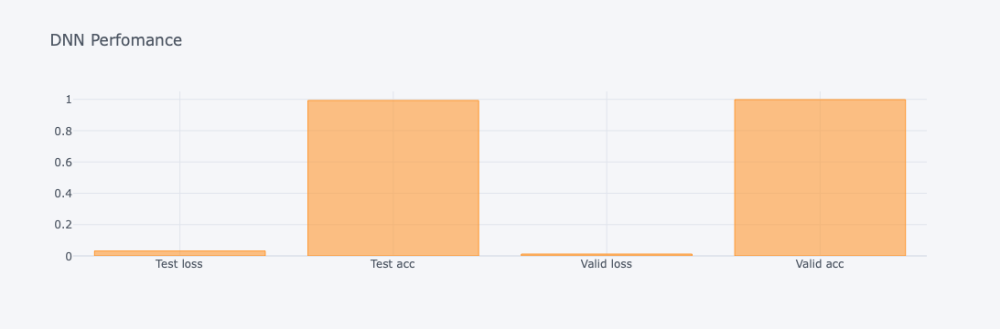

In [56]:
# plot models' performance 
performance.iplot(kind='bar', title='DNN Perfomance')

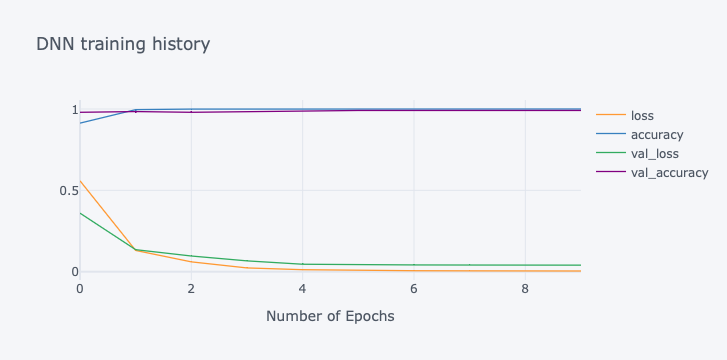

In [57]:
#plot training history
pd.DataFrame(DNN_history.history).drop(['lr'],axis=1).iplot(title ='DNN training history',
                                                                   xaxis_title ='Number of Epochs')

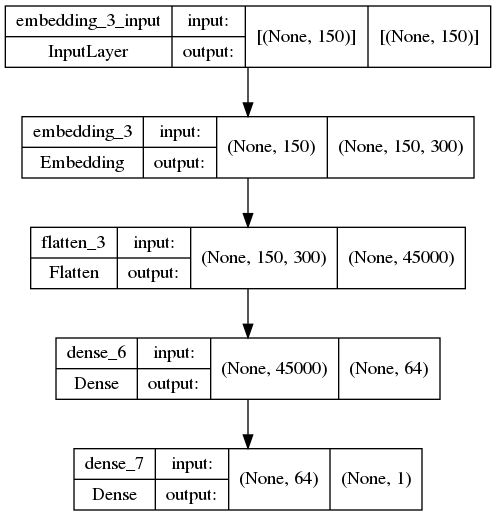

In [58]:
# plot model structure
from tensorflow.keras.utils import plot_model
plot_model(DNN_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [59]:
# display accuracy score, confusion matrix and classification report of tuned model
start = time()
DNN_model_pred = (DNN_model.predict(X_test) > 0.5).astype("int32")[:, 0]
print(f'Prediction was completed in {time() - start:.2f} secs.')
print(accuracy_score(y_test, DNN_model_pred))
print(confusion_matrix(y_test, DNN_model_pred))
print(classification_report(y_test, DNN_model_pred))

Prediction was completed in 0.09 secs.
0.9927927927927928
[[265   2]
 [  2 286]]
              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       267
         1.0       0.99      0.99      0.99       288

    accuracy                           0.99       555
   macro avg       0.99      0.99      0.99       555
weighted avg       0.99      0.99      0.99       555



<AxesSubplot:title={'center':'DNN Model Confusion Matrix'}, xlabel='Predicted label', ylabel='True label'>

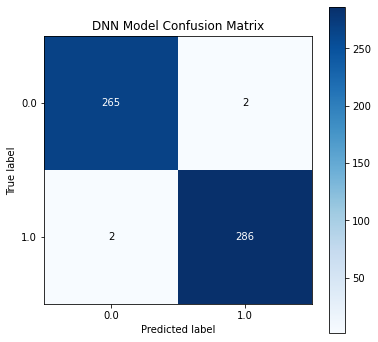

In [163]:
# Plot confusion matrix
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, DNN_model_pred,figsize=(6,6),title='DNN Model Confusion Matrix')

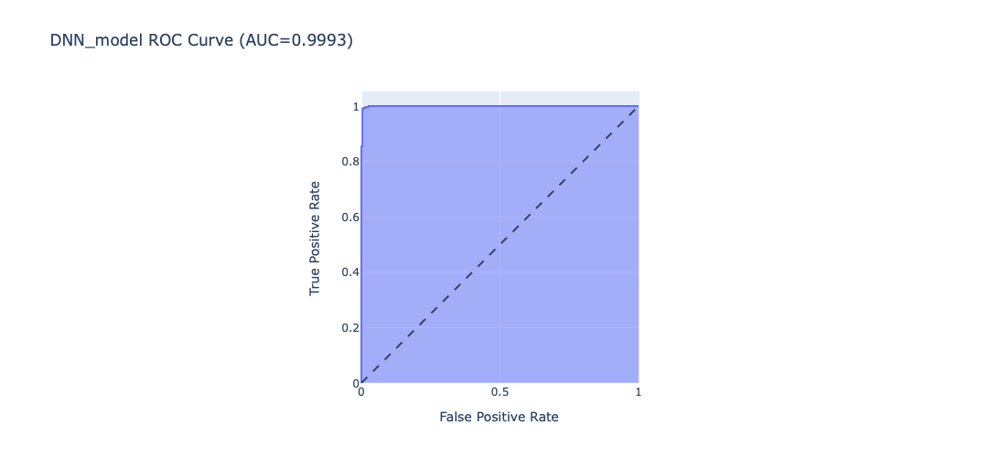

In [61]:
from Utilities.binary_roc_curve import ROC_curve
y_score = DNN_model.predict(X_test)[:, 0]
y_true = y_test
chart_name = 'DNN_model'
ROC_curve(y_true, y_score,chart_name)